In [1]:
import azureml.core
from azureml.core.authentication import InteractiveLoginAuthentication
from azureml.core import Experiment, Workspace

# Check core SDK version number
print("You are currently using version", azureml.core.VERSION, "of the Azure ML SDK")
print("")

# Log In to Azure ML Workspace
interactive_auth = InteractiveLoginAuthentication(tenant_id="76f90eb1-fb9a-4446-9875-4d323d6455ad")

ws = Workspace.from_config(auth=interactive_auth)
print('Workspace name: ' + ws.name, sep='\n')

You are currently using version 1.8.0 of the Azure ML SDK

Workspace name: team25


In [2]:
import pandas as pd

In [3]:
df = pd.read_csv('dataset.csv')

In [4]:
import numpy as np

def custom_metric(uplift, groups, y_true, take_top_ratio=0.25):
    best = np.argsort(-uplift)
    n_samples = int(np.ceil(len(uplift) * take_top_ratio))
    best = best[:n_samples]
    
    test_ind = groups.loc[best][groups.group == 1].index
    control_ind = groups.loc[best][groups.group == 0].index
    
    test_res = y_true.loc[test_ind].sum() / y_true.loc[test_ind].shape
    control_res = y_true.loc[control_ind].sum() / y_true.loc[control_ind].shape

    return (test_res - control_res) * 100

In [5]:
df['group'] = [1 if gr == "test" else 0 for gr in df['group']]

In [6]:
df['gender'] = [1 if value == 'М' else 0 for value in df['gender']]

In [7]:
target = df['response_att']
data = df.drop(columns=['response_att'])

In [9]:
def transform_classify(groups, y):
    return (groups + y + 1) % 2

def transform_regression(groups, y, communication_proba = None):
    if communication_proba is None:
        communication_proba = float(np.sum(groups)) / len(groups)
        print(f"communication proba - {communication_proba}")
        
    new_target = y * ((groups - communication_proba) / (communication_proba * (1 - communication_proba)))
    
    return new_target

In [10]:
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.metrics import log_loss, mean_squared_error
import lightgbm as lqb
import joblib
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import os

def train_model(X, y, exp_name, lqb_params, additional_tags = None, transform_function = transform_classify, score_function = log_loss):
    models_dir = f"models/{exp_name}"
    os.makedirs(models_dir, exist_ok=True)
    
    experiment = Experiment(workspace=ws, name=exp_name)
    if additional_tags is None:
        additional_tags = dict()
    run = experiment.start_logging(
        snapshot_directory=models_dir,
        outputs=models_dir,
        tags=dict(**lqb_params, **additional_tags)
    )
    
    if transform_function == transform_classify:
        folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    else:
        folds = KFold(n_splits=5, shuffle=True, random_state=42)
    
    old_target = y.copy()
    y = transform_function(X['group'], y)
    
    scores = []
    custom_scores = []
    
    feature_importances = np.zeros(X.shape[1] - 1)
    predictions = np.zeros(X.shape[0])
    
    for i, (train_ids, test_ids) in enumerate(folds.split(X, y)):
        print(train_ids.shape)
        X_train = X.iloc[train_ids]
        X_test = X.iloc[test_ids]
    
        train_groups = X_train[["group"]].reset_index(drop=True)
        test_groups = X_test[["group"]].reset_index(drop=True)
        
        X_train = X_train.drop(columns=["group"])
        X_test = X_test.drop(columns=["group"])

        y_train = y.iloc[train_ids]
        y_test = y.iloc[test_ids]
        
        if transform_function == transform_classify:
            model = lqb.LGBMClassifier(**lqb_params)
        else:
            model = lqb.LGBMRegressor(**lqb_params)
        
        model.fit(
            X_train, y_train,
            eval_set=[(X_test, y_test)],
            verbose=50,
            early_stopping_rounds=50,
            eval_metric="logloss"
        )
        
        if transform_function == transform_classify:
            uplift_predictions = model.predict_proba(X_test)[:, 1]
        else:
            uplift_predictions = model.predict(X_test)
        
        predictions[test_ids] = uplift_predictions
        loss = score_function(y_test, uplift_predictions)
        scores.append(loss)
        
        uplift_score = custom_metric(
            uplift_predictions,
            test_groups,
            old_target[test_ids].reset_index(drop=True)
        )[0]
        run.log(name=score_function.__name__, value=loss)
        run.log(name="uplift_score", value=uplift_score)
        joblib.dump(value = model, filename=f"{models_dir}/{i}_model.pkl")
        #run.register_model(model_name=exp_name, model_path=f"models/{exp_name}_model.pkl")
        
        print(uplift_score)
        custom_scores.append(uplift_score)
        
        feature_importances += model.feature_importances_
    
    cross_score = np.mean(scores)
    cross_uplift_score = np.mean(custom_scores)
    
    all_uplift_score = custom_metric(
        predictions,
        X[["group"]].reset_index(drop=True),
        old_target
    )[0]
    
    all_score = score_function(y, predictions)
    
    run.log(name=f"cross_{score_function.__name__}", value=cross_score)
    run.log(name="cross_uplift_score", value=cross_uplift_score)
    run.log(name='all_uplift_score', value=all_uplift_score)
    run.log(name=f"all_{score_function.__name__}_score", value=all_score)
    print(f"cross score - {cross_score}, cross uplift - {cross_uplift_score},"
          f"all_uplift_score - {all_uplift_score}, all score - {all_score}")
    
    run.complete()
    
    feature_columns = list(X.columns)
    feature_columns.remove("group")
    feature_imp = pd.DataFrame(sorted(zip(feature_importances, feature_columns)), 
                                   columns=['Value','Feature']).tail(50)
    plt.figure(figsize=(20, 25))
    sns.set(font_scale=1.5)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
    plt.title('{0} features (avg over {1} folds)'.format(model, 5))
    plt.tight_layout()
    plt.savefig('feature_importance/{}_importances-01.png'.format(model))
    plt.show()          
    
    return cross_uplift_score
        

In [24]:
lqb_params = {
    "boosting_type": "gbdt",
    "feature_fraction": 0.43,
    "learning_rate": 0.09,
    "max_depth": 3,
    "n_estimators": 2000,
    "num_leaves": 13,
    "objective": "binary",
    "subsample": 0.35,
    "n_jobs": 16
}

In [77]:
from hyperopt import hp

lgbm_hp_hyper_space = {
    "boosting_type": hp.choice("boosting_type", ["gbdt", "dart"]),
    "objective": hp.choice("objective", ["binary", "xentropy"]),
    "n_estimators": 2000,
    "learning_rate": hp.uniform("learning_rate", 0.01, 0.1),
    'subsample': hp.uniform('subsample', 0.2, 0.7),
    'feature_fraction': hp.uniform('feature_fraction', 0.2, 0.7),
    "num_leaves": 4 + hp.randint("num_leaves", 12),
    "max_depth": hp.choice("max_depth", [2, 3, 4, 5]),
    "n_jobs": 16
}

In [92]:
from hyperopt import hp

lgbm_hp_hyper_space = {
    "boosting_type": "gbdt",
    "objective": "binary",
    "n_estimators": 2000,
    "learning_rate": hp.uniform("learning_rate", 0.01, 0.1),
    'subsample': 0.35,
    'feature_fraction': hp.uniform('feature_fraction', 0.35, 0.5),
    "num_leaves": 4 + hp.randint("num_leaves", 12),
    "max_depth": hp.choice("max_depth", [3, 4]),
    "n_jobs": 16
}

In [93]:
from hyperopt import fmin, tpe, Trials, space_eval
from functools import partial

trials = Trials()
algo = partial(
    tpe.suggest,
    n_startup_jobs=10,
    gamma=0.25,
    n_EI_candidates=24
)

(549623,)                                             
Training until validation scores don't improve for 50 rounds
[50]	valid_0's binary_logloss: 0.603631               
[100]	valid_0's binary_logloss: 0.600246              
[150]	valid_0's binary_logloss: 0.599216              
[200]	valid_0's binary_logloss: 0.598665              
[250]	valid_0's binary_logloss: 0.598282              
[300]	valid_0's binary_logloss: 0.598181              
[350]	valid_0's binary_logloss: 0.59813               
[400]	valid_0's binary_logloss: 0.598066              
[450]	valid_0's binary_logloss: 0.598013              
[500]	valid_0's binary_logloss: 0.597963              
[550]	valid_0's binary_logloss: 0.59797               
Early stopping, best iteration is:                    
[517]	valid_0's binary_logloss: 0.597961
6.1756173115561195                                    
(549623,)                                             
  0%|          | 0/50 [00:40<?, ?trial/s, best loss=?]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds
[50]	valid_0's binary_logloss: 0.603549               
[100]	valid_0's binary_logloss: 0.600203              
[150]	valid_0's binary_logloss: 0.599179              
[200]	valid_0's binary_logloss: 0.598676              
[250]	valid_0's binary_logloss: 0.598402              
[300]	valid_0's binary_logloss: 0.598327              
[350]	valid_0's binary_logloss: 0.598304              
[400]	valid_0's binary_logloss: 0.598281              
[450]	valid_0's binary_logloss: 0.598228              
[500]	valid_0's binary_logloss: 0.598215              
[550]	valid_0's binary_logloss: 0.598208              
[600]	valid_0's binary_logloss: 0.598159              
[650]	valid_0's binary_logloss: 0.598156              
Early stopping, best iteration is:                    
[615]	valid_0's binary_logloss: 0.598148
6.439826359640979                                     
(549623,)                                             
  0%|          | 0

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds
[50]	valid_0's binary_logloss: 0.603561               
[100]	valid_0's binary_logloss: 0.600092              
[150]	valid_0's binary_logloss: 0.599069              
[200]	valid_0's binary_logloss: 0.59856               
[250]	valid_0's binary_logloss: 0.598224              
[300]	valid_0's binary_logloss: 0.598177              
[350]	valid_0's binary_logloss: 0.598111              
[400]	valid_0's binary_logloss: 0.598083              
[450]	valid_0's binary_logloss: 0.598068              
[500]	valid_0's binary_logloss: 0.598062              
Early stopping, best iteration is:                    
[469]	valid_0's binary_logloss: 0.598043
6.014567526031414                                     
(549623,)                                             
  0%|          | 0/50 [01:59<?, ?trial/s, best loss=?]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds
[50]	valid_0's binary_logloss: 0.603375               
[100]	valid_0's binary_logloss: 0.599845              
[150]	valid_0's binary_logloss: 0.598846              
[200]	valid_0's binary_logloss: 0.598328              
[250]	valid_0's binary_logloss: 0.598011              
[300]	valid_0's binary_logloss: 0.597933              
[350]	valid_0's binary_logloss: 0.597863              
[400]	valid_0's binary_logloss: 0.597822              
[450]	valid_0's binary_logloss: 0.597798              
[500]	valid_0's binary_logloss: 0.597773              
[550]	valid_0's binary_logloss: 0.597758              
[600]	valid_0's binary_logloss: 0.597741              
[650]	valid_0's binary_logloss: 0.597695              
[700]	valid_0's binary_logloss: 0.597694              
[750]	valid_0's binary_logloss: 0.597674              
[800]	valid_0's binary_logloss: 0.597653              
[850]	valid_0's binary_logloss: 0.597656              
Earl

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds
[50]	valid_0's binary_logloss: 0.603608               
[100]	valid_0's binary_logloss: 0.600176              
[150]	valid_0's binary_logloss: 0.599185              
[200]	valid_0's binary_logloss: 0.598686              
[250]	valid_0's binary_logloss: 0.598377              
[300]	valid_0's binary_logloss: 0.598277              
[350]	valid_0's binary_logloss: 0.598185              
[400]	valid_0's binary_logloss: 0.598112              
[450]	valid_0's binary_logloss: 0.598091              
[500]	valid_0's binary_logloss: 0.598047              
[550]	valid_0's binary_logloss: 0.598033              
[600]	valid_0's binary_logloss: 0.598002              
[650]	valid_0's binary_logloss: 0.597997              
[700]	valid_0's binary_logloss: 0.597993              
Early stopping, best iteration is:                    
[679]	valid_0's binary_logloss: 0.597989
6.769821694671396                                     
  0%|          | 0

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.597958360274671, cross uplift - 6.3172922660242055,all_uplift_score - 6.300224729945364, all logloss - 0.597958360229949
  0%|          | 0/50 [03:45<?, ?trial/s, best loss=?]

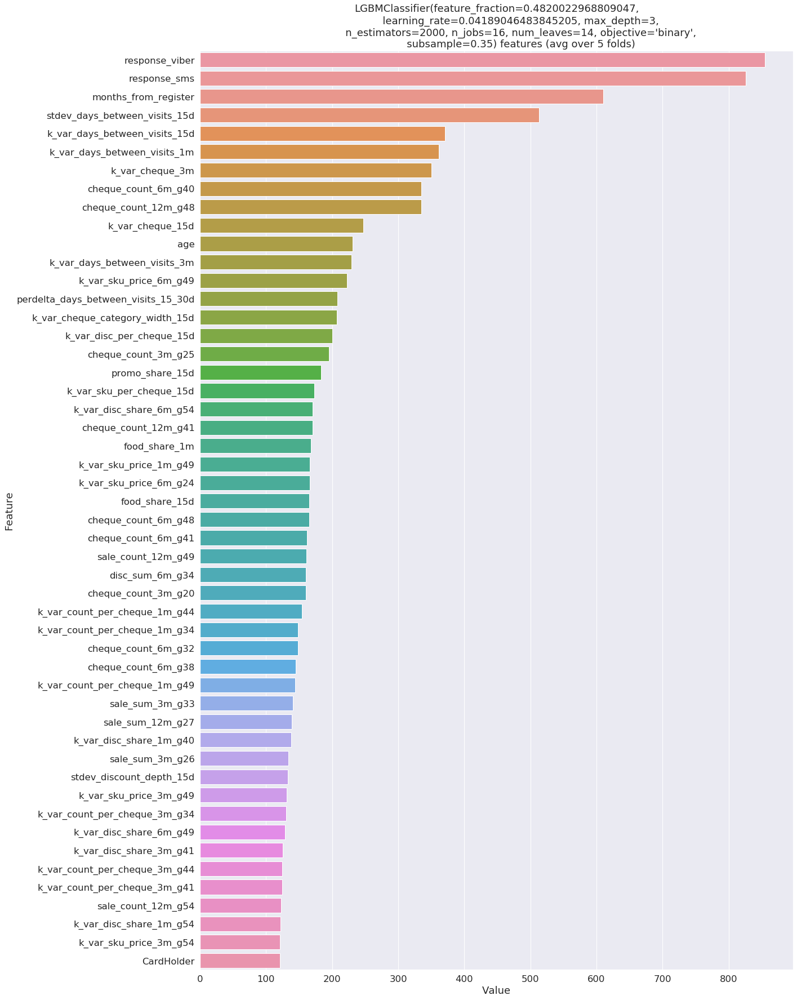

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600339                                             
[100]	valid_0's binary_logloss: 0.597895                                            
[150]	valid_0's binary_logloss: 0.597638                                            
[200]	valid_0's binary_logloss: 0.597592                                            
[250]	valid_0's binary_logloss: 0.597412                                            
[300]	valid_0's binary_logloss: 0.597409                                            
[350]	valid_0's binary_logloss: 0.597402                                            
[400]	valid_0's binary_logloss: 0.597407                                            
Early stopping, best iteration is:                                                  
[377]	valid_0's binary_logloss: 0.597384
6.246132696918952       

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600308                                             
[100]	valid_0's binary_logloss: 0.597912                                            
[150]	valid_0's binary_logloss: 0.59772                                             
[200]	valid_0's binary_logloss: 0.597646                                            
[250]	valid_0's binary_logloss: 0.597604                                            
[300]	valid_0's binary_logloss: 0.59757                                             
[350]	valid_0's binary_logloss: 0.597596                                            
Early stopping, best iteration is:                                                  
[302]	valid_0's binary_logloss: 0.597552
6.390795725011259                                                                   
(549623,)                                                                           
  2%|▏         | 1/50 [0

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600272                                             
[100]	valid_0's binary_logloss: 0.597956                                            
[150]	valid_0's binary_logloss: 0.59784                                             
[200]	valid_0's binary_logloss: 0.597715                                            
[250]	valid_0's binary_logloss: 0.597642                                            
[300]	valid_0's binary_logloss: 0.597517                                            
[350]	valid_0's binary_logloss: 0.597502                                            
Early stopping, best iteration is:                                                  
[325]	valid_0's binary_logloss: 0.597495
5.9345865631202175                                                                  
(549623,)                                                                           
  2%|▏         | 1/50 [0

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.599992                                             
[100]	valid_0's binary_logloss: 0.597627                                            
[150]	valid_0's binary_logloss: 0.597445                                            
[200]	valid_0's binary_logloss: 0.597344                                            
[250]	valid_0's binary_logloss: 0.597281                                            
[300]	valid_0's binary_logloss: 0.59723                                             
[350]	valid_0's binary_logloss: 0.597133                                            
[400]	valid_0's binary_logloss: 0.597139                                            
Early stopping, best iteration is:                                                  
[350]	valid_0's binary_logloss: 0.597133
6.170370316594917                                                                   
(549624,)               

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600365                                             
[100]	valid_0's binary_logloss: 0.597949                                            
[150]	valid_0's binary_logloss: 0.597707                                            
[200]	valid_0's binary_logloss: 0.597645                                            
Early stopping, best iteration is:                                                  
[185]	valid_0's binary_logloss: 0.597636
6.816894126654299                                                                   
  2%|▏         | 1/50 [05:56<3:10:18, 233.03s/trial, best loss: -6.3172922660242055]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5974401504199515, cross uplift - 6.311755885659929,all_uplift_score - 6.312119581808318, all logloss - 0.5974401501346598
  2%|▏         | 1/50 [05:57<3:10:18, 233.03s/trial, best loss: -6.3172922660242055]

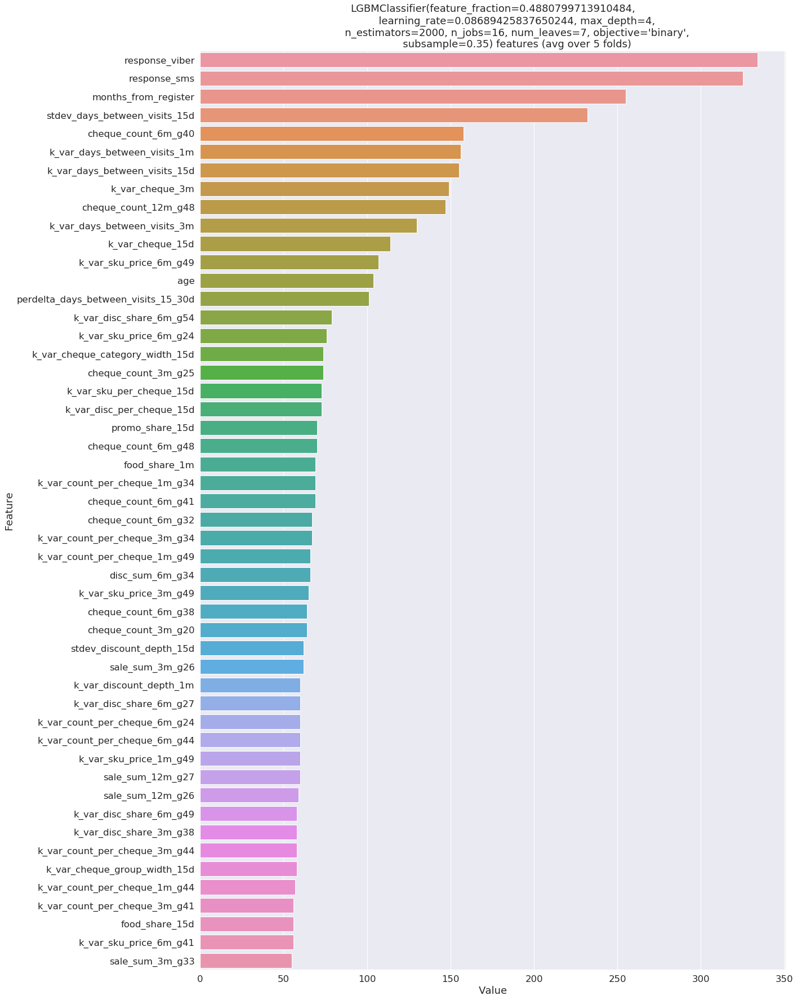

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.605474                                             
[100]	valid_0's binary_logloss: 0.601956                                            
[150]	valid_0's binary_logloss: 0.600273                                            
[200]	valid_0's binary_logloss: 0.599234                                            
[250]	valid_0's binary_logloss: 0.598566                                            
[300]	valid_0's binary_logloss: 0.598253                                            
[350]	valid_0's binary_logloss: 0.598079                                            
[400]	valid_0's binary_logloss: 0.597994                                            
[450]	valid_0's binary_logloss: 0.597961                                            
[500]	valid_0's binary_logloss: 0.597862                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.605385                                             
[100]	valid_0's binary_logloss: 0.601799                                            
[150]	valid_0's binary_logloss: 0.600164                                            
[200]	valid_0's binary_logloss: 0.599244                                            
[250]	valid_0's binary_logloss: 0.598611                                            
[300]	valid_0's binary_logloss: 0.598282                                            
[350]	valid_0's binary_logloss: 0.59814                                             
[400]	valid_0's binary_logloss: 0.598045                                            
[450]	valid_0's binary_logloss: 0.597982                                            
[500]	valid_0's binary_logloss: 0.597921                                            
[550]	valid_0's binary_logloss: 0.597885                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.605531                                             
[100]	valid_0's binary_logloss: 0.601878                                            
[150]	valid_0's binary_logloss: 0.600209                                            
[200]	valid_0's binary_logloss: 0.599188                                            
[250]	valid_0's binary_logloss: 0.598557                                            
[300]	valid_0's binary_logloss: 0.59825                                             
[350]	valid_0's binary_logloss: 0.59805                                             
[400]	valid_0's binary_logloss: 0.597984                                            
[450]	valid_0's binary_logloss: 0.597887                                            
[500]	valid_0's binary_logloss: 0.597858                                            
[550]	valid_0's binary_logloss: 0.597818                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.605364                                             
[100]	valid_0's binary_logloss: 0.601714                                            
[150]	valid_0's binary_logloss: 0.600033                                            
[200]	valid_0's binary_logloss: 0.599067                                            
[250]	valid_0's binary_logloss: 0.598405                                            
[300]	valid_0's binary_logloss: 0.5981                                              
[350]	valid_0's binary_logloss: 0.597865                                            
[400]	valid_0's binary_logloss: 0.597712                                            
[450]	valid_0's binary_logloss: 0.597675                                            
[500]	valid_0's binary_logloss: 0.59765                                             
[550]	valid_0's binary_logloss: 0.597645                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.605538                                             
[100]	valid_0's binary_logloss: 0.601971                                            
[150]	valid_0's binary_logloss: 0.600332                                            
[200]	valid_0's binary_logloss: 0.599318                                            
[250]	valid_0's binary_logloss: 0.598656                                            
[300]	valid_0's binary_logloss: 0.598346                                            
[350]	valid_0's binary_logloss: 0.598112                                            
[400]	valid_0's binary_logloss: 0.597976                                            
[450]	valid_0's binary_logloss: 0.597892                                            
[500]	valid_0's binary_logloss: 0.597865                                            
[550]	valid_0's binary_logloss: 0.597816                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5976775841324294, cross uplift - 6.351169676575696,all_uplift_score - 6.36299163184307, all logloss - 0.5976775842106221
  4%|▍         | 2/50 [09:29<2:41:08, 201.42s/trial, best loss: -6.3172922660242055]

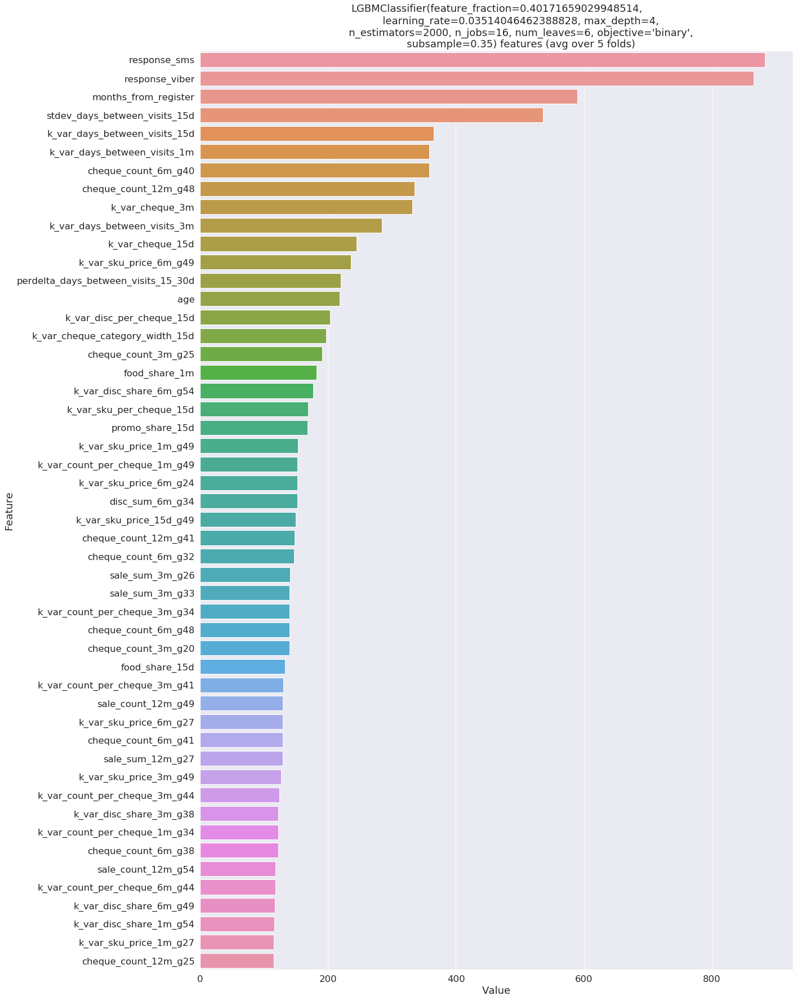

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.600941                                            
[100]	valid_0's binary_logloss: 0.598932                                           
[150]	valid_0's binary_logloss: 0.598579                                           
[200]	valid_0's binary_logloss: 0.598469                                           
[250]	valid_0's binary_logloss: 0.59843                                            
[300]	valid_0's binary_logloss: 0.598354                                           
[350]	valid_0's binary_logloss: 0.598311                                           
[400]	valid_0's binary_logloss: 0.598294                                           
[450]	valid_0's binary_logloss: 0.598245                                           
[500]	valid_0's binary_logloss: 0.598201                                   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.600953                                            
[100]	valid_0's binary_logloss: 0.598922                                           
[150]	valid_0's binary_logloss: 0.598666                                           
[200]	valid_0's binary_logloss: 0.598563                                           
[250]	valid_0's binary_logloss: 0.598482                                           
[300]	valid_0's binary_logloss: 0.598435                                           
[350]	valid_0's binary_logloss: 0.598422                                           
[400]	valid_0's binary_logloss: 0.598398                                           
Early stopping, best iteration is:                                                 
[374]	valid_0's binary_logloss: 0.598394
6.399780493969157                                                                  
(549623,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.600827                                            
[100]	valid_0's binary_logloss: 0.598807                                           
[150]	valid_0's binary_logloss: 0.598443                                           
[200]	valid_0's binary_logloss: 0.598333                                           
[250]	valid_0's binary_logloss: 0.598285                                           
[300]	valid_0's binary_logloss: 0.598241                                           
[350]	valid_0's binary_logloss: 0.598241                                           
Early stopping, best iteration is:                                                 
[310]	valid_0's binary_logloss: 0.598229
5.808941983995871                                                                  
(549623,)                                                                          
  6%|▌         | 3/50 [10:39<2:41:2

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.600656                                            
[100]	valid_0's binary_logloss: 0.598502                                           
[150]	valid_0's binary_logloss: 0.598209                                           
[200]	valid_0's binary_logloss: 0.5981                                             
[250]	valid_0's binary_logloss: 0.598085                                           
[300]	valid_0's binary_logloss: 0.598023                                           
[350]	valid_0's binary_logloss: 0.59796                                            
[400]	valid_0's binary_logloss: 0.59792                                            
Early stopping, best iteration is:                                                 
[374]	valid_0's binary_logloss: 0.597903
6.01710086998381                                                                   
(549624,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.600881                                            
[100]	valid_0's binary_logloss: 0.598808                                           
[150]	valid_0's binary_logloss: 0.598494                                           
[200]	valid_0's binary_logloss: 0.598425                                           
[250]	valid_0's binary_logloss: 0.598302                                           
[300]	valid_0's binary_logloss: 0.598238                                           
Early stopping, best iteration is:                                                 
[278]	valid_0's binary_logloss: 0.598232
6.850529767221494                                                                  
  6%|▌         | 3/50 [11:27<2:41:21, 205.99s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.598171514991133, cross uplift - 6.232878415700228,all_uplift_score - 6.226453225624931, all logloss - 0.5981715149035693
  6%|▌         | 3/50 [11:28<2:41:21, 205.99s/trial, best loss: -6.351169676575696]

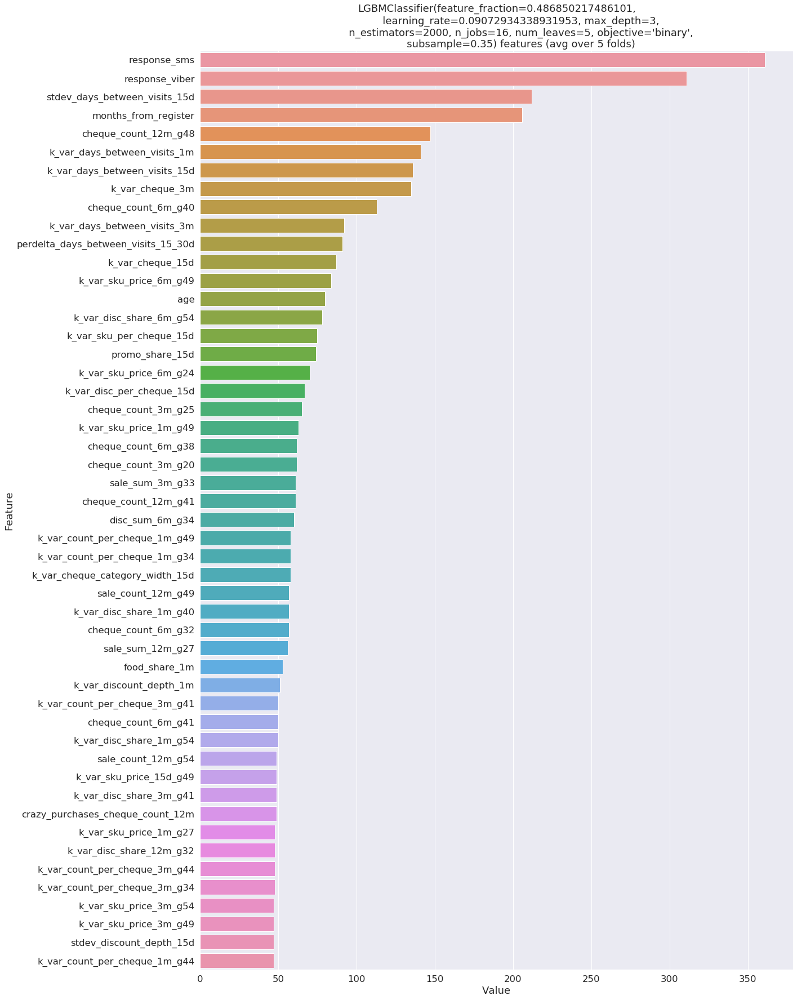

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60538                                             
[100]	valid_0's binary_logloss: 0.601395                                           
[150]	valid_0's binary_logloss: 0.599795                                           
[200]	valid_0's binary_logloss: 0.598907                                           
[250]	valid_0's binary_logloss: 0.598186                                           
[300]	valid_0's binary_logloss: 0.597885                                           
[350]	valid_0's binary_logloss: 0.597572                                           
[400]	valid_0's binary_logloss: 0.59743                                            
[450]	valid_0's binary_logloss: 0.59739                                            
[500]	valid_0's binary_logloss: 0.597339                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.605258                                            
[100]	valid_0's binary_logloss: 0.601339                                           
[150]	valid_0's binary_logloss: 0.59981                                            
[200]	valid_0's binary_logloss: 0.598946                                           
[250]	valid_0's binary_logloss: 0.598278                                           
[300]	valid_0's binary_logloss: 0.598018                                           
[350]	valid_0's binary_logloss: 0.597751                                           
[400]	valid_0's binary_logloss: 0.597616                                           
[450]	valid_0's binary_logloss: 0.597543                                           
[500]	valid_0's binary_logloss: 0.597552                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.605349                                            
[100]	valid_0's binary_logloss: 0.601382                                           
[150]	valid_0's binary_logloss: 0.599812                                           
[200]	valid_0's binary_logloss: 0.59894                                            
[250]	valid_0's binary_logloss: 0.598198                                           
[300]	valid_0's binary_logloss: 0.597909                                           
[350]	valid_0's binary_logloss: 0.597626                                           
[400]	valid_0's binary_logloss: 0.597522                                           
[450]	valid_0's binary_logloss: 0.597469                                           
[500]	valid_0's binary_logloss: 0.597459                                           
[550]	valid_0's binary_logloss: 0.597436                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.605217                                            
[100]	valid_0's binary_logloss: 0.601144                                           
[150]	valid_0's binary_logloss: 0.599559                                           
[200]	valid_0's binary_logloss: 0.598681                                           
[250]	valid_0's binary_logloss: 0.597993                                           
[300]	valid_0's binary_logloss: 0.597707                                           
[350]	valid_0's binary_logloss: 0.597447                                           
[400]	valid_0's binary_logloss: 0.597293                                           
[450]	valid_0's binary_logloss: 0.597268                                           
[500]	valid_0's binary_logloss: 0.597227                                           
[550]	valid_0's binary_logloss: 0.597197                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.605357                                            
[100]	valid_0's binary_logloss: 0.601415                                           
[150]	valid_0's binary_logloss: 0.599808                                           
[200]	valid_0's binary_logloss: 0.598942                                           
[250]	valid_0's binary_logloss: 0.598214                                           
[300]	valid_0's binary_logloss: 0.59792                                            
[350]	valid_0's binary_logloss: 0.597634                                           
[400]	valid_0's binary_logloss: 0.597477                                           
[450]	valid_0's binary_logloss: 0.597418                                           
[500]	valid_0's binary_logloss: 0.597396                                           
[550]	valid_0's binary_logloss: 0.597336                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5973170880042835, cross uplift - 6.302209482854005,all_uplift_score - 6.301301897618125, all logloss - 0.5973170880400606
  8%|▊         | 4/50 [15:24<2:18:00, 180.02s/trial, best loss: -6.351169676575696]

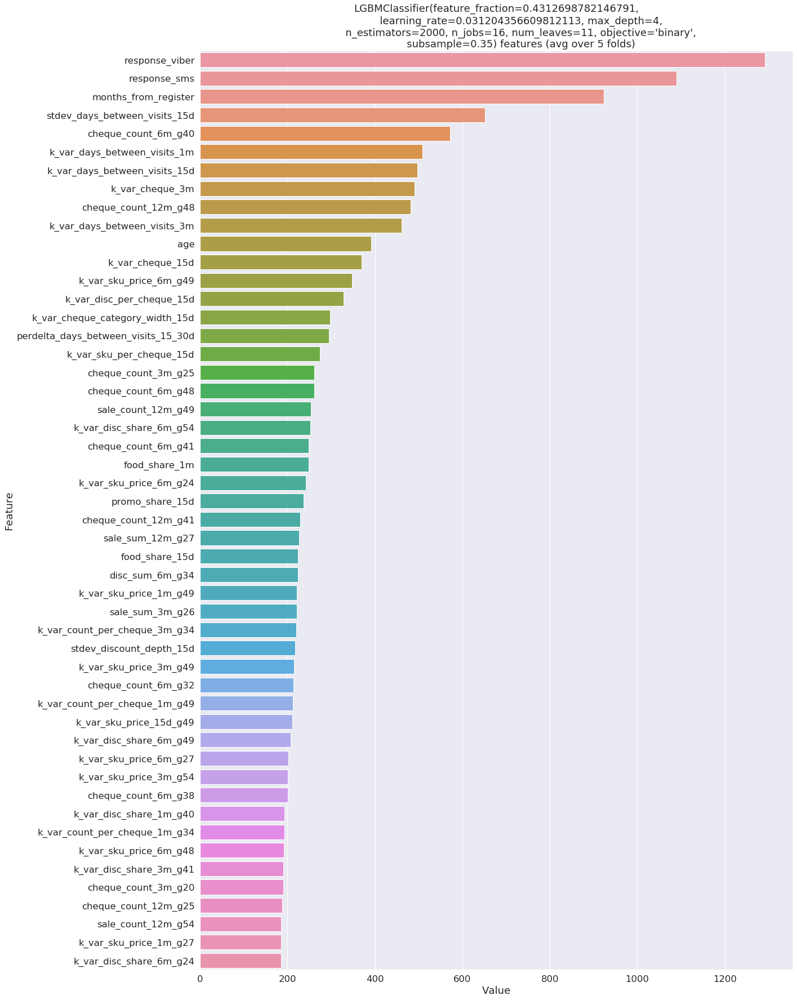

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602209                                            
[100]	valid_0's binary_logloss: 0.598941                                           
[150]	valid_0's binary_logloss: 0.598011                                           
[200]	valid_0's binary_logloss: 0.597573                                           
[250]	valid_0's binary_logloss: 0.597451                                           
[300]	valid_0's binary_logloss: 0.59735                                            
Early stopping, best iteration is:                                                 
[295]	valid_0's binary_logloss: 0.597342
6.153344397000968                                                                  
(549623,)                                                                          
 10%|█         | 5/50 [15:55<2:26:2

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601986                                            
[100]	valid_0's binary_logloss: 0.598909                                           
[150]	valid_0's binary_logloss: 0.598002                                           
[200]	valid_0's binary_logloss: 0.597574                                           
[250]	valid_0's binary_logloss: 0.597486                                           
[300]	valid_0's binary_logloss: 0.597457                                           
[350]	valid_0's binary_logloss: 0.597443                                           
[400]	valid_0's binary_logloss: 0.597469                                           
Early stopping, best iteration is:                                                 
[364]	valid_0's binary_logloss: 0.597431
6.338257366197849                                                                  
(549623,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602148                                            
[100]	valid_0's binary_logloss: 0.598914                                           
[150]	valid_0's binary_logloss: 0.597935                                           
[200]	valid_0's binary_logloss: 0.59751                                            
[250]	valid_0's binary_logloss: 0.59743                                            
Early stopping, best iteration is:                                                 
[242]	valid_0's binary_logloss: 0.597424
5.969164712687228                                                                  
(549623,)                                                                          
 10%|█         | 5/50 [16:50<2:26:20, 195.13s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60191                                             
[100]	valid_0's binary_logloss: 0.598681                                           
[150]	valid_0's binary_logloss: 0.597767                                           
[200]	valid_0's binary_logloss: 0.597363                                           
[250]	valid_0's binary_logloss: 0.59728                                            
[300]	valid_0's binary_logloss: 0.597239                                           
[350]	valid_0's binary_logloss: 0.597232                                           
[400]	valid_0's binary_logloss: 0.597183                                           
Early stopping, best iteration is:                                                 
[399]	valid_0's binary_logloss: 0.597178
6.2678262511988185                                                                 
(549624,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602203                                            
[100]	valid_0's binary_logloss: 0.598971                                           
[150]	valid_0's binary_logloss: 0.598024                                           
[200]	valid_0's binary_logloss: 0.597561                                           
[250]	valid_0's binary_logloss: 0.597487                                           
[300]	valid_0's binary_logloss: 0.597467                                           
[350]	valid_0's binary_logloss: 0.597459                                           
Early stopping, best iteration is:                                                 
[342]	valid_0's binary_logloss: 0.597454
6.800820329445456                                                                  
 10%|█         | 5/50 [17:51<2:26:20, 195.13s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5973659988694885, cross uplift - 6.305882611306065,all_uplift_score - 6.278486462275579, all logloss - 0.5973659987413374
 10%|█         | 5/50 [17:51<2:26:20, 195.13s/trial, best loss: -6.351169676575696]

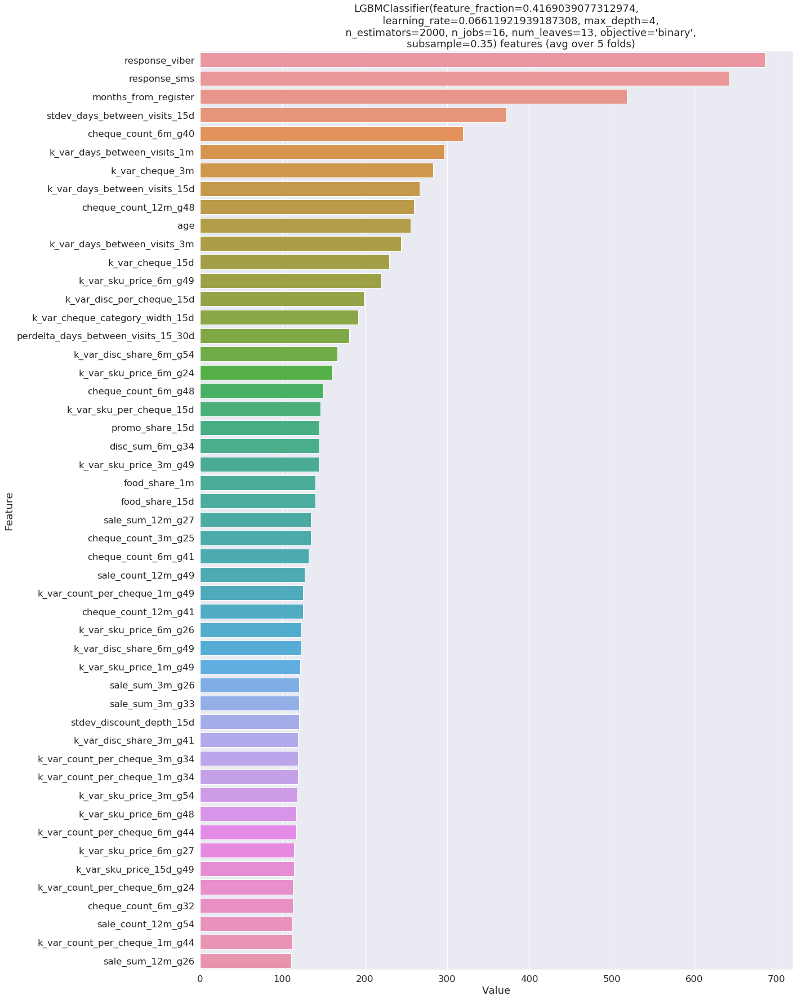

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.604068                                            
[100]	valid_0's binary_logloss: 0.600369                                           
[150]	valid_0's binary_logloss: 0.598999                                           
[200]	valid_0's binary_logloss: 0.598341                                           
[250]	valid_0's binary_logloss: 0.598018                                           
[300]	valid_0's binary_logloss: 0.597944                                           
[350]	valid_0's binary_logloss: 0.597848                                           
[400]	valid_0's binary_logloss: 0.597783                                           
[450]	valid_0's binary_logloss: 0.597736                                           
[500]	valid_0's binary_logloss: 0.597697                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603973                                            
[100]	valid_0's binary_logloss: 0.600367                                           
[150]	valid_0's binary_logloss: 0.59904                                            
[200]	valid_0's binary_logloss: 0.598418                                           
[250]	valid_0's binary_logloss: 0.598179                                           
[300]	valid_0's binary_logloss: 0.598082                                           
[350]	valid_0's binary_logloss: 0.597981                                           
[400]	valid_0's binary_logloss: 0.597951                                           
[450]	valid_0's binary_logloss: 0.597873                                           
[500]	valid_0's binary_logloss: 0.597864                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.604099                                            
[100]	valid_0's binary_logloss: 0.60028                                            
[150]	valid_0's binary_logloss: 0.598921                                           
[200]	valid_0's binary_logloss: 0.598286                                           
[250]	valid_0's binary_logloss: 0.597987                                           
[300]	valid_0's binary_logloss: 0.597939                                           
[350]	valid_0's binary_logloss: 0.597862                                           
[400]	valid_0's binary_logloss: 0.597834                                           
[450]	valid_0's binary_logloss: 0.597791                                           
[500]	valid_0's binary_logloss: 0.597693                                           
[550]	valid_0's binary_logloss: 0.597692                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603884                                            
[100]	valid_0's binary_logloss: 0.600046                                           
[150]	valid_0's binary_logloss: 0.598723                                           
[200]	valid_0's binary_logloss: 0.598126                                           
[250]	valid_0's binary_logloss: 0.597787                                           
[300]	valid_0's binary_logloss: 0.597671                                           
[350]	valid_0's binary_logloss: 0.597622                                           
[400]	valid_0's binary_logloss: 0.597566                                           
[450]	valid_0's binary_logloss: 0.597533                                           
[500]	valid_0's binary_logloss: 0.597515                                           
[550]	valid_0's binary_logloss: 0.597474                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.604148                                            
[100]	valid_0's binary_logloss: 0.600365                                           
[150]	valid_0's binary_logloss: 0.599054                                           
[200]	valid_0's binary_logloss: 0.598438                                           
[250]	valid_0's binary_logloss: 0.598148                                           
[300]	valid_0's binary_logloss: 0.598046                                           
[350]	valid_0's binary_logloss: 0.597967                                           
[400]	valid_0's binary_logloss: 0.597826                                           
[450]	valid_0's binary_logloss: 0.597785                                           
[500]	valid_0's binary_logloss: 0.597726                                           
[550]	valid_0's binary_logloss: 0.597707                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5976091239755881, cross uplift - 6.279114091205301,all_uplift_score - 6.271005309703531, all logloss - 0.5976091239904782
 12%|█▏        | 6/50 [21:14<2:12:43, 180.99s/trial, best loss: -6.351169676575696]

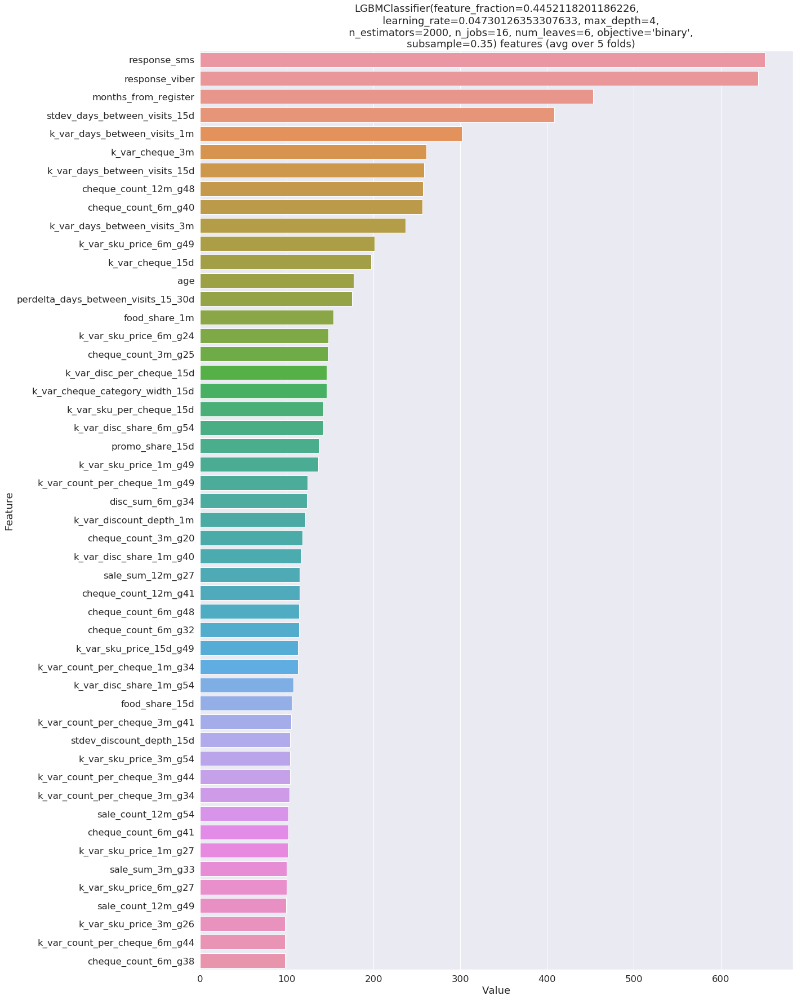

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603323                                            
[100]	valid_0's binary_logloss: 0.600087                                           
[150]	valid_0's binary_logloss: 0.598966                                           
[200]	valid_0's binary_logloss: 0.598397                                           
[250]	valid_0's binary_logloss: 0.598187                                           
[300]	valid_0's binary_logloss: 0.598104                                           
[350]	valid_0's binary_logloss: 0.598057                                           
[400]	valid_0's binary_logloss: 0.59801                                            
[450]	valid_0's binary_logloss: 0.597975                                           
[500]	valid_0's binary_logloss: 0.597963                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603144                                            
[100]	valid_0's binary_logloss: 0.600014                                           
[150]	valid_0's binary_logloss: 0.598985                                           
[200]	valid_0's binary_logloss: 0.598501                                           
[250]	valid_0's binary_logloss: 0.598349                                           
[300]	valid_0's binary_logloss: 0.598269                                           
[350]	valid_0's binary_logloss: 0.598252                                           
[400]	valid_0's binary_logloss: 0.598235                                           
[450]	valid_0's binary_logloss: 0.598192                                           
[500]	valid_0's binary_logloss: 0.5982                                             
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603278                                            
[100]	valid_0's binary_logloss: 0.600048                                           
[150]	valid_0's binary_logloss: 0.59894                                            
[200]	valid_0's binary_logloss: 0.598411                                           
[250]	valid_0's binary_logloss: 0.598225                                           
[300]	valid_0's binary_logloss: 0.598184                                           
[350]	valid_0's binary_logloss: 0.598117                                           
[400]	valid_0's binary_logloss: 0.598092                                           
[450]	valid_0's binary_logloss: 0.598075                                           
[500]	valid_0's binary_logloss: 0.59809                                            
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603122                                            
[100]	valid_0's binary_logloss: 0.599883                                           
[150]	valid_0's binary_logloss: 0.598777                                           
[200]	valid_0's binary_logloss: 0.598246                                           
[250]	valid_0's binary_logloss: 0.598036                                           
[300]	valid_0's binary_logloss: 0.597979                                           
[350]	valid_0's binary_logloss: 0.597952                                           
[400]	valid_0's binary_logloss: 0.597889                                           
[450]	valid_0's binary_logloss: 0.597856                                           
[500]	valid_0's binary_logloss: 0.59782                                            
[550]	valid_0's binary_logloss: 0.597799                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603389                                            
[100]	valid_0's binary_logloss: 0.600094                                           
[150]	valid_0's binary_logloss: 0.598998                                           
[200]	valid_0's binary_logloss: 0.598479                                           
[250]	valid_0's binary_logloss: 0.59826                                            
[300]	valid_0's binary_logloss: 0.598184                                           
[350]	valid_0's binary_logloss: 0.5981                                             
[400]	valid_0's binary_logloss: 0.598057                                           
[450]	valid_0's binary_logloss: 0.598008                                           
[500]	valid_0's binary_logloss: 0.597992                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.597986083293925, cross uplift - 6.284265377232592,all_uplift_score - 6.298532678836166, all logloss - 0.5979860832863443
 14%|█▍        | 7/50 [24:37<2:14:35, 187.79s/trial, best loss: -6.351169676575696]

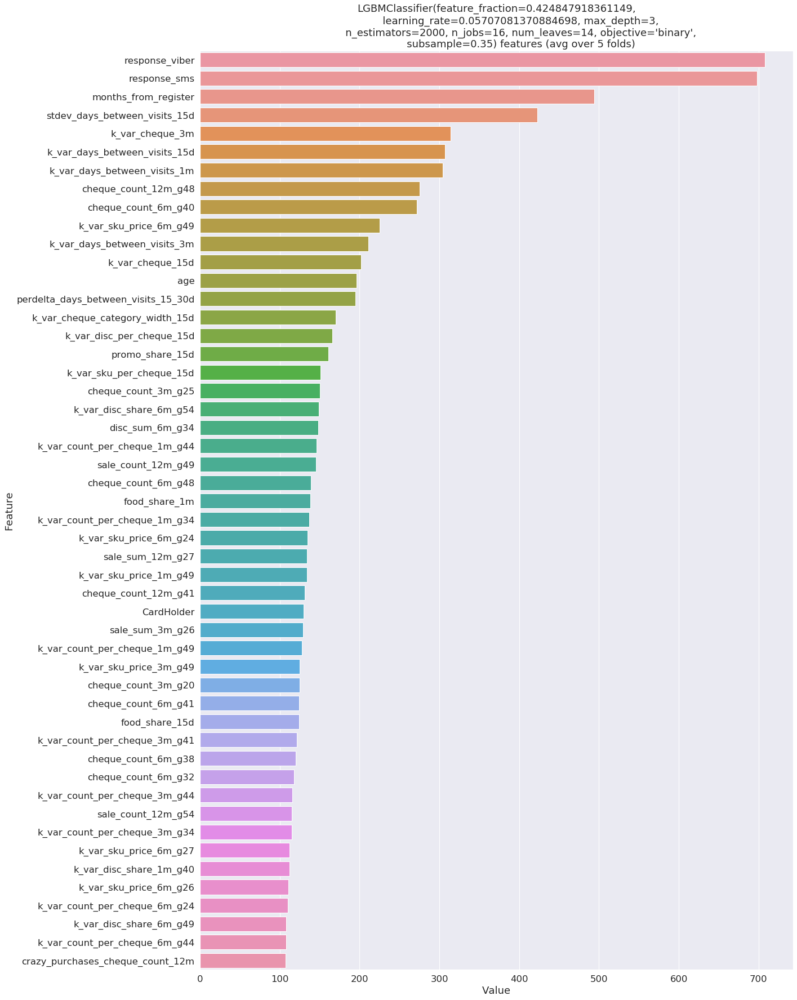

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.604705                                            
[100]	valid_0's binary_logloss: 0.601543                                           
[150]	valid_0's binary_logloss: 0.600158                                           
[200]	valid_0's binary_logloss: 0.599603                                           
[250]	valid_0's binary_logloss: 0.599042                                           
[300]	valid_0's binary_logloss: 0.598918                                           
[350]	valid_0's binary_logloss: 0.598813                                           
[400]	valid_0's binary_logloss: 0.598767                                           
[450]	valid_0's binary_logloss: 0.598712                                           
[500]	valid_0's binary_logloss: 0.598671                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60453                                             
[100]	valid_0's binary_logloss: 0.601486                                           
[150]	valid_0's binary_logloss: 0.600159                                           
[200]	valid_0's binary_logloss: 0.5996                                             
[250]	valid_0's binary_logloss: 0.599118                                           
[300]	valid_0's binary_logloss: 0.59904                                            
[350]	valid_0's binary_logloss: 0.598962                                           
[400]	valid_0's binary_logloss: 0.598858                                           
[450]	valid_0's binary_logloss: 0.598799                                           
[500]	valid_0's binary_logloss: 0.598767                                           
[550]	valid_0's binary_logloss: 0.598767                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60461                                             
[100]	valid_0's binary_logloss: 0.601445                                           
[150]	valid_0's binary_logloss: 0.600035                                           
[200]	valid_0's binary_logloss: 0.599459                                           
[250]	valid_0's binary_logloss: 0.598982                                           
[300]	valid_0's binary_logloss: 0.598869                                           
[350]	valid_0's binary_logloss: 0.598785                                           
[400]	valid_0's binary_logloss: 0.598741                                           
[450]	valid_0's binary_logloss: 0.598713                                           
[500]	valid_0's binary_logloss: 0.598673                                           
[550]	valid_0's binary_logloss: 0.598646                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.604474                                            
[100]	valid_0's binary_logloss: 0.601298                                           
[150]	valid_0's binary_logloss: 0.599898                                           
[200]	valid_0's binary_logloss: 0.599326                                           
[250]	valid_0's binary_logloss: 0.598793                                           
[300]	valid_0's binary_logloss: 0.598676                                           
[350]	valid_0's binary_logloss: 0.59863                                            
[400]	valid_0's binary_logloss: 0.598521                                           
[450]	valid_0's binary_logloss: 0.598478                                           
[500]	valid_0's binary_logloss: 0.598451                                           
[550]	valid_0's binary_logloss: 0.598422                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.604725                                            
[100]	valid_0's binary_logloss: 0.601723                                           
[150]	valid_0's binary_logloss: 0.600324                                           
[200]	valid_0's binary_logloss: 0.599762                                           
[250]	valid_0's binary_logloss: 0.599214                                           
[300]	valid_0's binary_logloss: 0.599122                                           
[350]	valid_0's binary_logloss: 0.598989                                           
[400]	valid_0's binary_logloss: 0.598922                                           
[450]	valid_0's binary_logloss: 0.598895                                           
[500]	valid_0's binary_logloss: 0.598852                                           
[550]	valid_0's binary_logloss: 0.598821                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5984748920544058, cross uplift - 6.255411092912925,all_uplift_score - 6.2659388509087, all logloss - 0.5984748918845187
 16%|█▌        | 8/50 [29:49<2:15:32, 193.64s/trial, best loss: -6.351169676575696]

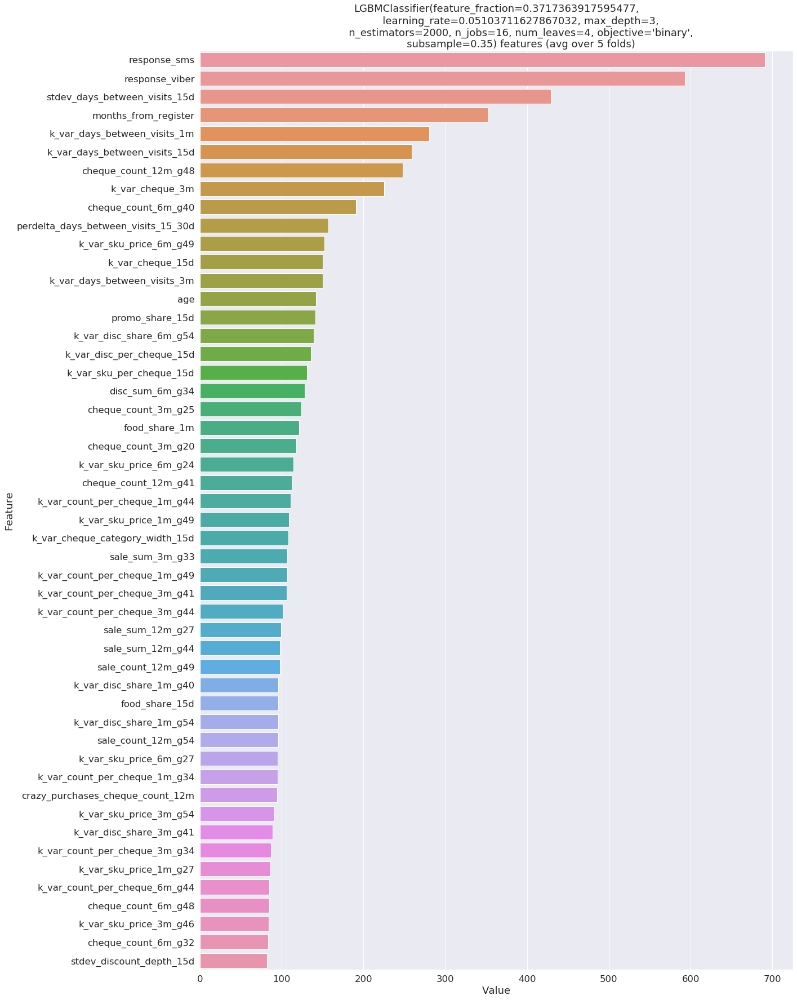

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.605243                                            
[100]	valid_0's binary_logloss: 0.601242                                           
[150]	valid_0's binary_logloss: 0.599692                                           
[200]	valid_0's binary_logloss: 0.598812                                           
[250]	valid_0's binary_logloss: 0.598035                                           
[300]	valid_0's binary_logloss: 0.597749                                           
[350]	valid_0's binary_logloss: 0.597456                                           
[400]	valid_0's binary_logloss: 0.597316                                           
[450]	valid_0's binary_logloss: 0.597254                                           
[500]	valid_0's binary_logloss: 0.597229                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.605123                                            
[100]	valid_0's binary_logloss: 0.601182                                           
[150]	valid_0's binary_logloss: 0.59964                                            
[200]	valid_0's binary_logloss: 0.59881                                            
[250]	valid_0's binary_logloss: 0.598168                                           
[300]	valid_0's binary_logloss: 0.597905                                           
[350]	valid_0's binary_logloss: 0.597641                                           
[400]	valid_0's binary_logloss: 0.597498                                           
[450]	valid_0's binary_logloss: 0.597494                                           
[500]	valid_0's binary_logloss: 0.597455                                           
[550]	valid_0's binary_logloss: 0.597448                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.605206                                            
[100]	valid_0's binary_logloss: 0.601197                                           
[150]	valid_0's binary_logloss: 0.599644                                           
[200]	valid_0's binary_logloss: 0.598836                                           
[250]	valid_0's binary_logloss: 0.598119                                           
[300]	valid_0's binary_logloss: 0.597846                                           
[350]	valid_0's binary_logloss: 0.597591                                           
[400]	valid_0's binary_logloss: 0.597443                                           
[450]	valid_0's binary_logloss: 0.597386                                           
[500]	valid_0's binary_logloss: 0.597378                                           
[550]	valid_0's binary_logloss: 0.597372                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.605069                                            
[100]	valid_0's binary_logloss: 0.600947                                           
[150]	valid_0's binary_logloss: 0.599364                                           
[200]	valid_0's binary_logloss: 0.598497                                           
[250]	valid_0's binary_logloss: 0.597851                                           
[300]	valid_0's binary_logloss: 0.597578                                           
[350]	valid_0's binary_logloss: 0.597325                                           
[400]	valid_0's binary_logloss: 0.597177                                           
[450]	valid_0's binary_logloss: 0.597149                                           
[500]	valid_0's binary_logloss: 0.597118                                           
[550]	valid_0's binary_logloss: 0.597118                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.605269                                            
[100]	valid_0's binary_logloss: 0.601298                                           
[150]	valid_0's binary_logloss: 0.599713                                           
[200]	valid_0's binary_logloss: 0.598873                                           
[250]	valid_0's binary_logloss: 0.598147                                           
[300]	valid_0's binary_logloss: 0.597816                                           
[350]	valid_0's binary_logloss: 0.597558                                           
[400]	valid_0's binary_logloss: 0.597416                                           
[450]	valid_0's binary_logloss: 0.597377                                           
[500]	valid_0's binary_logloss: 0.597326                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5972492554621154, cross uplift - 6.327397983917821,all_uplift_score - 6.32679419419844, all logloss - 0.597249255356001
 18%|█▊        | 9/50 [35:33<2:35:36, 227.72s/trial, best loss: -6.351169676575696]

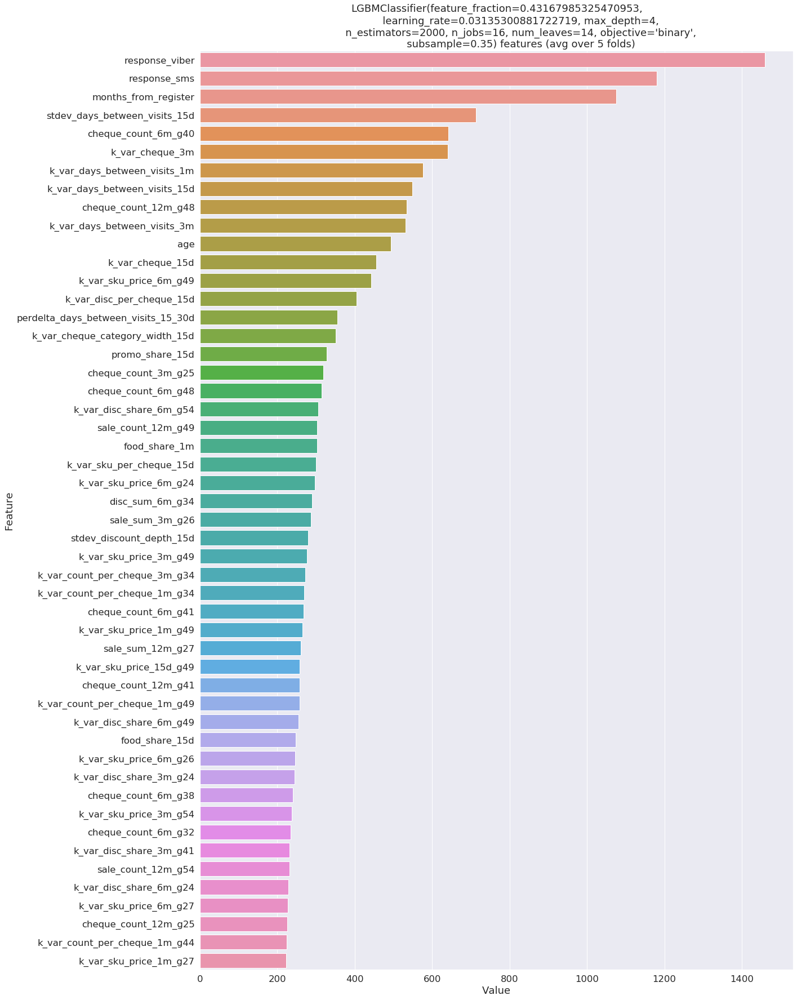

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.608567                                             
[100]	valid_0's binary_logloss: 0.605013                                            
[150]	valid_0's binary_logloss: 0.602892                                            
[200]	valid_0's binary_logloss: 0.602035                                            
[250]	valid_0's binary_logloss: 0.600793                                            
[300]	valid_0's binary_logloss: 0.600192                                            
[350]	valid_0's binary_logloss: 0.59969                                             
[400]	valid_0's binary_logloss: 0.599083                                            
[450]	valid_0's binary_logloss: 0.598661                                            
[500]	valid_0's binary_logloss: 0.598362                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



6.279732487130432                                                                   
(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.608477                                             
[100]	valid_0's binary_logloss: 0.6049                                              
[150]	valid_0's binary_logloss: 0.602812                                            
[200]	valid_0's binary_logloss: 0.601961                                            
[250]	valid_0's binary_logloss: 0.600756                                            
[300]	valid_0's binary_logloss: 0.60017                                             
[350]	valid_0's binary_logloss: 0.599701                                            
[400]	valid_0's binary_logloss: 0.599108                                            
[450]	valid_0's binary_logloss: 0.598705                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



6.35332800077289                                                                    
(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.608575                                             
[100]	valid_0's binary_logloss: 0.605025                                            
[150]	valid_0's binary_logloss: 0.602892                                            
[200]	valid_0's binary_logloss: 0.602039                                            
[250]	valid_0's binary_logloss: 0.600791                                            
[300]	valid_0's binary_logloss: 0.600209                                            
[350]	valid_0's binary_logloss: 0.59973                                             
[400]	valid_0's binary_logloss: 0.599112                                            
[450]	valid_0's binary_logloss: 0.598674                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



5.9955474022450055                                                                  
(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.608478                                             
[100]	valid_0's binary_logloss: 0.604835                                            
[150]	valid_0's binary_logloss: 0.602669                                            
[200]	valid_0's binary_logloss: 0.601806                                            
[250]	valid_0's binary_logloss: 0.600551                                            
[300]	valid_0's binary_logloss: 0.599948                                            
[350]	valid_0's binary_logloss: 0.599464                                            
[400]	valid_0's binary_logloss: 0.59886                                             
[450]	valid_0's binary_logloss: 0.598447                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



(549624,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.608574                                             
[100]	valid_0's binary_logloss: 0.605004                                            
[150]	valid_0's binary_logloss: 0.602903                                            
[200]	valid_0's binary_logloss: 0.602058                                            
[250]	valid_0's binary_logloss: 0.600845                                            
[300]	valid_0's binary_logloss: 0.600257                                            
[350]	valid_0's binary_logloss: 0.599758                                            
[400]	valid_0's binary_logloss: 0.599191                                            
[450]	valid_0's binary_logloss: 0.598734                                            
[500]	valid_0's binary_logloss: 0.598434                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5972831641510632, cross uplift - 6.31188946094347,all_uplift_score - 6.305552866555275, all logloss - 0.5972831640653918
 20%|██        | 10/50 [45:20<2:55:02, 262.57s/trial, best loss: -6.351169676575696]

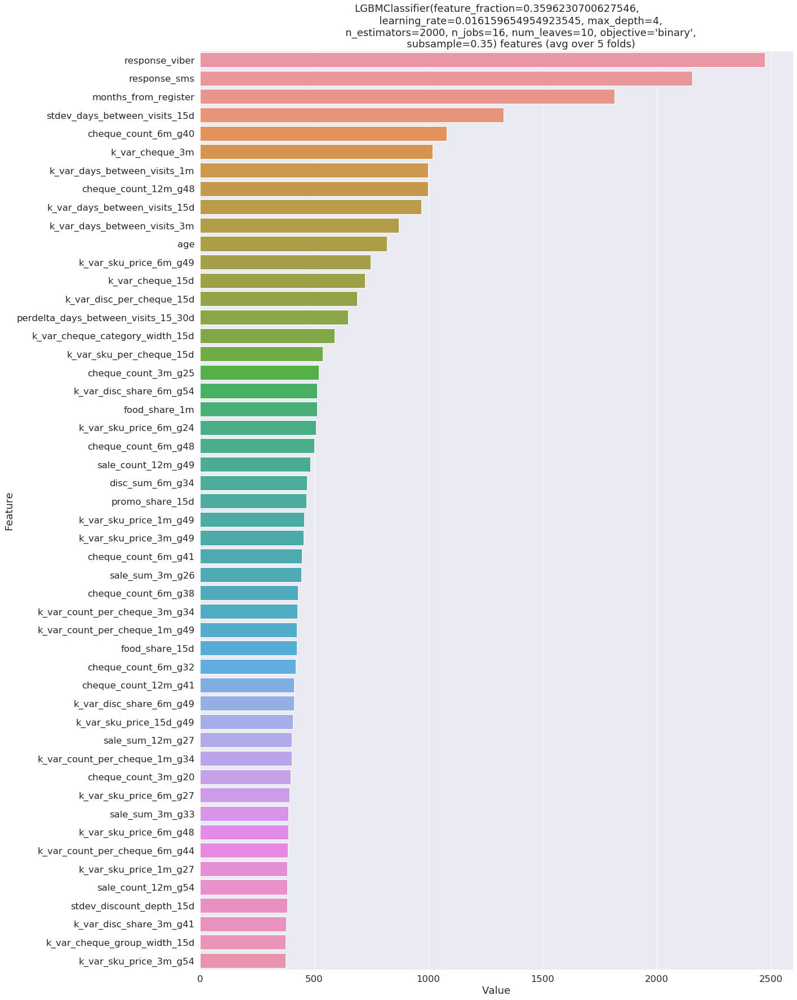

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.609832                                             
[100]	valid_0's binary_logloss: 0.606472                                            
[150]	valid_0's binary_logloss: 0.604354                                            
[200]	valid_0's binary_logloss: 0.603232                                            
[250]	valid_0's binary_logloss: 0.601983                                            
[300]	valid_0's binary_logloss: 0.601333                                            
[350]	valid_0's binary_logloss: 0.600767                                            
[400]	valid_0's binary_logloss: 0.600128                                            
[450]	valid_0's binary_logloss: 0.599624                                            
[500]	valid_0's binary_logloss: 0.599202                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.60975                                              
[100]	valid_0's binary_logloss: 0.606385                                            
[150]	valid_0's binary_logloss: 0.604293                                            
[200]	valid_0's binary_logloss: 0.603156                                            
[250]	valid_0's binary_logloss: 0.601939                                            
[300]	valid_0's binary_logloss: 0.601295                                            
[350]	valid_0's binary_logloss: 0.600724                                            
[400]	valid_0's binary_logloss: 0.600112                                            
[450]	valid_0's binary_logloss: 0.599638                                            
[500]	valid_0's binary_logloss: 0.599234                                            
[550]	valid_0's binary_logloss: 0.599029                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.609817                                             
[100]	valid_0's binary_logloss: 0.606463                                            
[150]	valid_0's binary_logloss: 0.604336                                            
[200]	valid_0's binary_logloss: 0.603204                                            
[250]	valid_0's binary_logloss: 0.601976                                            
[300]	valid_0's binary_logloss: 0.601337                                            
[350]	valid_0's binary_logloss: 0.600761                                            
[400]	valid_0's binary_logloss: 0.600139                                            
[450]	valid_0's binary_logloss: 0.599625                                            
[500]	valid_0's binary_logloss: 0.59921                                             
[550]	valid_0's binary_logloss: 0.598984                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.609727                                             
[100]	valid_0's binary_logloss: 0.606264                                            
[150]	valid_0's binary_logloss: 0.604115                                            
[200]	valid_0's binary_logloss: 0.602956                                            
[250]	valid_0's binary_logloss: 0.601683                                            
[300]	valid_0's binary_logloss: 0.601057                                            
[350]	valid_0's binary_logloss: 0.600497                                            
[400]	valid_0's binary_logloss: 0.599851                                            
[450]	valid_0's binary_logloss: 0.599354                                            
[500]	valid_0's binary_logloss: 0.598914                                            
[550]	valid_0's binary_logloss: 0.598697                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.609815                                             
[100]	valid_0's binary_logloss: 0.606426                                            
[150]	valid_0's binary_logloss: 0.604325                                            
[200]	valid_0's binary_logloss: 0.60323                                             
[250]	valid_0's binary_logloss: 0.602001                                            
[300]	valid_0's binary_logloss: 0.601375                                            
[350]	valid_0's binary_logloss: 0.600824                                            
[400]	valid_0's binary_logloss: 0.600198                                            
[450]	valid_0's binary_logloss: 0.599687                                            
[500]	valid_0's binary_logloss: 0.599266                                            
[550]	valid_0's binary_logloss: 0.599043                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



6.7493159563912                                                                     
cross logloss - 0.5975723229119043, cross uplift - 6.269710066412107,all_uplift_score - 6.260431194315891, all logloss - 0.5975723228540144
 22%|██▏       | 11/50 [53:33<3:54:00, 360.02s/trial, best loss: -6.351169676575696]

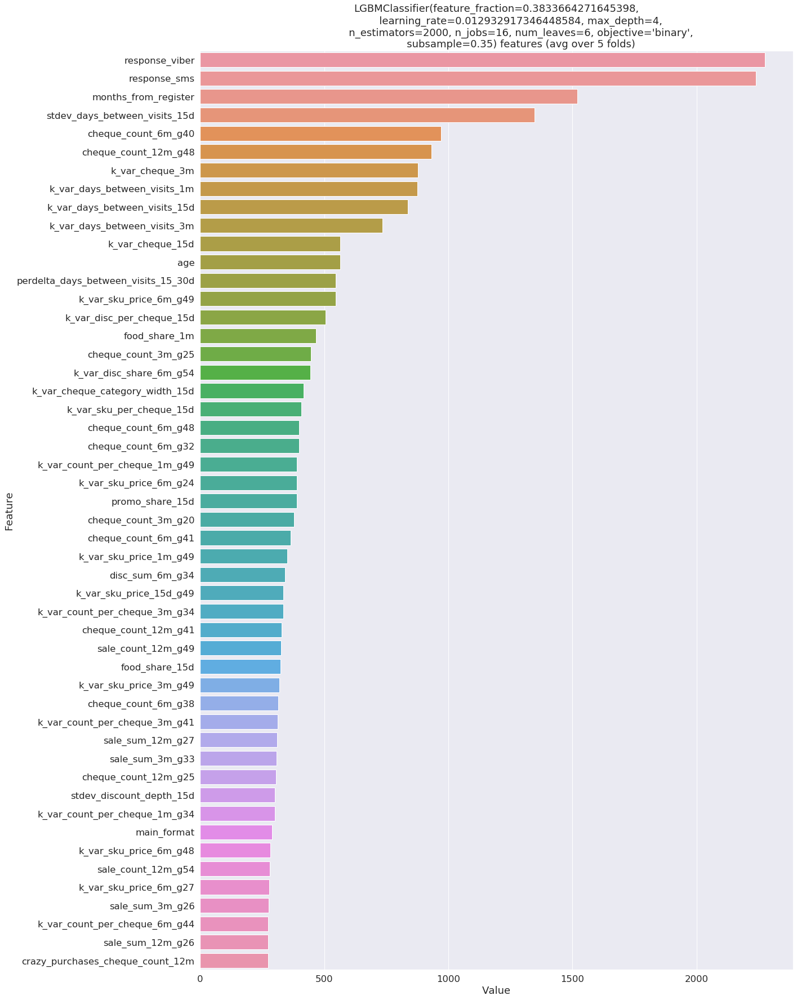

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.602052                                             
[100]	valid_0's binary_logloss: 0.599123                                            
[150]	valid_0's binary_logloss: 0.598122                                            
[200]	valid_0's binary_logloss: 0.597778                                            
[250]	valid_0's binary_logloss: 0.597672                                            
[300]	valid_0's binary_logloss: 0.597564                                            
Early stopping, best iteration is:                                                  
[295]	valid_0's binary_logloss: 0.59756
6.20729741844687                                                                    
(549623,)                                                                           
 24%|██▍       | 12/50 [5

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.601851                                             
[100]	valid_0's binary_logloss: 0.599043                                            
[150]	valid_0's binary_logloss: 0.598127                                            
[200]	valid_0's binary_logloss: 0.597837                                            
[250]	valid_0's binary_logloss: 0.597695                                            
[300]	valid_0's binary_logloss: 0.597662                                            
[350]	valid_0's binary_logloss: 0.597631                                            
[400]	valid_0's binary_logloss: 0.597591                                            
[450]	valid_0's binary_logloss: 0.597601                                            
Early stopping, best iteration is:                                                  
[410]	valid_0's binary_logloss: 0.597588
6.348240823944151       

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.602094                                             
[100]	valid_0's binary_logloss: 0.599156                                            
[150]	valid_0's binary_logloss: 0.59823                                             
[200]	valid_0's binary_logloss: 0.597872                                            
[250]	valid_0's binary_logloss: 0.597825                                            
Early stopping, best iteration is:                                                  
[240]	valid_0's binary_logloss: 0.597819
6.026447987042538                                                                   
(549623,)                                                                           
 24%|██▍       | 12/50 [54:52<4:13:02, 399.53s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.601825                                             
[100]	valid_0's binary_logloss: 0.598806                                            
[150]	valid_0's binary_logloss: 0.597834                                            
[200]	valid_0's binary_logloss: 0.597501                                            
[250]	valid_0's binary_logloss: 0.597479                                            
[300]	valid_0's binary_logloss: 0.597385                                            
[350]	valid_0's binary_logloss: 0.597393                                            
Early stopping, best iteration is:                                                  
[326]	valid_0's binary_logloss: 0.597381
6.1397805075860905                                                                  
(549624,)                                                                           
 24%|██▍       | 12/50 [

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.60213                                              
[100]	valid_0's binary_logloss: 0.599141                                            
[150]	valid_0's binary_logloss: 0.598183                                            
[200]	valid_0's binary_logloss: 0.597884                                            
[250]	valid_0's binary_logloss: 0.597596                                            
[300]	valid_0's binary_logloss: 0.597579                                            
[350]	valid_0's binary_logloss: 0.597473                                            
[400]	valid_0's binary_logloss: 0.597442                                            
[450]	valid_0's binary_logloss: 0.59746                                             
Early stopping, best iteration is:                                                  
[410]	valid_0's binary_logloss: 0.59743
6.7573528036896615       

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5975554062524113, cross uplift - 6.2958239081418625,all_uplift_score - 6.310576609464189, all logloss - 0.5975554064356607
 24%|██▍       | 12/50 [55:49<4:13:02, 399.53s/trial, best loss: -6.351169676575696]

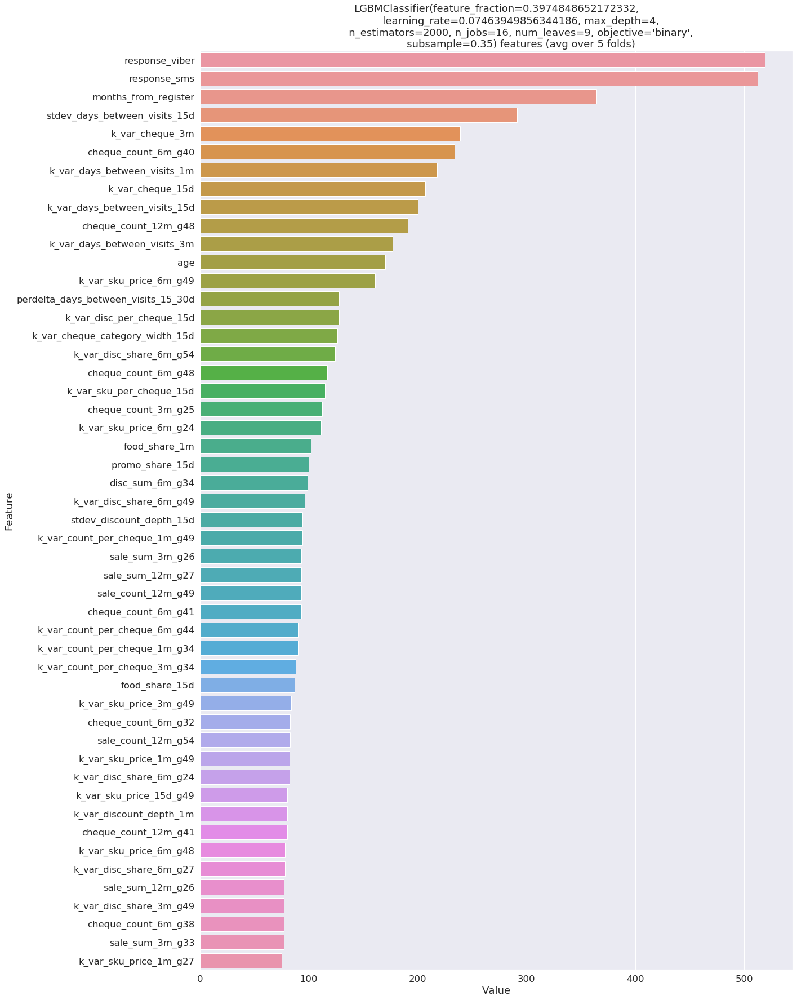

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.605603                                             
[100]	valid_0's binary_logloss: 0.601468                                            
[150]	valid_0's binary_logloss: 0.599898                                            
[200]	valid_0's binary_logloss: 0.59903                                             
[250]	valid_0's binary_logloss: 0.598146                                            
[300]	valid_0's binary_logloss: 0.597844                                            
[350]	valid_0's binary_logloss: 0.59756                                             
[400]	valid_0's binary_logloss: 0.597269                                            
[450]	valid_0's binary_logloss: 0.597219                                            
[500]	valid_0's binary_logloss: 0.597168                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



6.26832617189752                                                                    
(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.605489                                             
[100]	valid_0's binary_logloss: 0.601382                                            
[150]	valid_0's binary_logloss: 0.599851                                            
[200]	valid_0's binary_logloss: 0.599012                                            
[250]	valid_0's binary_logloss: 0.598305                                            
[300]	valid_0's binary_logloss: 0.598005                                            
[350]	valid_0's binary_logloss: 0.597734                                            
[400]	valid_0's binary_logloss: 0.597507                                            
[450]	valid_0's binary_logloss: 0.597449                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.605583                                             
[100]	valid_0's binary_logloss: 0.601435                                            
[150]	valid_0's binary_logloss: 0.599872                                              
[200]	valid_0's binary_logloss: 0.599033                                              
[250]	valid_0's binary_logloss: 0.598276                                              
[300]	valid_0's binary_logloss: 0.597981                                              
[350]	valid_0's binary_logloss: 0.597694                                              
[400]	valid_0's binary_logloss: 0.597427                                              
[450]	valid_0's binary_logloss: 0.597387                                              
[500]	valid_0's binary_logloss: 0.597361                                              
[550]	valid_0's binary_logloss: 0.597336         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.605442                                               
[100]	valid_0's binary_logloss: 0.601139                                              
[150]	valid_0's binary_logloss: 0.599579                                              
[200]	valid_0's binary_logloss: 0.598758                                              
[250]	valid_0's binary_logloss: 0.598027                                              
[300]	valid_0's binary_logloss: 0.597748                                              
[350]	valid_0's binary_logloss: 0.597458                                              
[400]	valid_0's binary_logloss: 0.597209                                              
[450]	valid_0's binary_logloss: 0.597153                                              
[500]	valid_0's binary_logloss: 0.597095                                              
[550]	valid_0's binary_logloss: 0.597058   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.60563                                                
[100]	valid_0's binary_logloss: 0.601484                                              
[150]	valid_0's binary_logloss: 0.599906                                              
[200]	valid_0's binary_logloss: 0.599051                                              
[250]	valid_0's binary_logloss: 0.598299                                              
[300]	valid_0's binary_logloss: 0.597949                                              
[350]	valid_0's binary_logloss: 0.597674                                              
[400]	valid_0's binary_logloss: 0.597405                                              
[450]	valid_0's binary_logloss: 0.597323                                              
[500]	valid_0's binary_logloss: 0.597303                                              
[550]	valid_0's binary_logloss: 0.597269   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5971418998368363, cross uplift - 6.3488673928924,all_uplift_score - 6.337073654583425, all logloss - 0.5971418997898965
 26%|██▌       | 13/50 [1:05:57<3:17:51, 320.86s/trial, best loss: -6.351169676575696]

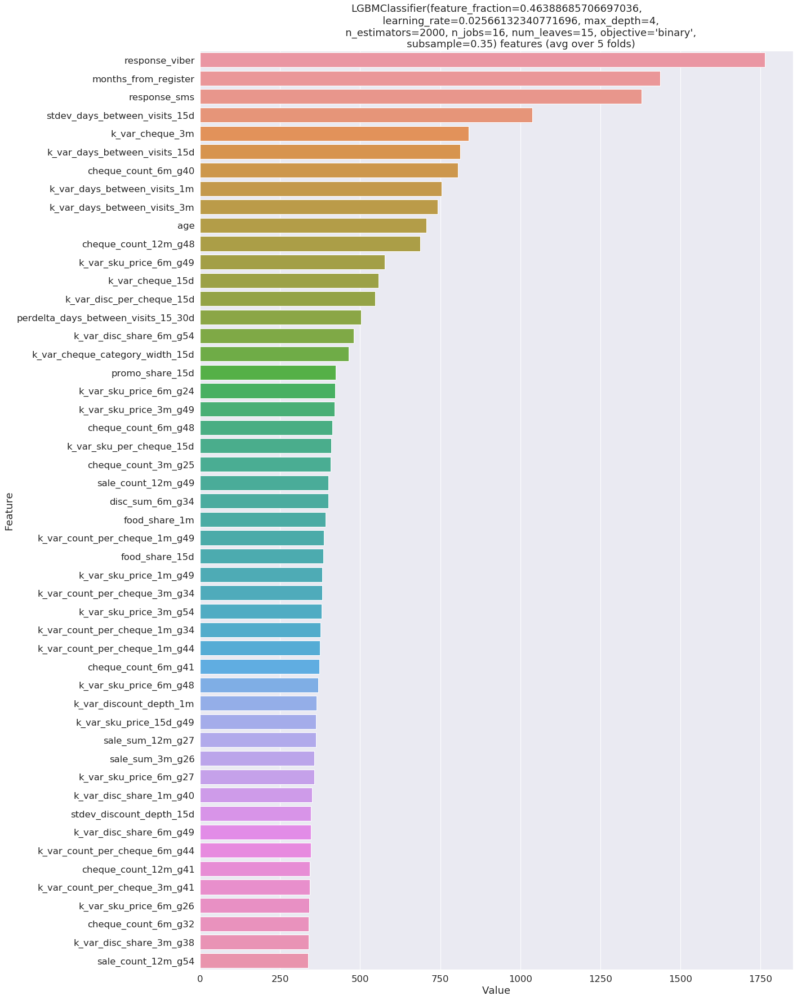

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601732                                               
[100]	valid_0's binary_logloss: 0.598859                                              
[150]	valid_0's binary_logloss: 0.597878                                              
[200]	valid_0's binary_logloss: 0.597523                                              
[250]	valid_0's binary_logloss: 0.597432                                              
[300]	valid_0's binary_logloss: 0.597388                                              
[350]	valid_0's binary_logloss: 0.597404                                              
Early stopping, best iteration is:                                                    
[321]	valid_0's binary_logloss: 0.597385
6.117536604410537                                                                     
(5

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.60165                                                
[100]	valid_0's binary_logloss: 0.598847                                              
[150]	valid_0's binary_logloss: 0.597978                                              
[200]	valid_0's binary_logloss: 0.597706                                              
[250]	valid_0's binary_logloss: 0.597683                                              
Early stopping, best iteration is:                                                    
[213]	valid_0's binary_logloss: 0.597649
6.189024549014705                                                                     
(549623,)                                                                             
 28%|██▊       | 14/50 [1:07:23<4:04:08, 406.91s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601848                                               
[100]	valid_0's binary_logloss: 0.598969                                              
[150]	valid_0's binary_logloss: 0.598021                                              
[200]	valid_0's binary_logloss: 0.597746                                              
[250]	valid_0's binary_logloss: 0.597701                                              
Early stopping, best iteration is:                                                    
[243]	valid_0's binary_logloss: 0.597679
6.025047615717344                                                                     
(549623,)                                                                             
 28%|██▊       | 14/50 [1:07:58<4:04:08, 406.91s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601548                                               
[100]	valid_0's binary_logloss: 0.598651                                              
[150]	valid_0's binary_logloss: 0.597721                                              
[200]	valid_0's binary_logloss: 0.597399                                              
[250]	valid_0's binary_logloss: 0.597323                                              
[300]	valid_0's binary_logloss: 0.5973                                                
Early stopping, best iteration is:                                                    
[270]	valid_0's binary_logloss: 0.597295
6.162287958100785                                                                     
(549624,)                                                                             
 28%|██▊       | 14/50 [1:08:36<4:04:08, 406.91s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601894                                               
[100]	valid_0's binary_logloss: 0.598946                                              
[150]	valid_0's binary_logloss: 0.598025                                              
[200]	valid_0's binary_logloss: 0.597646                                              
[250]	valid_0's binary_logloss: 0.59767                                               
Early stopping, best iteration is:                                                    
[217]	valid_0's binary_logloss: 0.597622
6.969081837533969                                                                     
 28%|██▊       | 14/50 [1:09:10<4:04:08, 406.91s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5975260208354982, cross uplift - 6.292595712955468,all_uplift_score - 6.293029156621433, all logloss - 0.5975260206954787
 28%|██▊       | 14/50 [1:09:11<4:04:08, 406.91s/trial, best loss: -6.351169676575696]

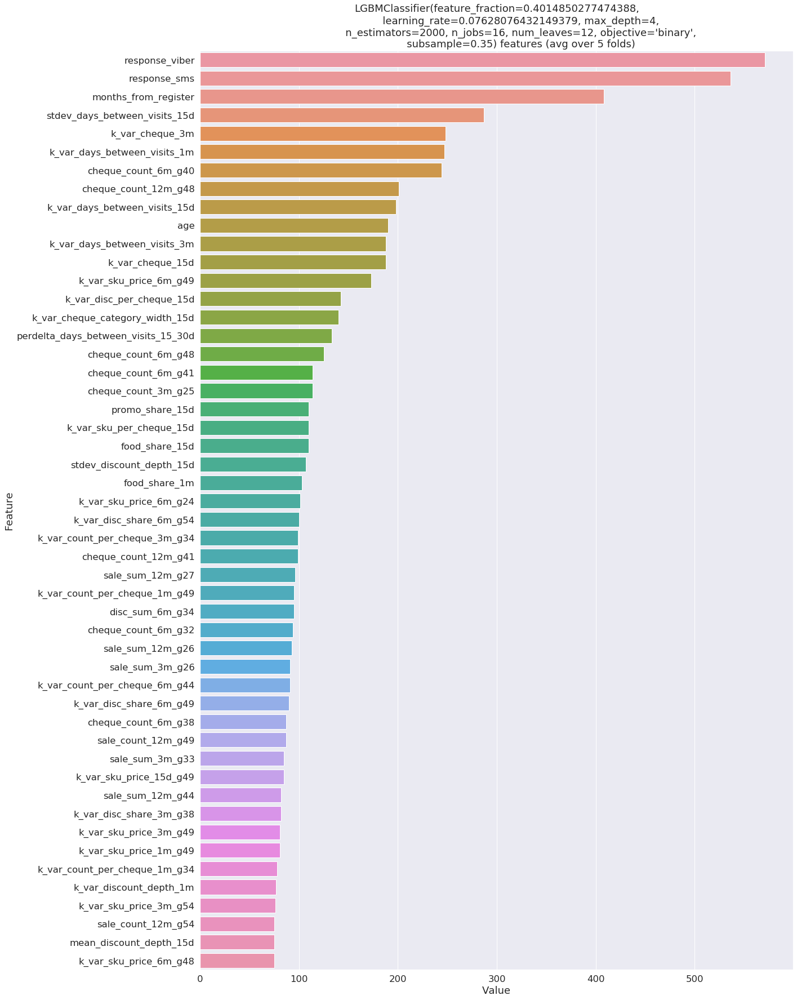

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601278                                               
[100]	valid_0's binary_logloss: 0.59875                                               
[150]	valid_0's binary_logloss: 0.598165                                              
[200]	valid_0's binary_logloss: 0.598008                                              
[250]	valid_0's binary_logloss: 0.598018                                              
[300]	valid_0's binary_logloss: 0.598023                                              
Early stopping, best iteration is:                                                    
[254]	valid_0's binary_logloss: 0.597998
6.221103992032684                                                                     
(549623,)                                                                             
 3

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601189                                               
[100]	valid_0's binary_logloss: 0.598704                                              
[150]	valid_0's binary_logloss: 0.598259                                              
[200]	valid_0's binary_logloss: 0.598176                                              
[250]	valid_0's binary_logloss: 0.598135                                              
[300]	valid_0's binary_logloss: 0.598124                                              
Early stopping, best iteration is:                                                    
[296]	valid_0's binary_logloss: 0.598115
6.332049965121284                                                                     
(549623,)                                                                             
 30%|███       | 15/50 [1:10:21<3:20:02, 342.92s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.60123                                                
[100]	valid_0's binary_logloss: 0.598626                                              
[150]	valid_0's binary_logloss: 0.59824                                               
[200]	valid_0's binary_logloss: 0.598106                                              
[250]	valid_0's binary_logloss: 0.598094                                              
[300]	valid_0's binary_logloss: 0.598063                                              
Early stopping, best iteration is:                                                    
[288]	valid_0's binary_logloss: 0.598041
5.92279338729593                                                                      
(549623,)                                                                             
 30%|███       | 15/50 [1:10:55<3:20:02, 342.92s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.60116                                                
[100]	valid_0's binary_logloss: 0.598476                                              
[150]	valid_0's binary_logloss: 0.598                                                 
[200]	valid_0's binary_logloss: 0.597842                                              
[250]	valid_0's binary_logloss: 0.597767                                              
[300]	valid_0's binary_logloss: 0.597756                                              
Early stopping, best iteration is:                                                    
[258]	valid_0's binary_logloss: 0.597749
6.279785657645986                                                                     
(549624,)                                                                             
 30%|███       | 15/50 [1:11:21<3:20:02, 342.92s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601252                                               
[100]	valid_0's binary_logloss: 0.598671                                              
[150]	valid_0's binary_logloss: 0.598211                                              
[200]	valid_0's binary_logloss: 0.598102                                              
Early stopping, best iteration is:                                                    
[183]	valid_0's binary_logloss: 0.598082
7.035357076636192                                                                     
 30%|███       | 15/50 [1:11:43<3:20:02, 342.92s/trial, best loss: -6.351169676575696]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5979969883959637, cross uplift - 6.358218015746415,all_uplift_score - 6.344594904383364, all logloss - 0.5979969882723469
 30%|███       | 15/50 [1:11:43<3:20:02, 342.92s/trial, best loss: -6.351169676575696]

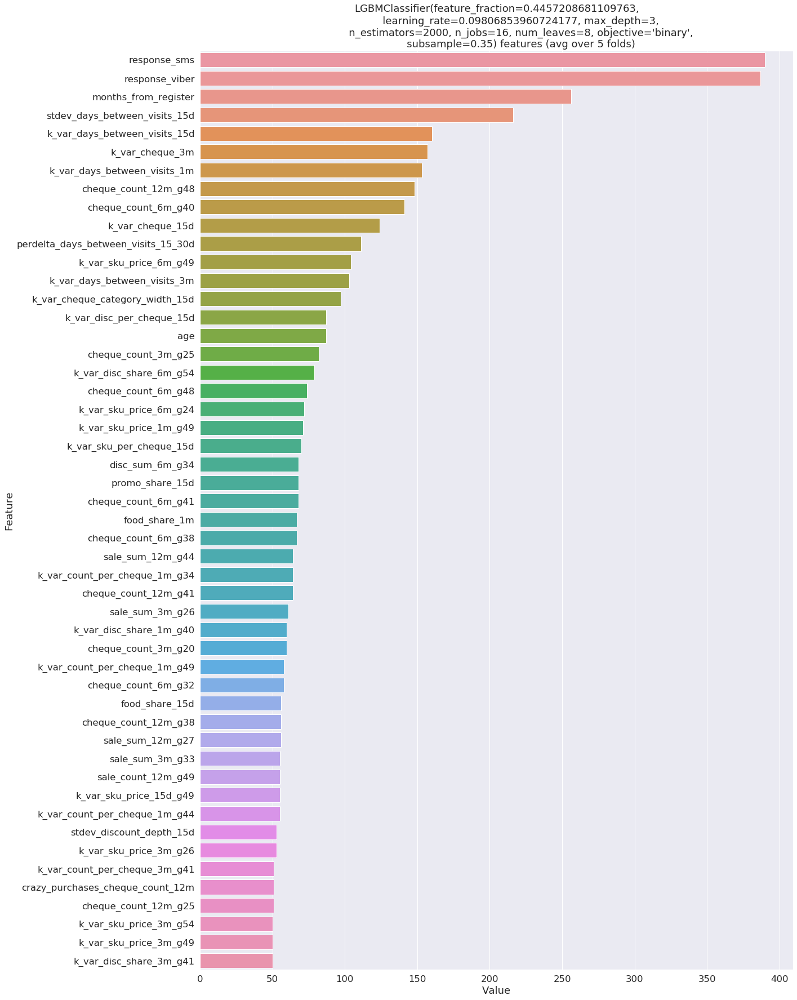

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600876                                               
[100]	valid_0's binary_logloss: 0.598623                                              
[150]	valid_0's binary_logloss: 0.59822                                               
[200]	valid_0's binary_logloss: 0.598089                                              
[250]	valid_0's binary_logloss: 0.598024                                              
[300]	valid_0's binary_logloss: 0.598005                                              
Early stopping, best iteration is:                                                    
[283]	valid_0's binary_logloss: 0.597978
6.2257082121262295                                                                    
(549623,)                                                                             
 3

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.60066                                                
[100]	valid_0's binary_logloss: 0.598499                                              
[150]	valid_0's binary_logloss: 0.598256                                              
[200]	valid_0's binary_logloss: 0.598181                                              
[250]	valid_0's binary_logloss: 0.598128                                              
[300]	valid_0's binary_logloss: 0.598116                                              
[350]	valid_0's binary_logloss: 0.598142                                              
Early stopping, best iteration is:                                                    
[314]	valid_0's binary_logloss: 0.598115
6.379738062841678                                                                     
(549623,)                                                                             
 3

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600679                                               
[100]	valid_0's binary_logloss: 0.598521                                              
[150]	valid_0's binary_logloss: 0.598178                                              
[200]	valid_0's binary_logloss: 0.598152                                              
[250]	valid_0's binary_logloss: 0.598135                                              
[300]	valid_0's binary_logloss: 0.598149                                              
Early stopping, best iteration is:                                                    
[274]	valid_0's binary_logloss: 0.598127
6.055019156622696                                                                     
(549623,)                                                                             
 32%|███▏      | 16/50 [1:13:10<2:41:52, 285.66s/trial, best loss: -6.358218015746415]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.60052                                                
[100]	valid_0's binary_logloss: 0.598271                                              
[150]	valid_0's binary_logloss: 0.597957                                              
[200]	valid_0's binary_logloss: 0.597868                                              
[250]	valid_0's binary_logloss: 0.597792                                              
[300]	valid_0's binary_logloss: 0.597752                                              
Early stopping, best iteration is:                                                    
[275]	valid_0's binary_logloss: 0.597736
6.219880579979581                                                                     
(549624,)                                                                             
 32%|███▏      | 16/50 [1:13:34<2:41:52, 285.66s/trial, best loss: -6.358218015746415]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600826                                               
[100]	valid_0's binary_logloss: 0.598623                                              
[150]	valid_0's binary_logloss: 0.598385                                              
[200]	valid_0's binary_logloss: 0.598339                                              
[250]	valid_0's binary_logloss: 0.598216                                              
[300]	valid_0's binary_logloss: 0.598246                                              
Early stopping, best iteration is:                                                    
[266]	valid_0's binary_logloss: 0.598199
6.9370656783339975                                                                    
 32%|███▏      | 16/50 [1:13:59<2:41:52, 285.66s/trial, best loss: -6.358218015746415]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980311968302061, cross uplift - 6.363482337980836,all_uplift_score - 6.371855258253889, all logloss - 0.5980311965864638
 32%|███▏      | 16/50 [1:14:00<2:41:52, 285.66s/trial, best loss: -6.358218015746415]

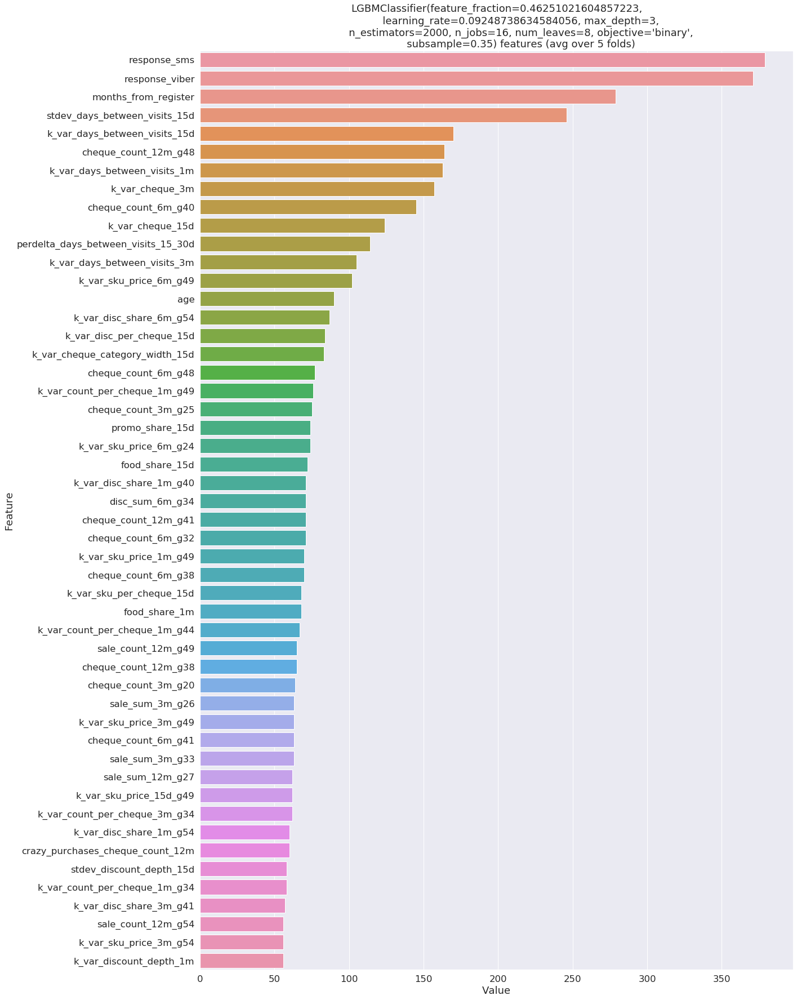

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600681                                               
[100]	valid_0's binary_logloss: 0.59857                                               
[150]	valid_0's binary_logloss: 0.598299                                              
[200]	valid_0's binary_logloss: 0.598187                                              
[250]	valid_0's binary_logloss: 0.598021                                              
[300]	valid_0's binary_logloss: 0.598032                                              
Early stopping, best iteration is:                                                    
[267]	valid_0's binary_logloss: 0.597996
6.287861231020137                                                                     
(549623,)                                                                             
 3

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600548                                               
[100]	valid_0's binary_logloss: 0.598497                                              
[150]	valid_0's binary_logloss: 0.598359                                              
[200]	valid_0's binary_logloss: 0.598264                                              
[250]	valid_0's binary_logloss: 0.598189                                              
Early stopping, best iteration is:                                                    
[234]	valid_0's binary_logloss: 0.598174
6.23629865757751                                                                      
(549623,)                                                                             
 34%|███▍      | 17/50 [1:14:52<2:12:29, 240.90s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600415                                               
[100]	valid_0's binary_logloss: 0.598388                                              
[150]	valid_0's binary_logloss: 0.598231                                              
[200]	valid_0's binary_logloss: 0.598186                                              
[250]	valid_0's binary_logloss: 0.59817                                               
Early stopping, best iteration is:                                                    
[219]	valid_0's binary_logloss: 0.598141
6.063870664724483                                                                     
(549623,)                                                                             
 34%|███▍      | 17/50 [1:15:12<2:12:29, 240.90s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600428                                               
[100]	valid_0's binary_logloss: 0.598258                                              
[150]	valid_0's binary_logloss: 0.598015                                              
[200]	valid_0's binary_logloss: 0.597873                                              
[250]	valid_0's binary_logloss: 0.597861                                              
[300]	valid_0's binary_logloss: 0.597785                                              
[350]	valid_0's binary_logloss: 0.597799                                              
Early stopping, best iteration is:                                                    
[323]	valid_0's binary_logloss: 0.59778
6.247608168146401                                                                     
(549624,)                                                                             
 34

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600678                                               
[100]	valid_0's binary_logloss: 0.598548                                              
[150]	valid_0's binary_logloss: 0.598279                                              
[200]	valid_0's binary_logloss: 0.598246                                              
[250]	valid_0's binary_logloss: 0.598136                                              
[300]	valid_0's binary_logloss: 0.598096                                              
[350]	valid_0's binary_logloss: 0.598103                                              
Early stopping, best iteration is:                                                    
[312]	valid_0's binary_logloss: 0.598093
6.962897333283929                                                                     
 34%|███▍      | 17/50 [1:16:04<2:12:29, 240.90s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.598036510516744, cross uplift - 6.359707210950493,all_uplift_score - 6.340898855535359, all logloss - 0.5980365104351103
 34%|███▍      | 17/50 [1:16:04<2:12:29, 240.90s/trial, best loss: -6.363482337980836]

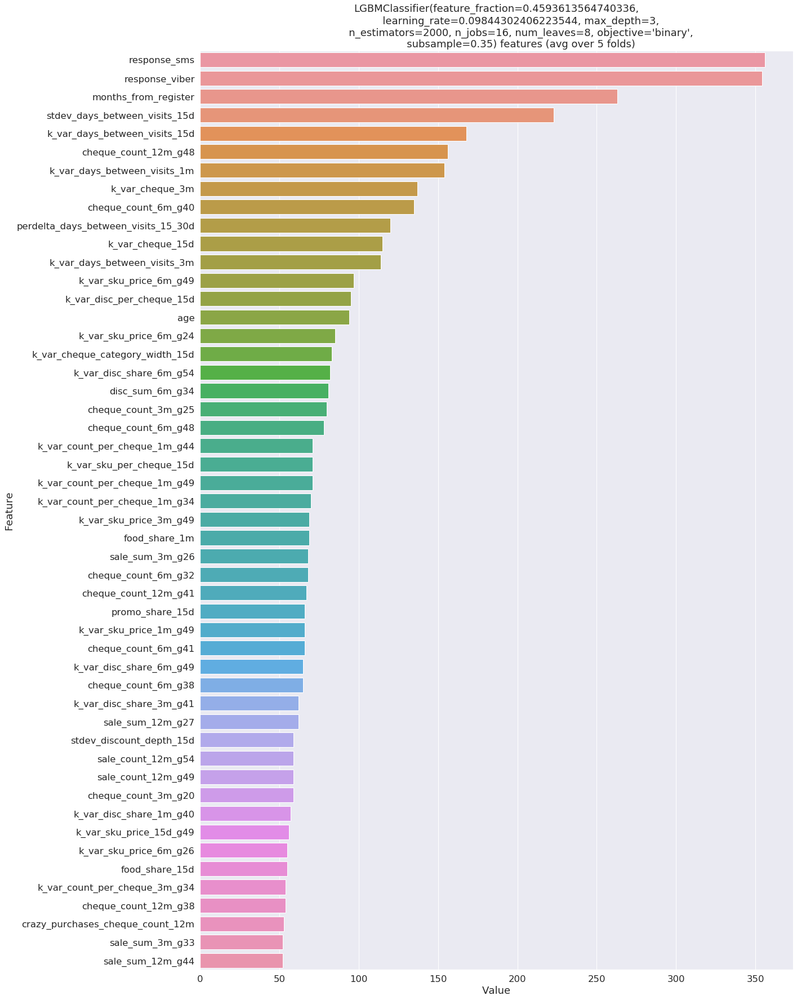

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600529                                               
[100]	valid_0's binary_logloss: 0.598485                                              
[150]	valid_0's binary_logloss: 0.598178                                              
[200]	valid_0's binary_logloss: 0.598121                                              
[250]	valid_0's binary_logloss: 0.598127                                              
[300]	valid_0's binary_logloss: 0.598108                                              
Early stopping, best iteration is:                                                    
[263]	valid_0's binary_logloss: 0.598081
6.152283807105851                                                                     
(549623,)                                                                             
 3

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600442                                               
[100]	valid_0's binary_logloss: 0.598496                                              
[150]	valid_0's binary_logloss: 0.598325                                              
[200]	valid_0's binary_logloss: 0.598216                                              
[250]	valid_0's binary_logloss: 0.598205                                              
[300]	valid_0's binary_logloss: 0.598189                                              
Early stopping, best iteration is:                                                    
[283]	valid_0's binary_logloss: 0.598175
6.322641385231842                                                                     
(549623,)                                                                             
 36%|███▌      | 18/50 [1:17:00<1:49:49, 205.93s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600436                                               
[100]	valid_0's binary_logloss: 0.598382                                              
[150]	valid_0's binary_logloss: 0.598164                                              
[200]	valid_0's binary_logloss: 0.598144                                              
[250]	valid_0's binary_logloss: 0.598115                                              
Early stopping, best iteration is:                                                    
[240]	valid_0's binary_logloss: 0.598109
6.195634913123974                                                                     
(549623,)                                                                             
 36%|███▌      | 18/50 [1:17:21<1:49:49, 205.93s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600432                                               
[100]	valid_0's binary_logloss: 0.598265                                              
[150]	valid_0's binary_logloss: 0.597971                                              
[200]	valid_0's binary_logloss: 0.597919                                              
[250]	valid_0's binary_logloss: 0.597829                                              
[300]	valid_0's binary_logloss: 0.597811                                              
[350]	valid_0's binary_logloss: 0.597822                                              
Early stopping, best iteration is:                                                    
[318]	valid_0's binary_logloss: 0.597794
6.155188795235478                                                                     
(549624,)                                                                             
 3

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600622                                               
[100]	valid_0's binary_logloss: 0.598494                                              
[150]	valid_0's binary_logloss: 0.59828                                               
[200]	valid_0's binary_logloss: 0.598181                                              
[250]	valid_0's binary_logloss: 0.598168                                              
[300]	valid_0's binary_logloss: 0.598147                                              
Early stopping, best iteration is:                                                    
[271]	valid_0's binary_logloss: 0.598127
6.865103548000803                                                                     
 36%|███▌      | 18/50 [1:18:11<1:49:49, 205.93s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980572038194059, cross uplift - 6.33817048973959,all_uplift_score - 6.318960575724889, all logloss - 0.5980572037178354
 36%|███▌      | 18/50 [1:18:12<1:49:49, 205.93s/trial, best loss: -6.363482337980836]

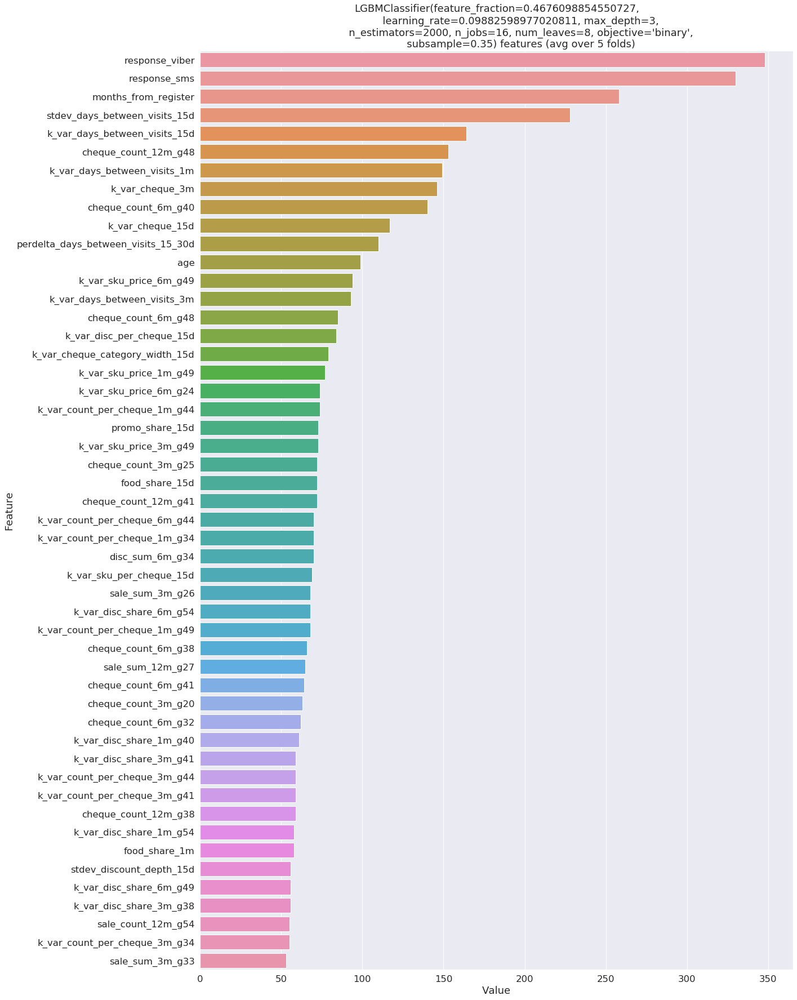

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600845                                               
[100]	valid_0's binary_logloss: 0.598562                                              
[150]	valid_0's binary_logloss: 0.598157                                              
[200]	valid_0's binary_logloss: 0.598004                                              
[250]	valid_0's binary_logloss: 0.597942                                              
[300]	valid_0's binary_logloss: 0.597946                                              
Early stopping, best iteration is:                                                    
[264]	valid_0's binary_logloss: 0.597923
6.185851367344863                                                                     
(549623,)                                                                             
 3

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600748                                               
[100]	valid_0's binary_logloss: 0.598589                                              
[150]	valid_0's binary_logloss: 0.598294                                              
[200]	valid_0's binary_logloss: 0.598187                                              
[250]	valid_0's binary_logloss: 0.598168                                              
[300]	valid_0's binary_logloss: 0.598154                                              
Early stopping, best iteration is:                                                    
[297]	valid_0's binary_logloss: 0.598148
6.468805555844348                                                                     
(549623,)                                                                             
 38%|███▊      | 19/50 [1:19:13<1:34:19, 182.56s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600607                                               
[100]	valid_0's binary_logloss: 0.598424                                              
[150]	valid_0's binary_logloss: 0.598164                                              
[200]	valid_0's binary_logloss: 0.598031                                              
[250]	valid_0's binary_logloss: 0.597967                                              
[300]	valid_0's binary_logloss: 0.597974                                              
Early stopping, best iteration is:                                                    
[265]	valid_0's binary_logloss: 0.59796
6.078095135382239                                                                     
(549623,)                                                                             
 38%|███▊      | 19/50 [1:19:36<1:34:19, 182.56s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600527                                               
[100]	valid_0's binary_logloss: 0.598293                                              
[150]	valid_0's binary_logloss: 0.597992                                              
[200]	valid_0's binary_logloss: 0.597865                                              
[250]	valid_0's binary_logloss: 0.597788                                              
[300]	valid_0's binary_logloss: 0.59772                                               
[350]	valid_0's binary_logloss: 0.597736                                              
Early stopping, best iteration is:                                                    
[310]	valid_0's binary_logloss: 0.597706
6.183554319246943                                                                     
(549624,)                                                                             
 3

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600819                                               
[100]	valid_0's binary_logloss: 0.598638                                              
[150]	valid_0's binary_logloss: 0.598279                                              
[200]	valid_0's binary_logloss: 0.598247                                              
[250]	valid_0's binary_logloss: 0.598106                                              
[300]	valid_0's binary_logloss: 0.598088                                              
Early stopping, best iteration is:                                                    
[287]	valid_0's binary_logloss: 0.598081
6.82957875309784                                                                      
 38%|███▊      | 19/50 [1:20:28<1:34:19, 182.56s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5979634344487572, cross uplift - 6.349177026183247,all_uplift_score - 6.335830488896874, all logloss - 0.5979634342779571
 38%|███▊      | 19/50 [1:20:28<1:34:19, 182.56s/trial, best loss: -6.363482337980836]

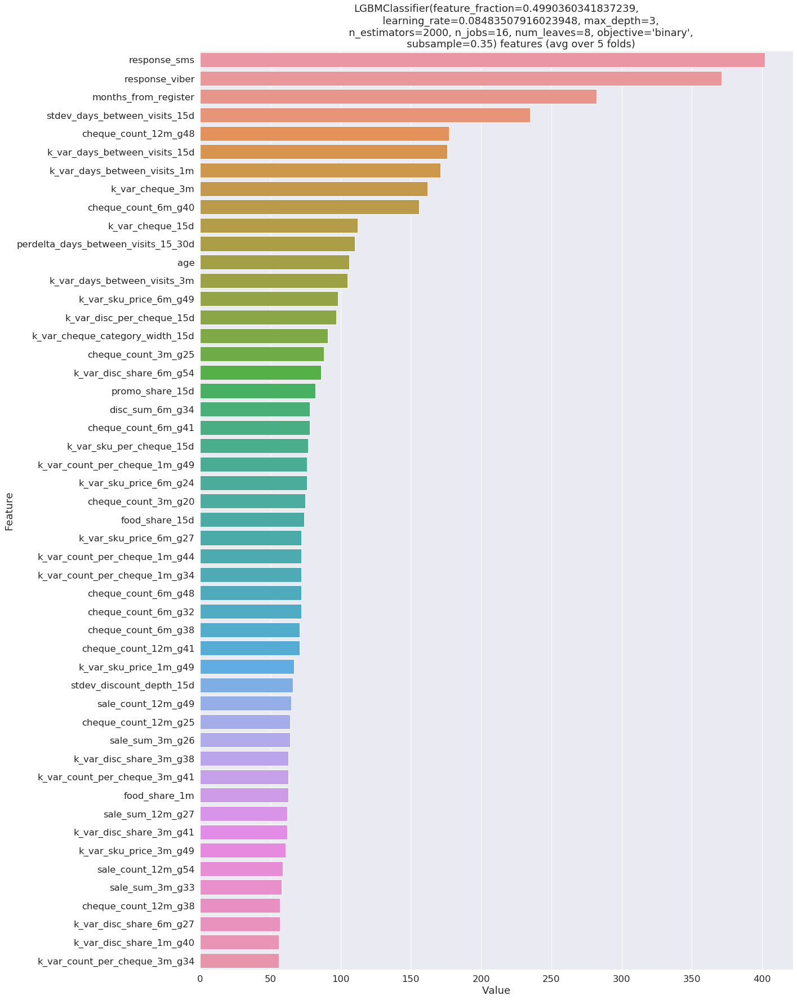

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600657                                               
[100]	valid_0's binary_logloss: 0.598452                                              
[150]	valid_0's binary_logloss: 0.598143                                              
[200]	valid_0's binary_logloss: 0.598079                                              
[250]	valid_0's binary_logloss: 0.598059                                              
[300]	valid_0's binary_logloss: 0.598066                                              
Early stopping, best iteration is:                                                    
[256]	valid_0's binary_logloss: 0.598041
6.136249777703753                                                                     
(549623,)                                                                             
 4

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600545                                               
[100]	valid_0's binary_logloss: 0.598527                                              
[150]	valid_0's binary_logloss: 0.598385                                              
[200]	valid_0's binary_logloss: 0.598269                                              
Early stopping, best iteration is:                                                    
[193]	valid_0's binary_logloss: 0.598262
6.066780434716396                                                                     
(549623,)                                                                             
 40%|████      | 20/50 [1:21:22<1:25:11, 170.40s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600557                                               
[100]	valid_0's binary_logloss: 0.598446                                              
[150]	valid_0's binary_logloss: 0.59822                                               
[200]	valid_0's binary_logloss: 0.598141                                              
[250]	valid_0's binary_logloss: 0.598105                                              
[300]	valid_0's binary_logloss: 0.598115                                              
Early stopping, best iteration is:                                                    
[262]	valid_0's binary_logloss: 0.598094
5.982216016905298                                                                     
(549623,)                                                                             
 40%|████      | 20/50 [1:21:43<1:25:11, 170.40s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600532                                               
[100]	valid_0's binary_logloss: 0.598298                                              
[150]	valid_0's binary_logloss: 0.598017                                              
[200]	valid_0's binary_logloss: 0.597885                                              
[250]	valid_0's binary_logloss: 0.597756                                              
[300]	valid_0's binary_logloss: 0.597721                                              
Early stopping, best iteration is:                                                    
[299]	valid_0's binary_logloss: 0.597719
6.109139182375789                                                                     
(549624,)                                                                             
 40%|████      | 20/50 [1:22:07<1:25:11, 170.40s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.60073                                                
[100]	valid_0's binary_logloss: 0.598601                                              
[150]	valid_0's binary_logloss: 0.598329                                              
[200]	valid_0's binary_logloss: 0.59822                                               
[250]	valid_0's binary_logloss: 0.598113                                              
[300]	valid_0's binary_logloss: 0.598106                                              
Early stopping, best iteration is:                                                    
[293]	valid_0's binary_logloss: 0.598091
6.826196670477041                                                                     
 40%|████      | 20/50 [1:22:32<1:25:11, 170.40s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980414470133908, cross uplift - 6.224116416435655,all_uplift_score - 6.2299200301146636, all logloss - 0.5980414469406988
 40%|████      | 20/50 [1:22:33<1:25:11, 170.40s/trial, best loss: -6.363482337980836]

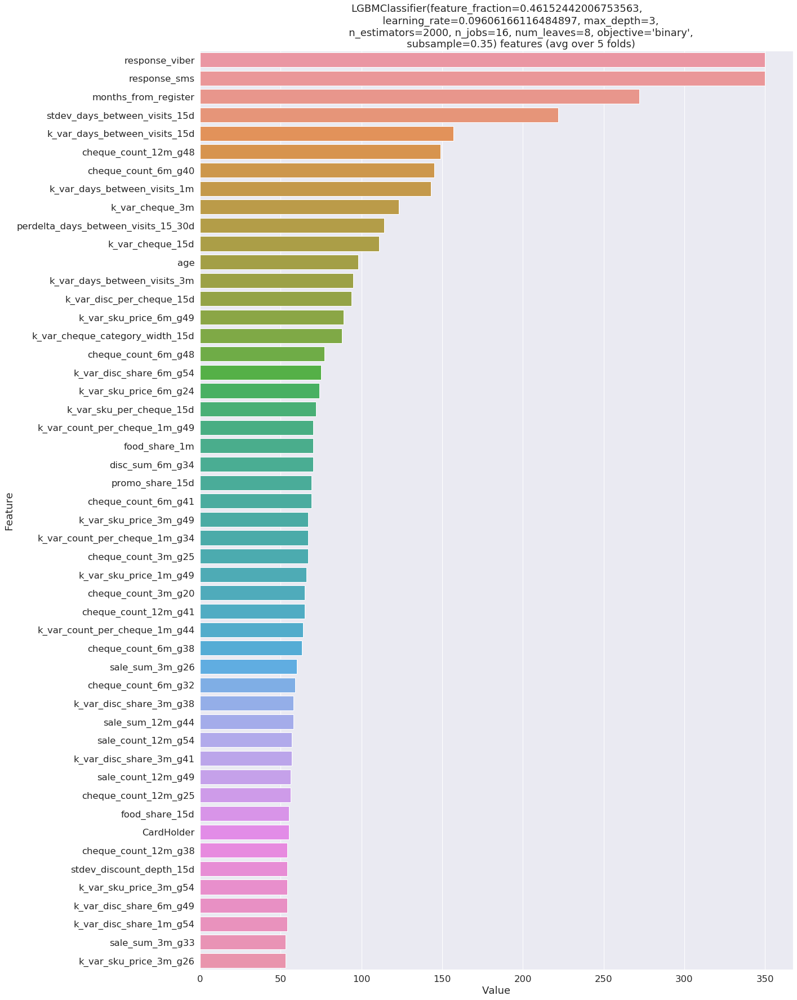

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601397                                               
[100]	valid_0's binary_logloss: 0.599022                                              
[150]	valid_0's binary_logloss: 0.598287                                              
[200]	valid_0's binary_logloss: 0.598126                                              
[250]	valid_0's binary_logloss: 0.598062                                              
[300]	valid_0's binary_logloss: 0.59803                                               
[350]	valid_0's binary_logloss: 0.598005                                              
[400]	valid_0's binary_logloss: 0.597947                                              
[450]	valid_0's binary_logloss: 0.597937                                              
[500]	valid_0's binary_logloss: 0.597909   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601376                                               
[100]	valid_0's binary_logloss: 0.599002                                              
[150]	valid_0's binary_logloss: 0.598421                                              
[200]	valid_0's binary_logloss: 0.59829                                               
[250]	valid_0's binary_logloss: 0.598273                                              
[300]	valid_0's binary_logloss: 0.598268                                              
[350]	valid_0's binary_logloss: 0.59826                                               
[400]	valid_0's binary_logloss: 0.598176                                              
[450]	valid_0's binary_logloss: 0.598159                                              
[500]	valid_0's binary_logloss: 0.59813                                               
Early stopping, best iteration is:         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601366                                               
[100]	valid_0's binary_logloss: 0.598952                                              
[150]	valid_0's binary_logloss: 0.598347                                              
[200]	valid_0's binary_logloss: 0.598238                                              
[250]	valid_0's binary_logloss: 0.598186                                              
[300]	valid_0's binary_logloss: 0.598179                                              
[350]	valid_0's binary_logloss: 0.598182                                              
[400]	valid_0's binary_logloss: 0.59811                                               
Early stopping, best iteration is:                                                    
[391]	valid_0's binary_logloss: 0.5981
6.014607781322065                                                                     
(549

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601196                                               
[100]	valid_0's binary_logloss: 0.598728                                              
[150]	valid_0's binary_logloss: 0.598145                                              
[200]	valid_0's binary_logloss: 0.59801                                               
[250]	valid_0's binary_logloss: 0.597883                                              
[300]	valid_0's binary_logloss: 0.597814                                              
[350]	valid_0's binary_logloss: 0.597796                                              
[400]	valid_0's binary_logloss: 0.597753                                              
[450]	valid_0's binary_logloss: 0.597741                                              
Early stopping, best iteration is:                                                    
[419]	valid_0's binary_logloss: 0.597729
6.

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601473                                               
[100]	valid_0's binary_logloss: 0.599016                                              
[150]	valid_0's binary_logloss: 0.59836                                               
[200]	valid_0's binary_logloss: 0.598242                                              
[250]	valid_0's binary_logloss: 0.598097                                              
[300]	valid_0's binary_logloss: 0.598072                                              
Early stopping, best iteration is:                                                    
[279]	valid_0's binary_logloss: 0.598053
6.941099703237091                                                                     
 42%|████▏     | 21/50 [1:25:10<1:14:58, 155.11s/trial, best loss: -6.363482337980836]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5979772668214612, cross uplift - 6.363925078277619,all_uplift_score - 6.363290329665128, all logloss - 0.5979772667115245
 42%|████▏     | 21/50 [1:25:11<1:14:58, 155.11s/trial, best loss: -6.363482337980836]

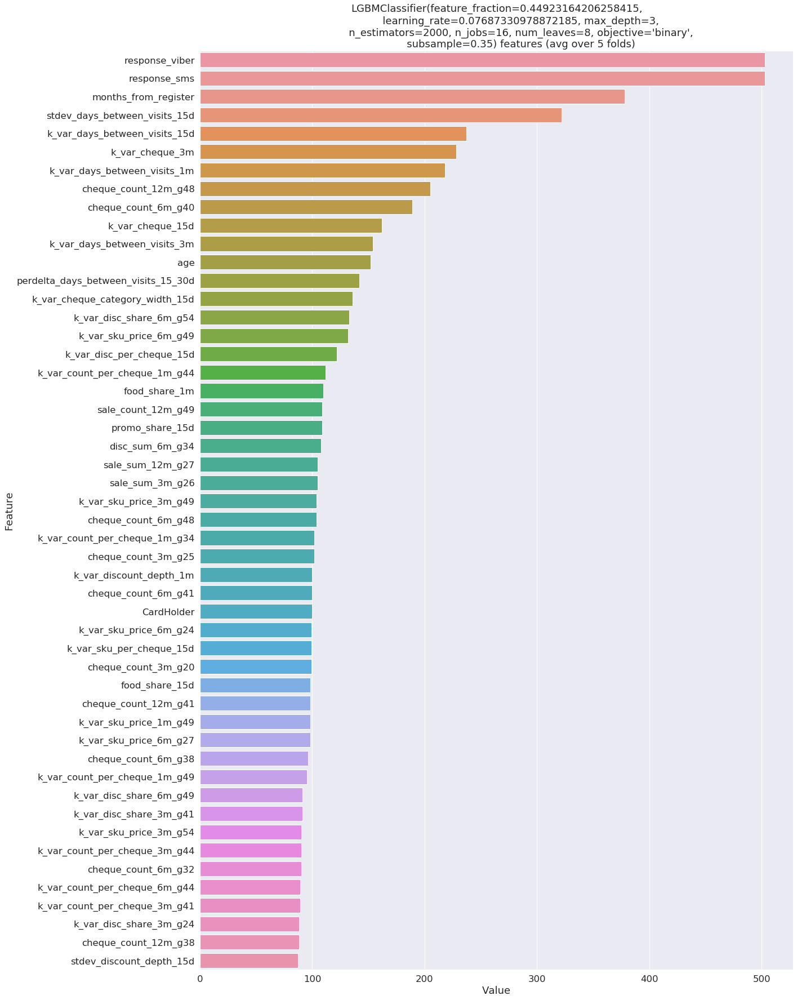

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601528                                               
[100]	valid_0's binary_logloss: 0.59904                                               
[150]	valid_0's binary_logloss: 0.59839                                               
[200]	valid_0's binary_logloss: 0.598255                                              
[250]	valid_0's binary_logloss: 0.598117                                              
[300]	valid_0's binary_logloss: 0.598056                                              
[350]	valid_0's binary_logloss: 0.598028                                              
Early stopping, best iteration is:                                                    
[317]	valid_0's binary_logloss: 0.598022
6.285972357989622                                                                     
(5

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601385                                               
[100]	valid_0's binary_logloss: 0.598963                                              
[150]	valid_0's binary_logloss: 0.598307                                              
[200]	valid_0's binary_logloss: 0.598245                                              
[250]	valid_0's binary_logloss: 0.598145                                              
[300]	valid_0's binary_logloss: 0.598151                                              
Early stopping, best iteration is:                                                    
[279]	valid_0's binary_logloss: 0.59814
6.2214769670961845                                                                    
(549623,)                                                                             
 44%|████▍     | 22/50 [1:26:04<1:12:42, 155.79s/trial, best loss: -6.363925078277619]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601361                                               
[100]	valid_0's binary_logloss: 0.59895                                               
[150]	valid_0's binary_logloss: 0.598317                                              
[200]	valid_0's binary_logloss: 0.598122                                              
[250]	valid_0's binary_logloss: 0.59807                                               
[300]	valid_0's binary_logloss: 0.598009                                              
[350]	valid_0's binary_logloss: 0.597982                                              
[400]	valid_0's binary_logloss: 0.597966                                              
[450]	valid_0's binary_logloss: 0.59797                                               
Early stopping, best iteration is:                                                    
[441]	valid_0's binary_logloss: 0.597956
6.

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601192                                               
[100]	valid_0's binary_logloss: 0.598755                                              
[150]	valid_0's binary_logloss: 0.598041                                              
[200]	valid_0's binary_logloss: 0.597939                                              
[250]	valid_0's binary_logloss: 0.597795                                              
[300]	valid_0's binary_logloss: 0.597774                                              
[350]	valid_0's binary_logloss: 0.597694                                              
[400]	valid_0's binary_logloss: 0.597679                                              
Early stopping, best iteration is:                                                    
[367]	valid_0's binary_logloss: 0.597667
6.140294251121289                                                                     
(5

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.60151                                                
[100]	valid_0's binary_logloss: 0.599028                                              
[150]	valid_0's binary_logloss: 0.598441                                              
[200]	valid_0's binary_logloss: 0.598285                                              
[250]	valid_0's binary_logloss: 0.598206                                              
[300]	valid_0's binary_logloss: 0.598163                                              
[350]	valid_0's binary_logloss: 0.598093                                              
[400]	valid_0's binary_logloss: 0.598082                                              
Early stopping, best iteration is:                                                    
[375]	valid_0's binary_logloss: 0.598078
6.734014402116187                                                                     
 4

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.597972338737774, cross uplift - 6.280525190000404,all_uplift_score - 6.278592988788595, all logloss - 0.5979723385845696
 44%|████▍     | 22/50 [1:27:48<1:12:42, 155.79s/trial, best loss: -6.363925078277619]

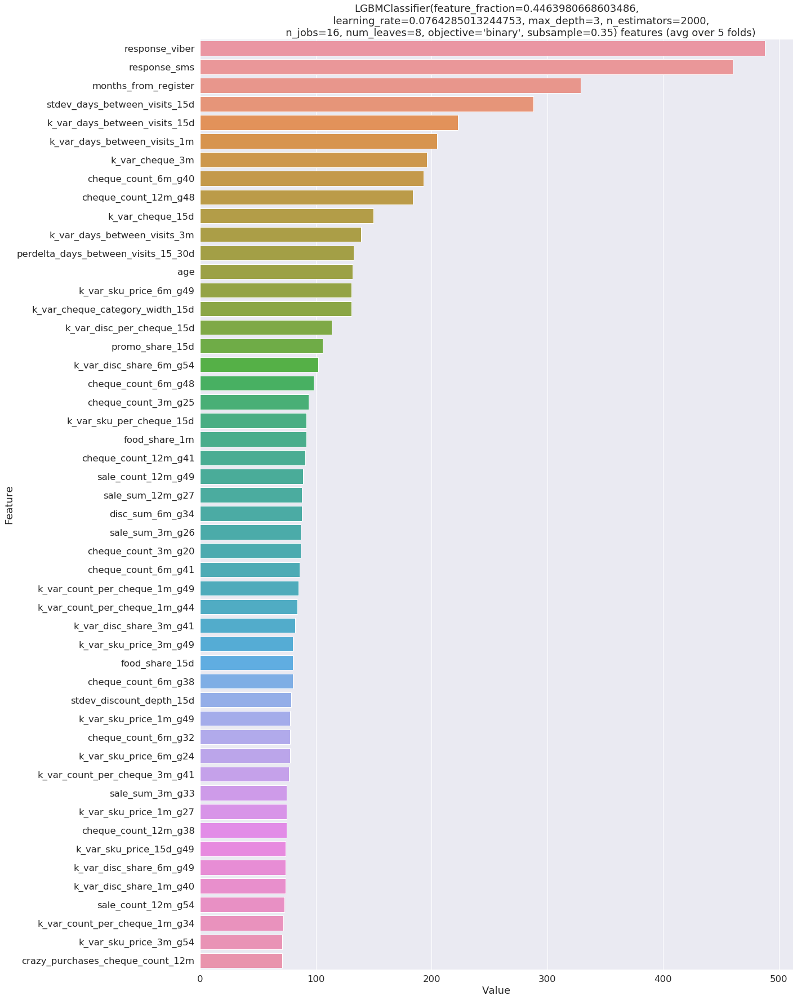

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.602377                                               
[100]	valid_0's binary_logloss: 0.599622                                              
[150]	valid_0's binary_logloss: 0.598826                                              
[200]	valid_0's binary_logloss: 0.598584                                              
[250]	valid_0's binary_logloss: 0.598448                                              
[300]	valid_0's binary_logloss: 0.598395                                              
[350]	valid_0's binary_logloss: 0.598354                                              
[400]	valid_0's binary_logloss: 0.598298                                              
[450]	valid_0's binary_logloss: 0.598261                                              
[500]	valid_0's binary_logloss: 0.598234   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.602424                                               
[100]	valid_0's binary_logloss: 0.599709                                              
[150]	valid_0's binary_logloss: 0.598913                                              
[200]	valid_0's binary_logloss: 0.598729                                              
[250]	valid_0's binary_logloss: 0.5986                                                
[300]	valid_0's binary_logloss: 0.598497                                              
[350]	valid_0's binary_logloss: 0.598468                                              
[400]	valid_0's binary_logloss: 0.598432                                              
[450]	valid_0's binary_logloss: 0.598416                                              
[500]	valid_0's binary_logloss: 0.598417                                              
[550]	valid_0's binary_logloss: 0.598415   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.602272                                               
[100]	valid_0's binary_logloss: 0.599556                                              
[150]	valid_0's binary_logloss: 0.59881                                               
[200]	valid_0's binary_logloss: 0.5986                                                
[250]	valid_0's binary_logloss: 0.59843                                               
[300]	valid_0's binary_logloss: 0.598388                                              
[350]	valid_0's binary_logloss: 0.598346                                              
[400]	valid_0's binary_logloss: 0.598346                                              
[450]	valid_0's binary_logloss: 0.598338                                              
[500]	valid_0's binary_logloss: 0.59831                                               
[550]	valid_0's binary_logloss: 0.598287   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.602149                                               
[100]	valid_0's binary_logloss: 0.599397                                              
[150]	valid_0's binary_logloss: 0.598627                                              
[200]	valid_0's binary_logloss: 0.598395                                              
[250]	valid_0's binary_logloss: 0.598272                                              
[300]	valid_0's binary_logloss: 0.598188                                              
[350]	valid_0's binary_logloss: 0.598122                                              
[400]	valid_0's binary_logloss: 0.598073                                              
[450]	valid_0's binary_logloss: 0.598006                                              
[500]	valid_0's binary_logloss: 0.597988                                              
[550]	valid_0's binary_logloss: 0.597967   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.602488                                               
[100]	valid_0's binary_logloss: 0.599672                                              
[150]	valid_0's binary_logloss: 0.598963                                              
[200]	valid_0's binary_logloss: 0.598699                                              
[250]	valid_0's binary_logloss: 0.598526                                              
[300]	valid_0's binary_logloss: 0.598471                                              
[350]	valid_0's binary_logloss: 0.598418                                              
[400]	valid_0's binary_logloss: 0.598375                                              
[450]	valid_0's binary_logloss: 0.598344                                              
[500]	valid_0's binary_logloss: 0.598312                                              
[550]	valid_0's binary_logloss: 0.598283   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.598211045925929, cross uplift - 6.309369063426257,all_uplift_score - 6.286960787448964, all logloss - 0.5982110458524451
 46%|████▌     | 23/50 [1:31:01<1:10:21, 156.35s/trial, best loss: -6.363925078277619]

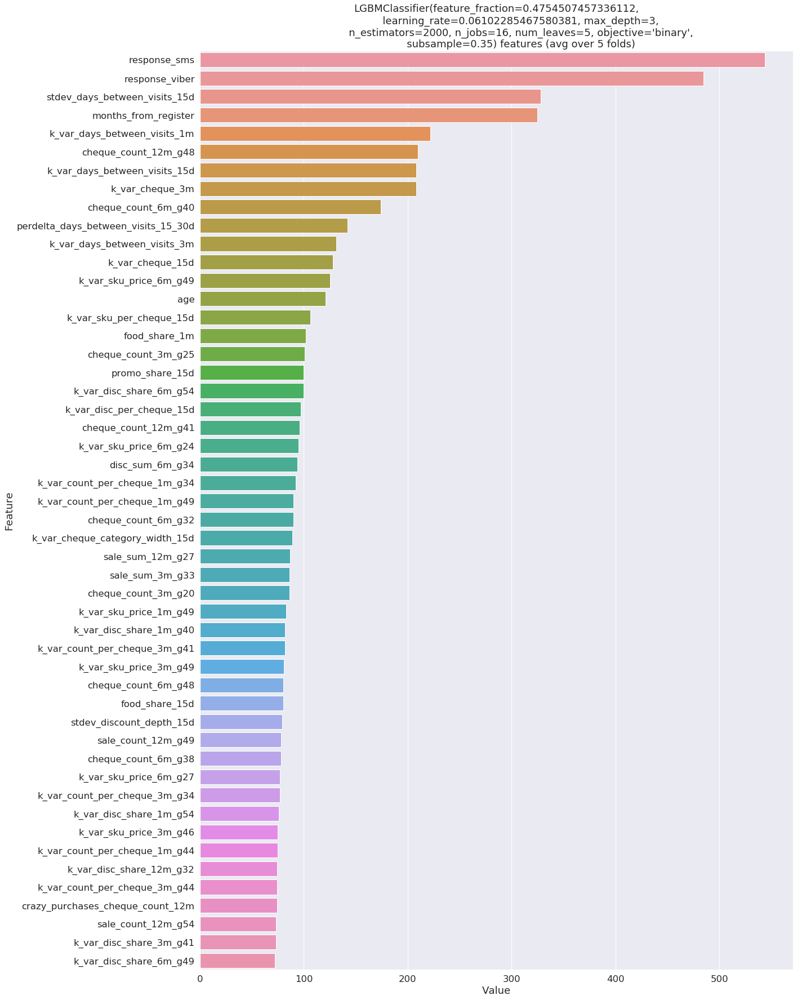

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601697                                               
[100]	valid_0's binary_logloss: 0.599045                                              
[150]	valid_0's binary_logloss: 0.598375                                              
[200]	valid_0's binary_logloss: 0.598254                                              
[250]	valid_0's binary_logloss: 0.59817                                               
[300]	valid_0's binary_logloss: 0.598127                                              
[350]	valid_0's binary_logloss: 0.598088                                              
[400]	valid_0's binary_logloss: 0.598053                                              
[450]	valid_0's binary_logloss: 0.598059                                              
Early stopping, best iteration is:         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601628                                               
[100]	valid_0's binary_logloss: 0.599044                                              
[150]	valid_0's binary_logloss: 0.598446                                              
[200]	valid_0's binary_logloss: 0.598349                                              
[250]	valid_0's binary_logloss: 0.59825                                               
[300]	valid_0's binary_logloss: 0.598195                                              
[350]	valid_0's binary_logloss: 0.598166                                              
[400]	valid_0's binary_logloss: 0.598131                                              
[450]	valid_0's binary_logloss: 0.598128                                              
[500]	valid_0's binary_logloss: 0.598099                                              
[550]	valid_0's binary_logloss: 0.5981     

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601571                                               
[100]	valid_0's binary_logloss: 0.598923                                              
[150]	valid_0's binary_logloss: 0.598321                                              
[200]	valid_0's binary_logloss: 0.598182                                              
[250]	valid_0's binary_logloss: 0.59813                                               
[300]	valid_0's binary_logloss: 0.598076                                              
[350]	valid_0's binary_logloss: 0.598058                                              
[400]	valid_0's binary_logloss: 0.598057                                              
Early stopping, best iteration is:                                                    
[352]	valid_0's binary_logloss: 0.598054
5.988396170685595                                                                     
(5

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601419                                               
[100]	valid_0's binary_logloss: 0.598723                                              
[150]	valid_0's binary_logloss: 0.598149                                              
[200]	valid_0's binary_logloss: 0.597957                                              
[250]	valid_0's binary_logloss: 0.597872                                              
[300]	valid_0's binary_logloss: 0.597817                                              
[350]	valid_0's binary_logloss: 0.59777                                               
[400]	valid_0's binary_logloss: 0.59771                                               
Early stopping, best iteration is:                                                    
[384]	valid_0's binary_logloss: 0.597698
6.204306952994449                                                                     
(5

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601716                                               
[100]	valid_0's binary_logloss: 0.599021                                              
[150]	valid_0's binary_logloss: 0.598478                                              
[200]	valid_0's binary_logloss: 0.598309                                              
[250]	valid_0's binary_logloss: 0.59824                                               
[300]	valid_0's binary_logloss: 0.598191                                              
[350]	valid_0's binary_logloss: 0.598123                                              
Early stopping, best iteration is:                                                    
[340]	valid_0's binary_logloss: 0.59811
6.805229871957058                                                                     
 48%|████▊     | 24/50 [1:33:42<1:12:28, 167.25s/trial, best loss: -6.363925078277619]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5979980648861647, cross uplift - 6.323725052269407,all_uplift_score - 6.332345617834981, all logloss - 0.5979980647232348
 48%|████▊     | 24/50 [1:33:42<1:12:28, 167.25s/trial, best loss: -6.363925078277619]

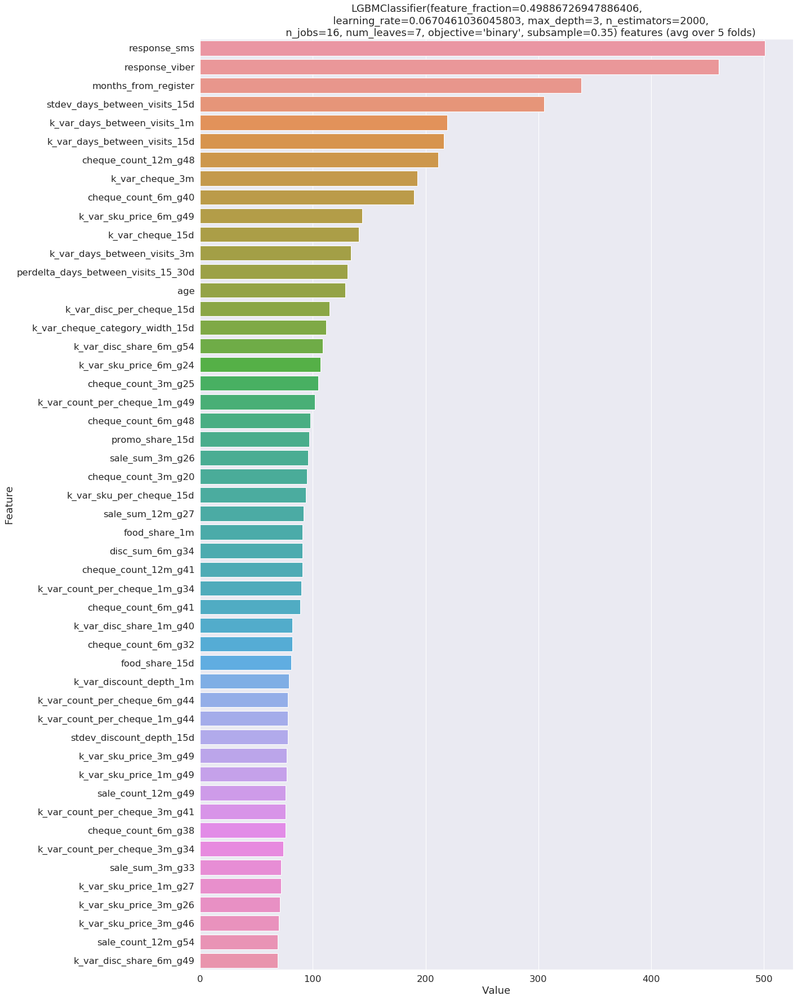

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601158                                               
[100]	valid_0's binary_logloss: 0.59876                                               
[150]	valid_0's binary_logloss: 0.598227                                              
[200]	valid_0's binary_logloss: 0.59811                                               
[250]	valid_0's binary_logloss: 0.598062                                              
[300]	valid_0's binary_logloss: 0.598037                                              
[350]	valid_0's binary_logloss: 0.597982                                              
[400]	valid_0's binary_logloss: 0.59794                                               
[450]	valid_0's binary_logloss: 0.59795                                               
Early stopping, best iteration is:         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.60107                                                
[100]	valid_0's binary_logloss: 0.598691                                              
[150]	valid_0's binary_logloss: 0.59829                                               
[200]	valid_0's binary_logloss: 0.598212                                              
[250]	valid_0's binary_logloss: 0.59818                                               
[300]	valid_0's binary_logloss: 0.598164                                              
[350]	valid_0's binary_logloss: 0.598089                                              
[400]	valid_0's binary_logloss: 0.598106                                              
Early stopping, best iteration is:                                                    
[354]	valid_0's binary_logloss: 0.598081
6.47414395546374                                                                      
(5

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601077                                               
[100]	valid_0's binary_logloss: 0.598607                                              
[150]	valid_0's binary_logloss: 0.598193                                              
[200]	valid_0's binary_logloss: 0.598133                                              
[250]	valid_0's binary_logloss: 0.598094                                              
[300]	valid_0's binary_logloss: 0.598065                                              
[350]	valid_0's binary_logloss: 0.597956                                              
Early stopping, best iteration is:                                                    
[342]	valid_0's binary_logloss: 0.59795
5.95928898192501                                                                      
(549623,)                                                                             
 50

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.600912                                               
[100]	valid_0's binary_logloss: 0.598445                                              
[150]	valid_0's binary_logloss: 0.597991                                              
[200]	valid_0's binary_logloss: 0.597883                                              
[250]	valid_0's binary_logloss: 0.597826                                              
[300]	valid_0's binary_logloss: 0.597812                                              
[350]	valid_0's binary_logloss: 0.597776                                              
[400]	valid_0's binary_logloss: 0.59779                                               
Early stopping, best iteration is:                                                    
[376]	valid_0's binary_logloss: 0.59776
6.088496680360633                                                                     
(54

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.60122                                                
[100]	valid_0's binary_logloss: 0.598713                                              
[150]	valid_0's binary_logloss: 0.598286                                              
[200]	valid_0's binary_logloss: 0.598172                                              
[250]	valid_0's binary_logloss: 0.59812                                               
[300]	valid_0's binary_logloss: 0.59806                                               
[350]	valid_0's binary_logloss: 0.598071                                              
[400]	valid_0's binary_logloss: 0.59804                                               
[450]	valid_0's binary_logloss: 0.598043                                              
Early stopping, best iteration is:                                                    
[401]	valid_0's binary_logloss: 0.598038
6.

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5979533466724574, cross uplift - 6.313942883529526,all_uplift_score - 6.296457637093525, all logloss - 0.597953346549175
 50%|█████     | 25/50 [1:36:16<1:08:52, 165.29s/trial, best loss: -6.363925078277619]

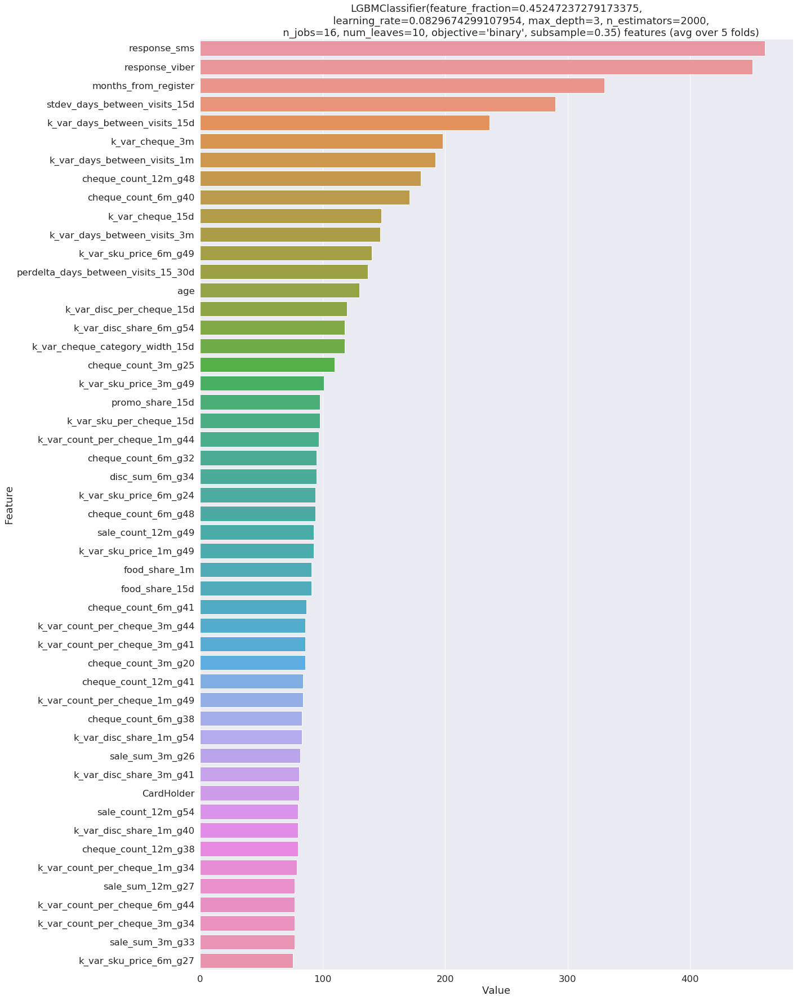

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.603148                                               
[100]	valid_0's binary_logloss: 0.600201                                              
[150]	valid_0's binary_logloss: 0.599326                                              
[200]	valid_0's binary_logloss: 0.598983                                              
[250]	valid_0's binary_logloss: 0.598832                                              
[300]	valid_0's binary_logloss: 0.598797                                              
[350]	valid_0's binary_logloss: 0.59876                                               
[400]	valid_0's binary_logloss: 0.598654                                              
[450]	valid_0's binary_logloss: 0.598638                                              
[500]	valid_0's binary_logloss: 0.598607   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.603025                                               
[100]	valid_0's binary_logloss: 0.600104                                              
[150]	valid_0's binary_logloss: 0.599255                                              
[200]	valid_0's binary_logloss: 0.598973                                              
[250]	valid_0's binary_logloss: 0.598863                                              
[300]	valid_0's binary_logloss: 0.598805                                              
[350]	valid_0's binary_logloss: 0.598714                                              
[400]	valid_0's binary_logloss: 0.598686                                              
Early stopping, best iteration is:                                                    
[398]	valid_0's binary_logloss: 0.598684
6.346006639756413                                                                     
(5

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.603073                                               
[100]	valid_0's binary_logloss: 0.600091                                              
[150]	valid_0's binary_logloss: 0.599199                                              
[200]	valid_0's binary_logloss: 0.598961                                              
[250]	valid_0's binary_logloss: 0.598845                                              
[300]	valid_0's binary_logloss: 0.598812                                              
[350]	valid_0's binary_logloss: 0.598775                                              
[400]	valid_0's binary_logloss: 0.598704                                              
[450]	valid_0's binary_logloss: 0.598647                                              
[500]	valid_0's binary_logloss: 0.598624                                              
[550]	valid_0's binary_logloss: 0.598625   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.602976                                               
[100]	valid_0's binary_logloss: 0.59995                                               
[150]	valid_0's binary_logloss: 0.599067                                              
[200]	valid_0's binary_logloss: 0.59879                                               
[250]	valid_0's binary_logloss: 0.598635                                              
[300]	valid_0's binary_logloss: 0.598576                                              
[350]	valid_0's binary_logloss: 0.598448                                              
[400]	valid_0's binary_logloss: 0.598398                                              
[450]	valid_0's binary_logloss: 0.59832                                               
[500]	valid_0's binary_logloss: 0.598302                                              
[550]	valid_0's binary_logloss: 0.598283   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.603202                                               
[100]	valid_0's binary_logloss: 0.60025                                               
[150]	valid_0's binary_logloss: 0.599392                                              
[200]	valid_0's binary_logloss: 0.599138                                              
[250]	valid_0's binary_logloss: 0.59901                                               
[300]	valid_0's binary_logloss: 0.598882                                              
[350]	valid_0's binary_logloss: 0.598848                                              
[400]	valid_0's binary_logloss: 0.598806                                              
[450]	valid_0's binary_logloss: 0.598777                                              
[500]	valid_0's binary_logloss: 0.598729                                              
[550]	valid_0's binary_logloss: 0.59868    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5985255710284294, cross uplift - 6.268818938742146,all_uplift_score - 6.276802130806244, all logloss - 0.5985255708228844
 52%|█████▏    | 26/50 [1:39:13<1:04:50, 162.10s/trial, best loss: -6.363925078277619]

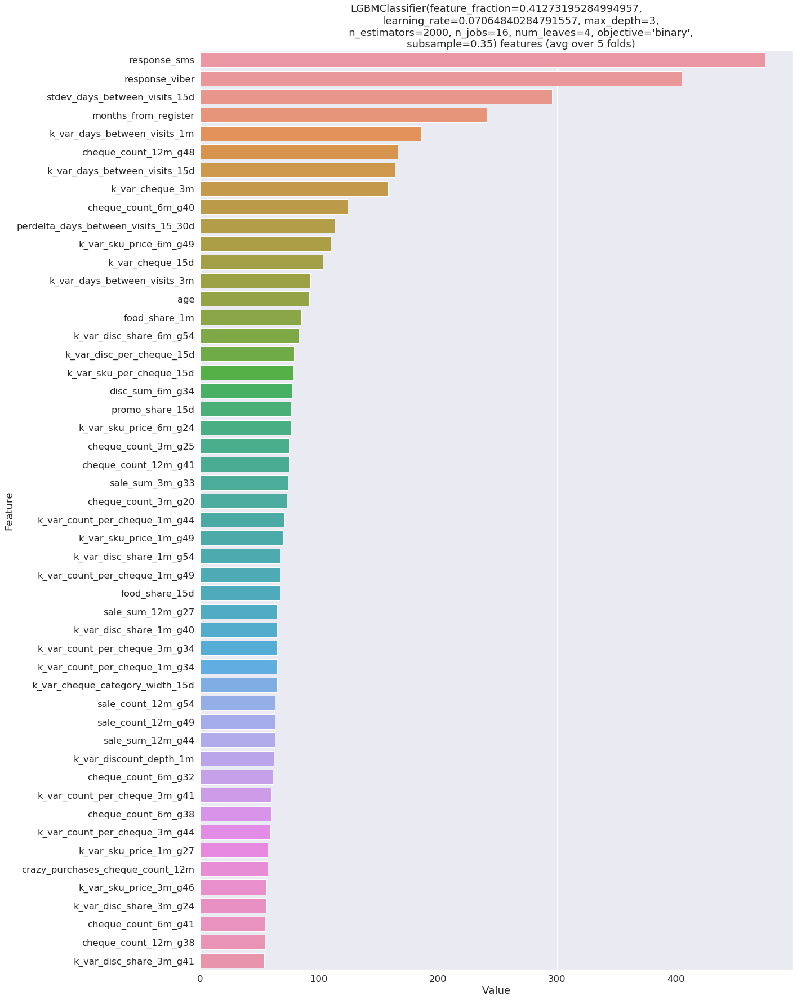

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601631                                               
[100]	valid_0's binary_logloss: 0.598969                                              
[150]	valid_0's binary_logloss: 0.598305                                              
[200]	valid_0's binary_logloss: 0.598216                                              
[250]	valid_0's binary_logloss: 0.598161                                              
[300]	valid_0's binary_logloss: 0.598157                                              
[350]	valid_0's binary_logloss: 0.598053                                              
[400]	valid_0's binary_logloss: 0.598036                                              
Early stopping, best iteration is:                                                    
[377]	valid_0's binary_logloss: 0.598025
6.

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601379                                               
[100]	valid_0's binary_logloss: 0.598748                                              
[150]	valid_0's binary_logloss: 0.598249                                              
[200]	valid_0's binary_logloss: 0.598124                                              
[250]	valid_0's binary_logloss: 0.598093                                              
[300]	valid_0's binary_logloss: 0.598076                                              
Early stopping, best iteration is:                                                    
[287]	valid_0's binary_logloss: 0.59806
6.366834728659088                                                                     
(549623,)                                                                             
 54%|█████▍    | 27/50 [1:40:16<1:04:21, 167.89s/trial, best loss: -6.363925078277619]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601427                                               
[100]	valid_0's binary_logloss: 0.598774                                              
[150]	valid_0's binary_logloss: 0.598235                                              
[200]	valid_0's binary_logloss: 0.598163                                              
[250]	valid_0's binary_logloss: 0.598113                                              
[300]	valid_0's binary_logloss: 0.59812                                               
Early stopping, best iteration is:                                                    
[256]	valid_0's binary_logloss: 0.598104
6.1694888063674815                                                                    
(549623,)                                                                             
 54%|█████▍    | 27/50 [1:40:40<1:04:21, 167.89s/trial, best loss: -6.363925078277619]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601404                                               
[100]	valid_0's binary_logloss: 0.598643                                              
[150]	valid_0's binary_logloss: 0.59804                                               
[200]	valid_0's binary_logloss: 0.597924                                              
[250]	valid_0's binary_logloss: 0.597881                                              
[300]	valid_0's binary_logloss: 0.597867                                              
[350]	valid_0's binary_logloss: 0.597825                                              
[400]	valid_0's binary_logloss: 0.597793                                              
[450]	valid_0's binary_logloss: 0.597787                                              
[500]	valid_0's binary_logloss: 0.597795                                              
Early stopping, best iteration is:         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                          
[50]	valid_0's binary_logloss: 0.601573                                               
[100]	valid_0's binary_logloss: 0.598851                                              
[150]	valid_0's binary_logloss: 0.598375                                              
[200]	valid_0's binary_logloss: 0.598174                                              
[250]	valid_0's binary_logloss: 0.59811                                               
[300]	valid_0's binary_logloss: 0.598125                                              
Early stopping, best iteration is:                                                    
[257]	valid_0's binary_logloss: 0.598096
6.8389596869880025                                                                    
 54%|█████▍    | 27/50 [1:41:32<1:04:21, 167.89s/trial, best loss: -6.363925078277619]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980112681490792, cross uplift - 6.376644336453608,all_uplift_score - 6.356521096261128, all logloss - 0.5980112680262025
 54%|█████▍    | 27/50 [1:41:33<1:04:21, 167.89s/trial, best loss: -6.363925078277619]

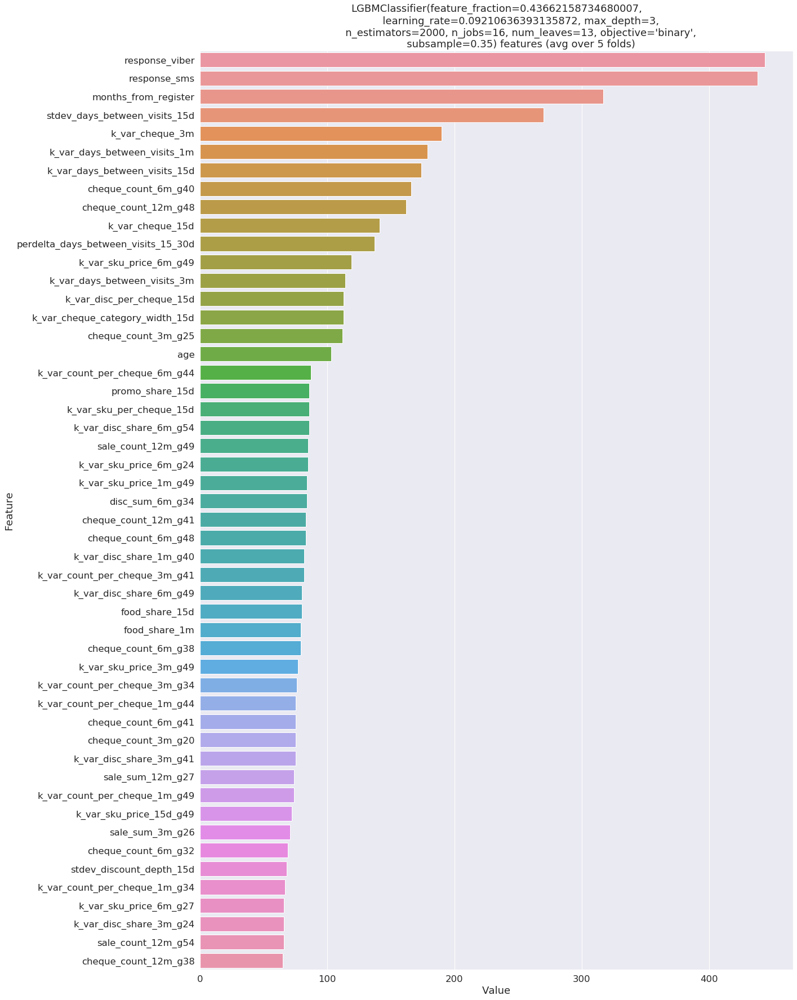

(549623,)                                                                             
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600908                                             
[100]	valid_0's binary_logloss: 0.598689                                            
[150]	valid_0's binary_logloss: 0.598209                                            
[200]	valid_0's binary_logloss: 0.598103                                            
[250]	valid_0's binary_logloss: 0.598013                                            
[300]	valid_0's binary_logloss: 0.597964                                            
[350]	valid_0's binary_logloss: 0.597942                                            
[400]	valid_0's binary_logloss: 0.597849                                            
[450]	valid_0's binary_logloss: 0.597855                                            
Early stopping, best iteration is:                             

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600966                                             
[100]	valid_0's binary_logloss: 0.598756                                            
[150]	valid_0's binary_logloss: 0.598409                                            
[200]	valid_0's binary_logloss: 0.598348                                            
[250]	valid_0's binary_logloss: 0.598252                                            
[300]	valid_0's binary_logloss: 0.598219                                            
[350]	valid_0's binary_logloss: 0.598216                                            
Early stopping, best iteration is:                                                  
[325]	valid_0's binary_logloss: 0.598198
6.470702369892176                                                                   
(549623,)                                                                           
 56%|█████▌    | 28/50 [

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600874                                             
[100]	valid_0's binary_logloss: 0.598598                                            
[150]	valid_0's binary_logloss: 0.598182                                            
[200]	valid_0's binary_logloss: 0.59806                                             
[250]	valid_0's binary_logloss: 0.597954                                            
[300]	valid_0's binary_logloss: 0.597888                                            
Early stopping, best iteration is:                                                  
[270]	valid_0's binary_logloss: 0.59788
6.010299152750342                                                                   
(549623,)                                                                           
 56%|█████▌    | 28/50 [1:43:06<57:53, 157.88s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600742                                             
[100]	valid_0's binary_logloss: 0.598437                                            
[150]	valid_0's binary_logloss: 0.597971                                            
[200]	valid_0's binary_logloss: 0.597895                                            
[250]	valid_0's binary_logloss: 0.597768                                            
[300]	valid_0's binary_logloss: 0.597722                                            
[350]	valid_0's binary_logloss: 0.59771                                             
Early stopping, best iteration is:                                                  
[327]	valid_0's binary_logloss: 0.597701
6.211578702518855                                                                   
(549624,)                                                                           
 56%|█████▌    | 28/50 [

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600969                                             
[100]	valid_0's binary_logloss: 0.598709                                            
[150]	valid_0's binary_logloss: 0.598321                                            
[200]	valid_0's binary_logloss: 0.598193                                            
[250]	valid_0's binary_logloss: 0.598141                                            
[300]	valid_0's binary_logloss: 0.598102                                            
Early stopping, best iteration is:                                                  
[279]	valid_0's binary_logloss: 0.598099
6.7546057936141075                                                                  
 56%|█████▌    | 28/50 [1:43:54<57:53, 157.88s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5979412909867046, cross uplift - 6.325691141279917,all_uplift_score - 6.312843844010866, all logloss - 0.5979412907577104
 56%|█████▌    | 28/50 [1:43:54<57:53, 157.88s/trial, best loss: -6.376644336453608]

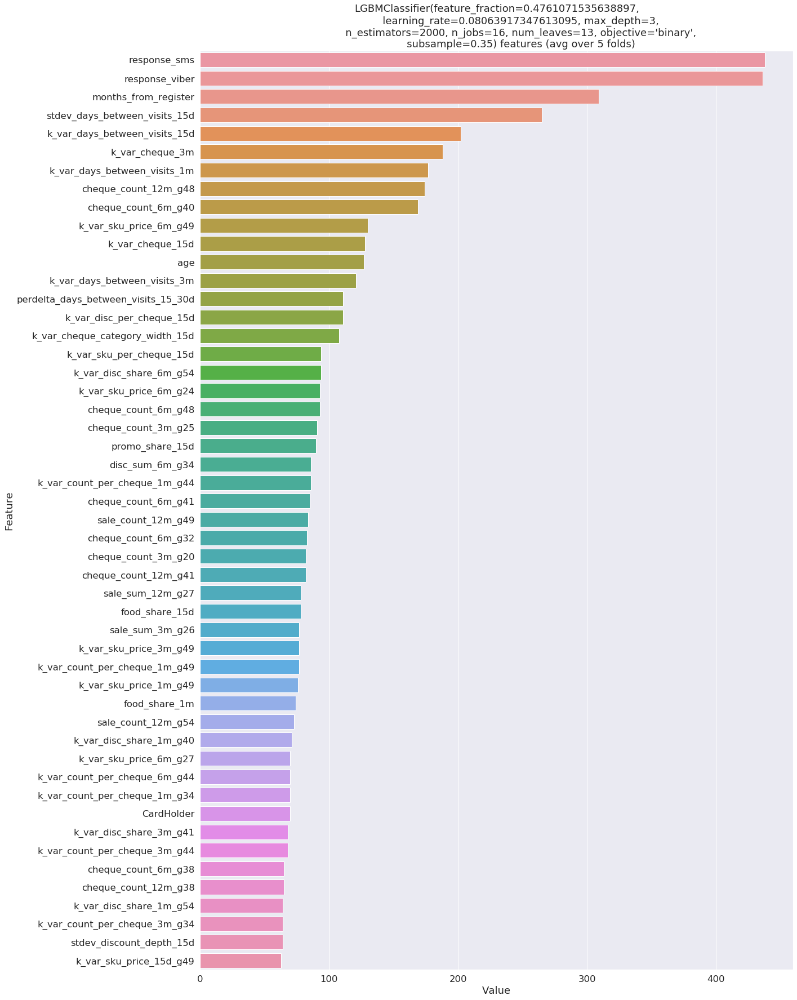

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.602951                                             
[100]	valid_0's binary_logloss: 0.599694                                            
[150]	valid_0's binary_logloss: 0.598659                                            
[200]	valid_0's binary_logloss: 0.598272                                            
[250]	valid_0's binary_logloss: 0.598098                                            
[300]	valid_0's binary_logloss: 0.598057                                            
[350]	valid_0's binary_logloss: 0.598013                                            
[400]	valid_0's binary_logloss: 0.597926                                            
[450]	valid_0's binary_logloss: 0.597868                                            
Early stopping, best iteration is:                               

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.602832                                             
[100]	valid_0's binary_logloss: 0.599621                                            
[150]	valid_0's binary_logloss: 0.598736                                            
[200]	valid_0's binary_logloss: 0.598367                                            
[250]	valid_0's binary_logloss: 0.598284                                            
[300]	valid_0's binary_logloss: 0.598197                                            
[350]	valid_0's binary_logloss: 0.59815                                             
[400]	valid_0's binary_logloss: 0.598145                                            
[450]	valid_0's binary_logloss: 0.598141                                            
[500]	valid_0's binary_logloss: 0.598123                                            
Early stopping, best iteration is:                               

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.602862                                             
[100]	valid_0's binary_logloss: 0.599651                                            
[150]	valid_0's binary_logloss: 0.598656                                            
[200]	valid_0's binary_logloss: 0.598329                                            
[250]	valid_0's binary_logloss: 0.598182                                            
[300]	valid_0's binary_logloss: 0.598119                                            
[350]	valid_0's binary_logloss: 0.59807                                             
[400]	valid_0's binary_logloss: 0.598058                                            
[450]	valid_0's binary_logloss: 0.597995                                            
[500]	valid_0's binary_logloss: 0.597961                                            
Early stopping, best iteration is:                               

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.602707                                             
[100]	valid_0's binary_logloss: 0.5994                                              
[150]	valid_0's binary_logloss: 0.59849                                             
[200]	valid_0's binary_logloss: 0.598059                                            
[250]	valid_0's binary_logloss: 0.597981                                            
[300]	valid_0's binary_logloss: 0.5979                                              
[350]	valid_0's binary_logloss: 0.597858                                            
[400]	valid_0's binary_logloss: 0.597807                                            
[450]	valid_0's binary_logloss: 0.597781                                            
[500]	valid_0's binary_logloss: 0.59778                                             
Early stopping, best iteration is:                               

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.603026                                             
[100]	valid_0's binary_logloss: 0.59976                                             
[150]	valid_0's binary_logloss: 0.598764                                            
[200]	valid_0's binary_logloss: 0.598368                                            
[250]	valid_0's binary_logloss: 0.598181                                            
[300]	valid_0's binary_logloss: 0.59811                                             
[350]	valid_0's binary_logloss: 0.59809                                             
[400]	valid_0's binary_logloss: 0.598026                                            
Early stopping, best iteration is:                                                  
[399]	valid_0's binary_logloss: 0.598026
6.901004636785163                                                                   
 58%|█████▊    | 29/50 [

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5979440563060423, cross uplift - 6.2896616852248695,all_uplift_score - 6.3005674857435245, all logloss - 0.5979440561872926
 58%|█████▊    | 29/50 [1:46:48<54:04, 154.50s/trial, best loss: -6.376644336453608]

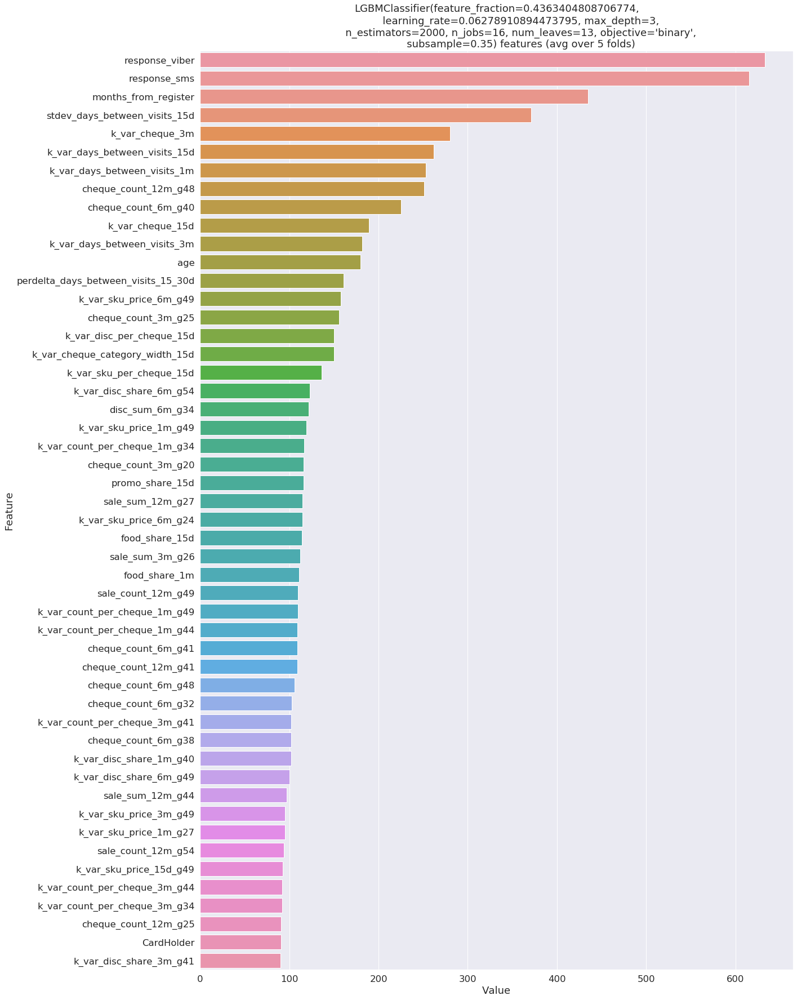

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.601744                                             
[100]	valid_0's binary_logloss: 0.599104                                            
[150]	valid_0's binary_logloss: 0.598407                                            
[200]	valid_0's binary_logloss: 0.598172                                            
[250]	valid_0's binary_logloss: 0.598151                                            
Early stopping, best iteration is:                                                  
[206]	valid_0's binary_logloss: 0.598146
6.097453060827399                                                                   
(549623,)                                                                           
 60%|██████    | 30/50 [1:47:14<52:53, 158.68s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.601518                                             
[100]	valid_0's binary_logloss: 0.598946                                            
[150]	valid_0's binary_logloss: 0.598351                                            
[200]	valid_0's binary_logloss: 0.598229                                            
[250]	valid_0's binary_logloss: 0.598213                                            
Early stopping, best iteration is:                                                  
[219]	valid_0's binary_logloss: 0.5982
6.407807646008176                                                                   
(549623,)                                                                           
 60%|██████    | 30/50 [1:47:35<52:53, 158.68s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.601606                                             
[100]	valid_0's binary_logloss: 0.598908                                            
[150]	valid_0's binary_logloss: 0.598356                                            
[200]	valid_0's binary_logloss: 0.598218                                            
[250]	valid_0's binary_logloss: 0.598182                                            
[300]	valid_0's binary_logloss: 0.598169                                            
Early stopping, best iteration is:                                                  
[287]	valid_0's binary_logloss: 0.598163
5.994834870769555                                                                   
(549623,)                                                                           
 60%|██████    | 30/50 [1:47:59<52:53, 158.68s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.601342                                             
[100]	valid_0's binary_logloss: 0.598653                                            
[150]	valid_0's binary_logloss: 0.598006                                            
[200]	valid_0's binary_logloss: 0.597825                                            
[250]	valid_0's binary_logloss: 0.597805                                            
[300]	valid_0's binary_logloss: 0.59779                                             
[350]	valid_0's binary_logloss: 0.597788                                            
[400]	valid_0's binary_logloss: 0.597721                                            
[450]	valid_0's binary_logloss: 0.59772                                             
Early stopping, best iteration is:                                                  
[432]	valid_0's binary_logloss: 0.59769
6.120974405677593        

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.601665                                             
[100]	valid_0's binary_logloss: 0.599036                                            
[150]	valid_0's binary_logloss: 0.598385                                            
[200]	valid_0's binary_logloss: 0.598283                                            
[250]	valid_0's binary_logloss: 0.598151                                            
[300]	valid_0's binary_logloss: 0.598144                                            
Early stopping, best iteration is:                                                  
[274]	valid_0's binary_logloss: 0.598106
6.842734372180856                                                                   
 60%|██████    | 30/50 [1:48:46<52:53, 158.68s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980608806481464, cross uplift - 6.292760871092716,all_uplift_score - 6.287497030632141, all logloss - 0.5980608805825174
 60%|██████    | 30/50 [1:48:46<52:53, 158.68s/trial, best loss: -6.376644336453608]

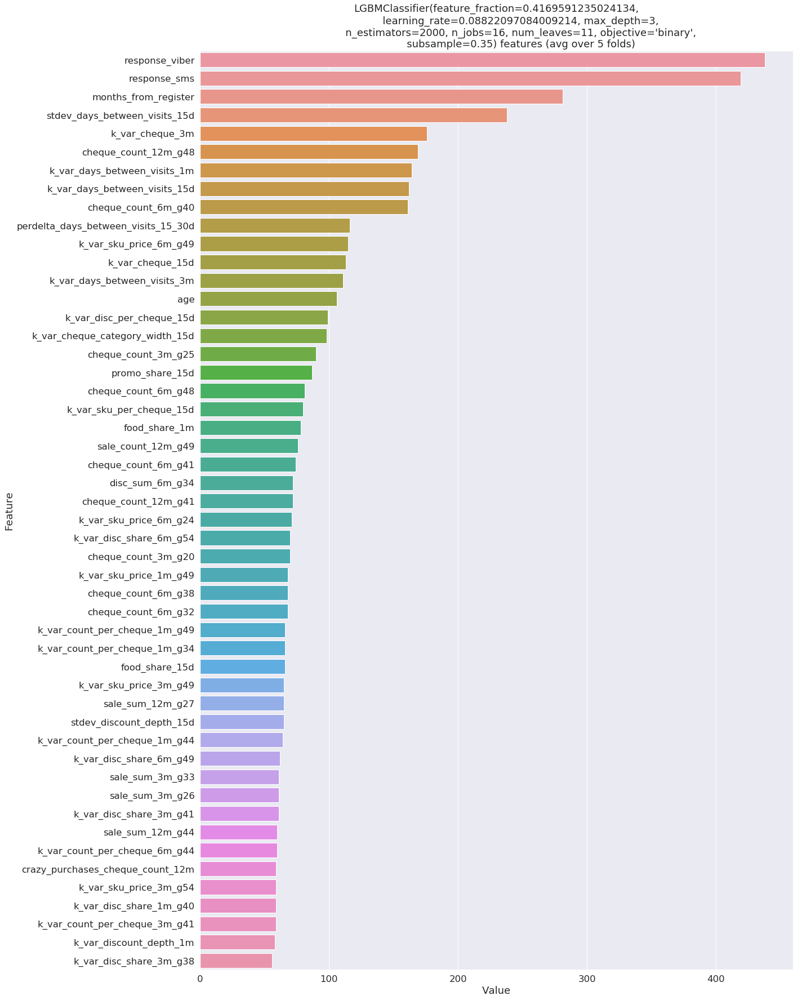

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.604841                                             
[100]	valid_0's binary_logloss: 0.60161                                             
[150]	valid_0's binary_logloss: 0.60008                                             
[200]	valid_0's binary_logloss: 0.599329                                            
[250]	valid_0's binary_logloss: 0.59869                                             
[300]	valid_0's binary_logloss: 0.59838                                             
[350]	valid_0's binary_logloss: 0.598213                                            
[400]	valid_0's binary_logloss: 0.598132                                            
[450]	valid_0's binary_logloss: 0.598067                                            
[500]	valid_0's binary_logloss: 0.598018                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.60476                                              
[100]	valid_0's binary_logloss: 0.601537                                            
[150]	valid_0's binary_logloss: 0.600017                                            
[200]	valid_0's binary_logloss: 0.599328                                            
[250]	valid_0's binary_logloss: 0.598753                                            
[300]	valid_0's binary_logloss: 0.598475                                            
[350]	valid_0's binary_logloss: 0.598284                                            
[400]	valid_0's binary_logloss: 0.598249                                            
[450]	valid_0's binary_logloss: 0.598232                                            
[500]	valid_0's binary_logloss: 0.598205                                            
[550]	valid_0's binary_logloss: 0.598174                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.604839                                             
[100]	valid_0's binary_logloss: 0.601557                                            
[150]	valid_0's binary_logloss: 0.600004                                            
[200]	valid_0's binary_logloss: 0.599282                                            
[250]	valid_0's binary_logloss: 0.598676                                            
[300]	valid_0's binary_logloss: 0.598394                                            
[350]	valid_0's binary_logloss: 0.598252                                            
[400]	valid_0's binary_logloss: 0.598196                                            
[450]	valid_0's binary_logloss: 0.598146                                            
[500]	valid_0's binary_logloss: 0.598134                                            
Early stopping, best iteration is:                               

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.60465                                              
[100]	valid_0's binary_logloss: 0.601313                                            
[150]	valid_0's binary_logloss: 0.599765                                            
[200]	valid_0's binary_logloss: 0.599078                                            
[250]	valid_0's binary_logloss: 0.598459                                            
[300]	valid_0's binary_logloss: 0.598203                                            
[350]	valid_0's binary_logloss: 0.598017                                            
[400]	valid_0's binary_logloss: 0.597935                                            
[450]	valid_0's binary_logloss: 0.597882                                            
[500]	valid_0's binary_logloss: 0.597861                                            
[550]	valid_0's binary_logloss: 0.597808                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.604892                                             
[100]	valid_0's binary_logloss: 0.60157                                             
[150]	valid_0's binary_logloss: 0.600033                                            
[200]	valid_0's binary_logloss: 0.599345                                            
[250]	valid_0's binary_logloss: 0.598727                                            
[300]	valid_0's binary_logloss: 0.598463                                            
[350]	valid_0's binary_logloss: 0.598338                                            
[400]	valid_0's binary_logloss: 0.598276                                            
[450]	valid_0's binary_logloss: 0.598201                                            
[500]	valid_0's binary_logloss: 0.598163                                            
[550]	valid_0's binary_logloss: 0.598139                         

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980020971995024, cross uplift - 6.355407440252341,all_uplift_score - 6.324188434037698, all logloss - 0.5980020970616075
 62%|██████▏   | 31/50 [1:50:18<46:16, 146.11s/trial, best loss: -6.376644336453608]

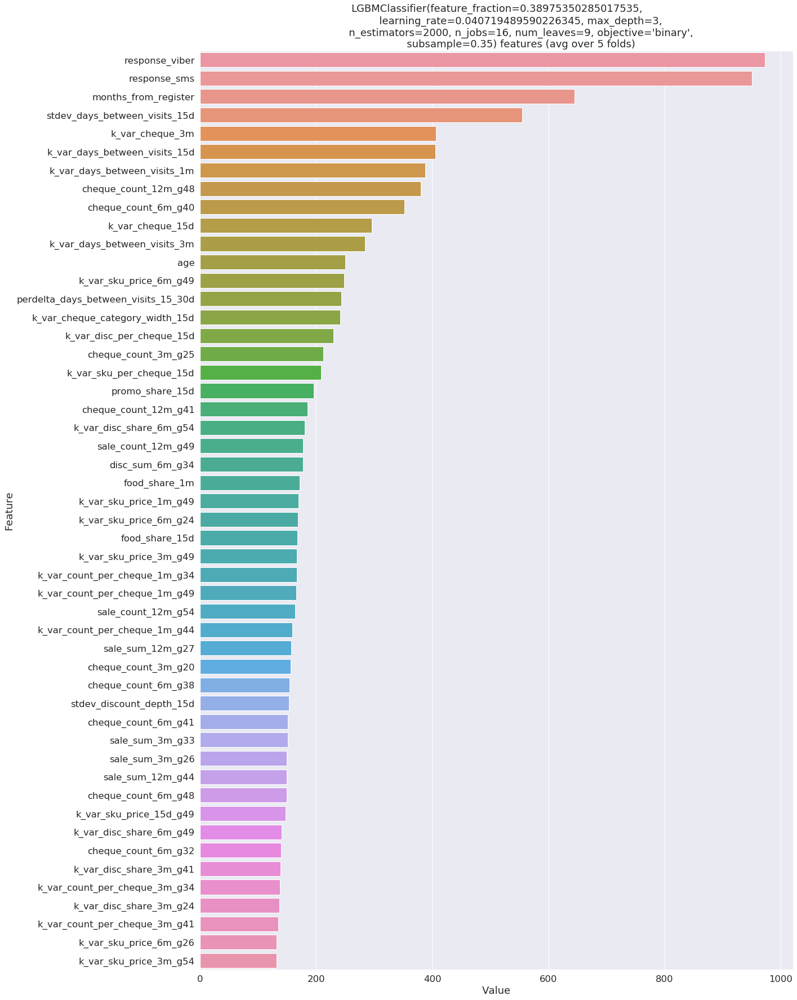

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.602                                                
[100]	valid_0's binary_logloss: 0.599144                                            
[150]	valid_0's binary_logloss: 0.598457                                            
[200]	valid_0's binary_logloss: 0.598233                                            
[250]	valid_0's binary_logloss: 0.598162                                            
[300]	valid_0's binary_logloss: 0.598142                                            
Early stopping, best iteration is:                                                  
[299]	valid_0's binary_logloss: 0.59814
6.182894174264875                                                                   
(549623,)                                                                           
 64%|██████▍   | 32/50 [1

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.601901                                             
[100]	valid_0's binary_logloss: 0.599106                                            
[150]	valid_0's binary_logloss: 0.598463                                            
[200]	valid_0's binary_logloss: 0.598308                                            
[250]	valid_0's binary_logloss: 0.598215                                            
[300]	valid_0's binary_logloss: 0.598211                                            
Early stopping, best iteration is:                                                  
[256]	valid_0's binary_logloss: 0.5982
6.246029321977622                                                                   
(549623,)                                                                           
 64%|██████▍   | 32/50 [1:50:43<38:59, 130.00s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.601978                                             
[100]	valid_0's binary_logloss: 0.599024                                            
[150]	valid_0's binary_logloss: 0.598299                                            
[200]	valid_0's binary_logloss: 0.598188                                            
[250]	valid_0's binary_logloss: 0.598161                                            
[300]	valid_0's binary_logloss: 0.598043                                            
[350]	valid_0's binary_logloss: 0.598012                                            
Early stopping, best iteration is:                                                  
[316]	valid_0's binary_logloss: 0.597998
6.091311318876722                                                                   
(549623,)                                                                           
 64%|██████▍   | 32/50 [

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.601774                                             
[100]	valid_0's binary_logloss: 0.598838                                            
[150]	valid_0's binary_logloss: 0.598177                                            
[200]	valid_0's binary_logloss: 0.598044                                            
[250]	valid_0's binary_logloss: 0.597915                                            
[300]	valid_0's binary_logloss: 0.597819                                            
[350]	valid_0's binary_logloss: 0.597795                                            
[400]	valid_0's binary_logloss: 0.597801                                            
Early stopping, best iteration is:                                                  
[357]	valid_0's binary_logloss: 0.597784
6.186295935090288                                                                   
(549624,)               

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.602086                                             
[100]	valid_0's binary_logloss: 0.599114                                            
[150]	valid_0's binary_logloss: 0.598454                                            
[200]	valid_0's binary_logloss: 0.598227                                            
[250]	valid_0's binary_logloss: 0.598101                                            
[300]	valid_0's binary_logloss: 0.598105                                            
Early stopping, best iteration is:                                                  
[259]	valid_0's binary_logloss: 0.598092
7.056655424705441                                                                   
 64%|██████▍   | 32/50 [1:51:18<38:59, 130.00s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980428529202096, cross uplift - 6.352637234982989,all_uplift_score - 6.30646112528056, all logloss - 0.5980428528483833
 64%|██████▍   | 32/50 [1:51:18<38:59, 130.00s/trial, best loss: -6.376644336453608]

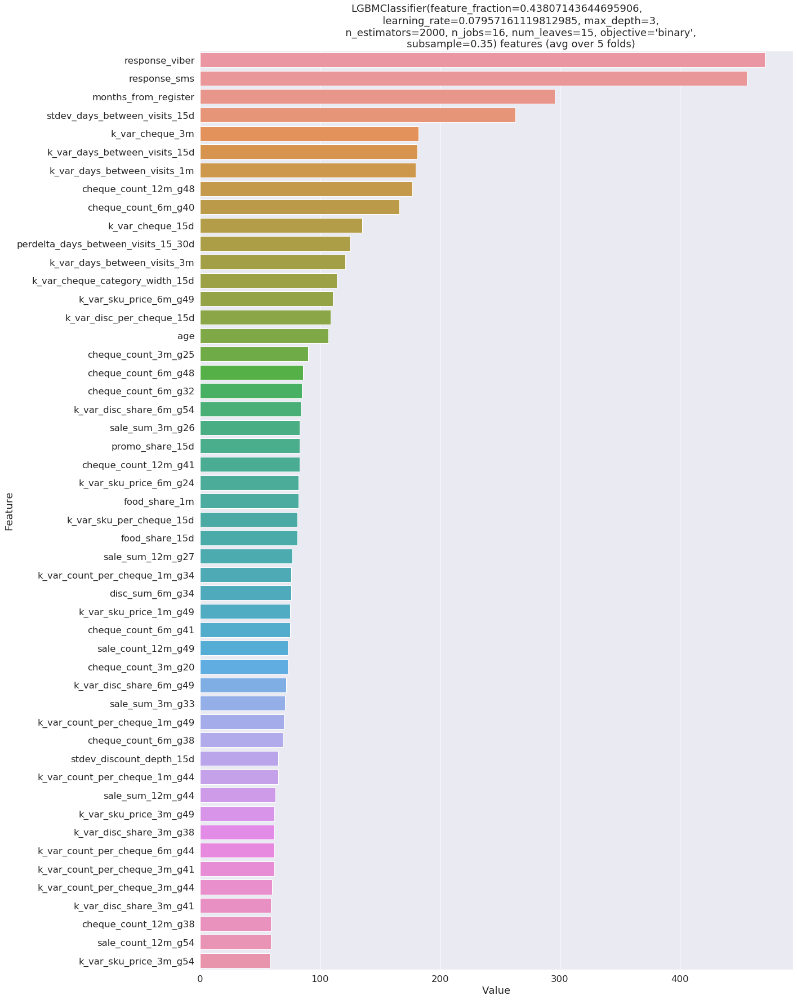

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600652                                             
[100]	valid_0's binary_logloss: 0.598524                                            
[150]	valid_0's binary_logloss: 0.59821                                             
[200]	valid_0's binary_logloss: 0.598156                                            
[250]	valid_0's binary_logloss: 0.598038                                            
[300]	valid_0's binary_logloss: 0.59805                                             
Early stopping, best iteration is:                                                  
[256]	valid_0's binary_logloss: 0.59803
6.248987393864216                                                                   
(549623,)                                                                           
 66%|██████▌   | 33/50 [1

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600598                                             
[100]	valid_0's binary_logloss: 0.598528                                            
[150]	valid_0's binary_logloss: 0.598291                                            
[200]	valid_0's binary_logloss: 0.598238                                            
[250]	valid_0's binary_logloss: 0.598203                                            
[300]	valid_0's binary_logloss: 0.598103                                            
[350]	valid_0's binary_logloss: 0.598101                                            
Early stopping, best iteration is:                                                  
[319]	valid_0's binary_logloss: 0.598091
6.456784305141625                                                                   
(549623,)                                                                           
 66%|██████▌   | 33/50 [

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600446                                             
[100]	valid_0's binary_logloss: 0.598381                                            
[150]	valid_0's binary_logloss: 0.598152                                            
[200]	valid_0's binary_logloss: 0.598067                                            
[250]	valid_0's binary_logloss: 0.597973                                            
Early stopping, best iteration is:                                                  
[239]	valid_0's binary_logloss: 0.597962
5.9512851341947                                                                     
(549623,)                                                                           
 66%|██████▌   | 33/50 [1:51:55<30:52, 108.99s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600263                                             
[100]	valid_0's binary_logloss: 0.598206                                            
[150]	valid_0's binary_logloss: 0.597909                                            
[200]	valid_0's binary_logloss: 0.597832                                            
[250]	valid_0's binary_logloss: 0.597771                                            
[300]	valid_0's binary_logloss: 0.597755                                            
Early stopping, best iteration is:                                                  
[283]	valid_0's binary_logloss: 0.59774
6.122515188571651                                                                   
(549624,)                                                                           
 66%|██████▌   | 33/50 [1:52:08<30:52, 108.99s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                        
[50]	valid_0's binary_logloss: 0.600525                                             
[100]	valid_0's binary_logloss: 0.598491                                            
[150]	valid_0's binary_logloss: 0.59822                                             
[200]	valid_0's binary_logloss: 0.598104                                            
[250]	valid_0's binary_logloss: 0.598033                                            
[300]	valid_0's binary_logloss: 0.597984                                            
Early stopping, best iteration is:                                                  
[271]	valid_0's binary_logloss: 0.597972
7.013621692561695                                                                   
 66%|██████▌   | 33/50 [1:52:20<30:52, 108.99s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5979589931316551, cross uplift - 6.358638742866778,all_uplift_score - 6.3307298800325515, all logloss - 0.5979589931131452
 66%|██████▌   | 33/50 [1:52:20<30:52, 108.99s/trial, best loss: -6.376644336453608]

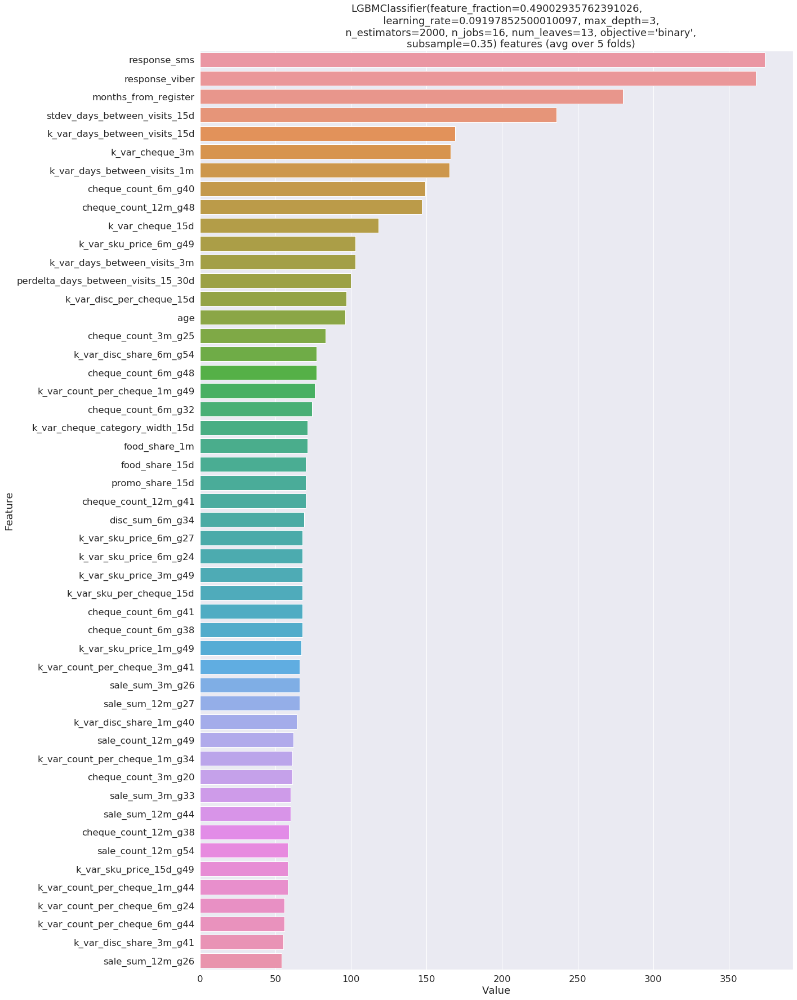

(549623,)                                                                           
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602576                                            
[100]	valid_0's binary_logloss: 0.599614                                           
[150]	valid_0's binary_logloss: 0.598664                                           
[200]	valid_0's binary_logloss: 0.598261                                           
[250]	valid_0's binary_logloss: 0.598119                                           
[300]	valid_0's binary_logloss: 0.598048                                           
[350]	valid_0's binary_logloss: 0.59802                                            
[400]	valid_0's binary_logloss: 0.597999                                           
[450]	valid_0's binary_logloss: 0.597975                                           
[500]	valid_0's binary_logloss: 0.597869                                   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602397                                            
[100]	valid_0's binary_logloss: 0.59953                                            
[150]	valid_0's binary_logloss: 0.598629                                           
[200]	valid_0's binary_logloss: 0.598284                                           
[250]	valid_0's binary_logloss: 0.598224                                           
[300]	valid_0's binary_logloss: 0.598233                                           
[350]	valid_0's binary_logloss: 0.5982                                             
[400]	valid_0's binary_logloss: 0.598156                                           
Early stopping, best iteration is:                                                 
[374]	valid_0's binary_logloss: 0.598134
6.307958716842799                                                                  
(549623,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602502                                            
[100]	valid_0's binary_logloss: 0.599458                                           
[150]	valid_0's binary_logloss: 0.598624                                           
[200]	valid_0's binary_logloss: 0.598304                                           
[250]	valid_0's binary_logloss: 0.598132                                           
[300]	valid_0's binary_logloss: 0.598092                                           
[350]	valid_0's binary_logloss: 0.598086                                           
Early stopping, best iteration is:                                                 
[325]	valid_0's binary_logloss: 0.598076
5.890897178973331                                                                  
(549623,)                                                                          
 68%|██████▊   | 34/50 [1:53:06<25:

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602299                                            
[100]	valid_0's binary_logloss: 0.599237                                           
[150]	valid_0's binary_logloss: 0.598355                                           
[200]	valid_0's binary_logloss: 0.598056                                           
[250]	valid_0's binary_logloss: 0.597962                                           
[300]	valid_0's binary_logloss: 0.597932                                           
[350]	valid_0's binary_logloss: 0.597908                                           
[400]	valid_0's binary_logloss: 0.597837                                           
[450]	valid_0's binary_logloss: 0.597789                                           
[500]	valid_0's binary_logloss: 0.597797                                           
[550]	valid_0's binary_logloss: 0.597772                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602556                                            
[100]	valid_0's binary_logloss: 0.599546                                           
[150]	valid_0's binary_logloss: 0.598641                                           
[200]	valid_0's binary_logloss: 0.598326                                           
[250]	valid_0's binary_logloss: 0.598267                                           
[300]	valid_0's binary_logloss: 0.598175                                           
[350]	valid_0's binary_logloss: 0.598193                                           
Early stopping, best iteration is:                                                 
[319]	valid_0's binary_logloss: 0.598171
6.856165427157196                                                                  
 68%|██████▊   | 34/50 [1:53:31<25:17, 94.84s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5979852756072661, cross uplift - 6.309856158645469,all_uplift_score - 6.3481589508158995, all logloss - 0.597985275336588
 68%|██████▊   | 34/50 [1:53:32<25:17, 94.84s/trial, best loss: -6.376644336453608]

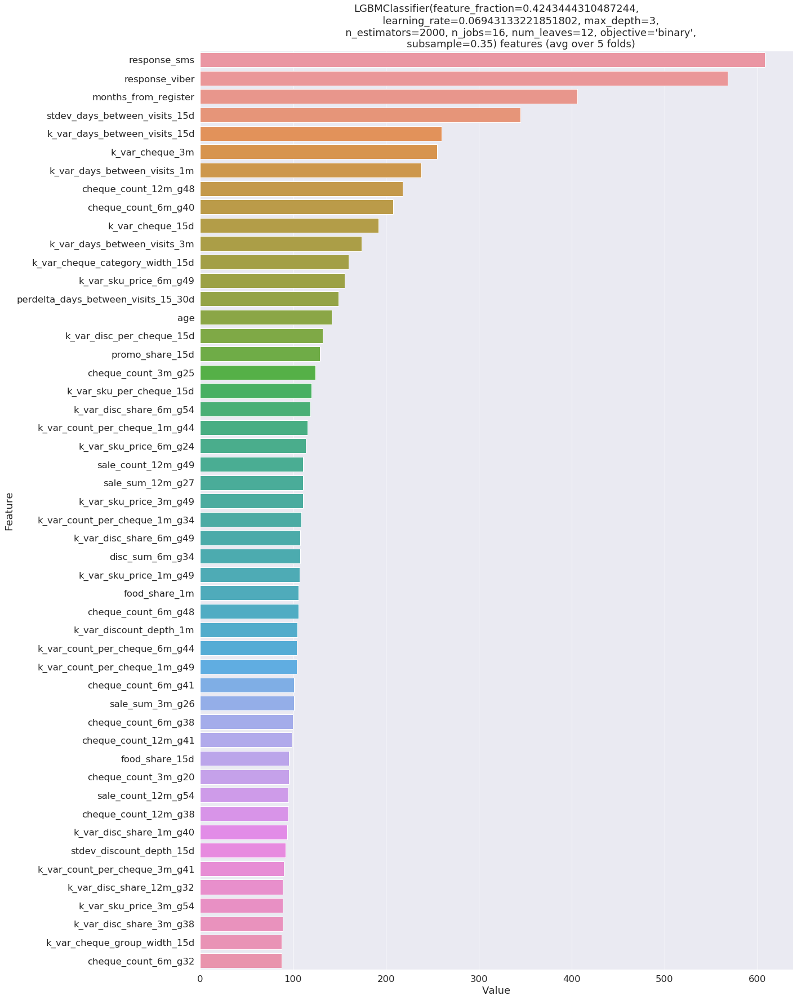

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603483                                            
[100]	valid_0's binary_logloss: 0.600499                                           
[150]	valid_0's binary_logloss: 0.599239                                           
[200]	valid_0's binary_logloss: 0.598589                                           
[250]	valid_0's binary_logloss: 0.598245                                           
[300]	valid_0's binary_logloss: 0.59815                                            
[350]	valid_0's binary_logloss: 0.598047                                           
[400]	valid_0's binary_logloss: 0.598022                                           
[450]	valid_0's binary_logloss: 0.598013                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603307                                            
[100]	valid_0's binary_logloss: 0.600303                                           
[150]	valid_0's binary_logloss: 0.599161                                           
[200]	valid_0's binary_logloss: 0.598561                                           
[250]	valid_0's binary_logloss: 0.598329                                           
[300]	valid_0's binary_logloss: 0.598226                                           
[350]	valid_0's binary_logloss: 0.598166                                           
[400]	valid_0's binary_logloss: 0.598184                                           
Early stopping, best iteration is:                                                 
[359]	valid_0's binary_logloss: 0.598165
6.231363329788866                                                                  
(549623,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603395                                            
[100]	valid_0's binary_logloss: 0.600336                                           
[150]	valid_0's binary_logloss: 0.599166                                           
[200]	valid_0's binary_logloss: 0.598556                                           
[250]	valid_0's binary_logloss: 0.598271                                           
[300]	valid_0's binary_logloss: 0.598229                                           
[350]	valid_0's binary_logloss: 0.598149                                           
[400]	valid_0's binary_logloss: 0.598111                                           
[450]	valid_0's binary_logloss: 0.598102                                           
[500]	valid_0's binary_logloss: 0.598114                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603239                                            
[100]	valid_0's binary_logloss: 0.600167                                           
[150]	valid_0's binary_logloss: 0.598936                                           
[200]	valid_0's binary_logloss: 0.598337                                           
[250]	valid_0's binary_logloss: 0.598071                                           
[300]	valid_0's binary_logloss: 0.598022                                           
[350]	valid_0's binary_logloss: 0.597922                                           
[400]	valid_0's binary_logloss: 0.597849                                           
[450]	valid_0's binary_logloss: 0.597804                                           
[500]	valid_0's binary_logloss: 0.597811                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603505                                            
[100]	valid_0's binary_logloss: 0.600469                                           
[150]	valid_0's binary_logloss: 0.599243                                           
[200]	valid_0's binary_logloss: 0.598626                                           
[250]	valid_0's binary_logloss: 0.598342                                           
[300]	valid_0's binary_logloss: 0.598259                                           
[350]	valid_0's binary_logloss: 0.598198                                           
[400]	valid_0's binary_logloss: 0.598116                                           
[450]	valid_0's binary_logloss: 0.598101                                           
[500]	valid_0's binary_logloss: 0.598108                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980314903826474, cross uplift - 6.27967312709663,all_uplift_score - 6.280289032000478, all logloss - 0.598031490295324
 70%|███████   | 35/50 [1:54:45<22:21, 89.40s/trial, best loss: -6.376644336453608]

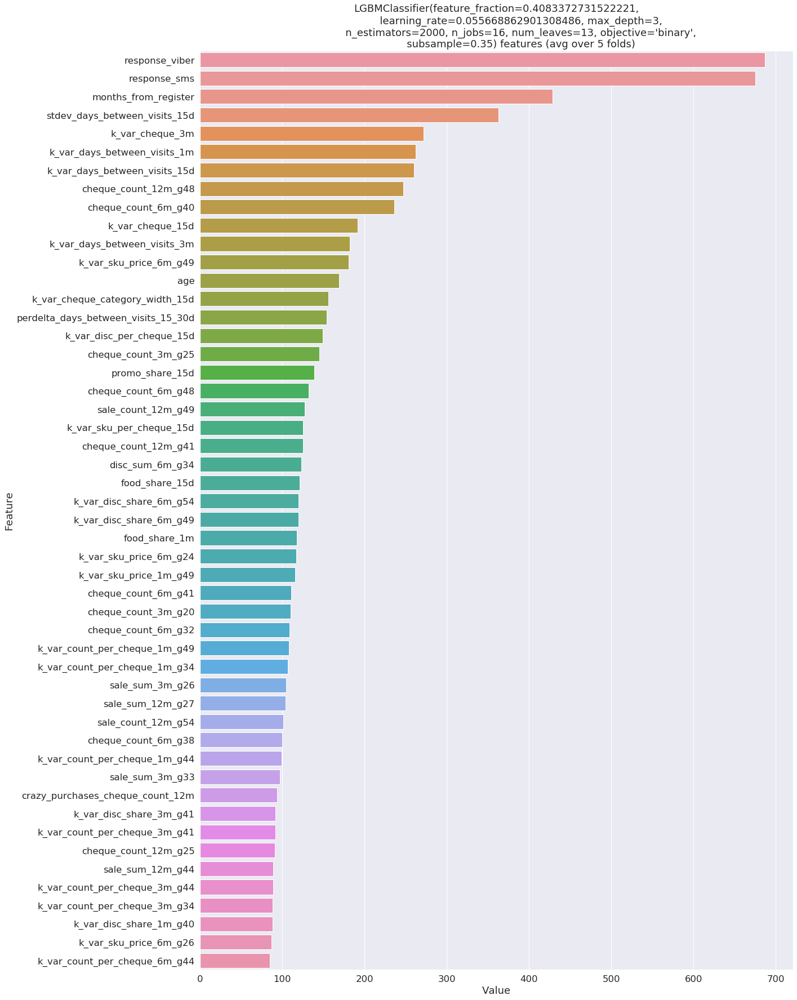

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.600776                                            
[100]	valid_0's binary_logloss: 0.598605                                           
[150]	valid_0's binary_logloss: 0.598284                                           
[200]	valid_0's binary_logloss: 0.598122                                           
[250]	valid_0's binary_logloss: 0.598055                                           
[300]	valid_0's binary_logloss: 0.598055                                           
[350]	valid_0's binary_logloss: 0.598058                                           
Early stopping, best iteration is:                                                 
[341]	valid_0's binary_logloss: 0.598045
6.167849121826519                                                                  
(549623,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.600742                                            
[100]	valid_0's binary_logloss: 0.598647                                           
[150]	valid_0's binary_logloss: 0.598401                                           
[200]	valid_0's binary_logloss: 0.598327                                           
[250]	valid_0's binary_logloss: 0.598213                                           
[300]	valid_0's binary_logloss: 0.598195                                           
Early stopping, best iteration is:                                                 
[274]	valid_0's binary_logloss: 0.598175
6.41044518215396                                                                   
(549623,)                                                                          
 72%|███████▏  | 36/50 [1:55:12<19:23, 83.10s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.600607                                            
[100]	valid_0's binary_logloss: 0.598566                                           
[150]	valid_0's binary_logloss: 0.5982                                             
[200]	valid_0's binary_logloss: 0.59815                                            
[250]	valid_0's binary_logloss: 0.598136                                           
[300]	valid_0's binary_logloss: 0.598125                                           
[350]	valid_0's binary_logloss: 0.598122                                           
Early stopping, best iteration is:                                                 
[310]	valid_0's binary_logloss: 0.598115
5.947865379944248                                                                  
(549623,)                                                                          
 72%|███████▏  | 36/50 [1:55:24<19:

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.600398                                            
[100]	valid_0's binary_logloss: 0.598299                                           
[150]	valid_0's binary_logloss: 0.598039                                           
[200]	valid_0's binary_logloss: 0.597889                                           
[250]	valid_0's binary_logloss: 0.597767                                           
[300]	valid_0's binary_logloss: 0.597735                                           
[350]	valid_0's binary_logloss: 0.597709                                           
Early stopping, best iteration is:                                                 
[347]	valid_0's binary_logloss: 0.597705
6.076775849682036                                                                  
(549624,)                                                                          
 72%|███████▏  | 36/50 [1:55:36<19:

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.600687                                            
[100]	valid_0's binary_logloss: 0.59859                                            
[150]	valid_0's binary_logloss: 0.598249                                           
[200]	valid_0's binary_logloss: 0.598157                                           
[250]	valid_0's binary_logloss: 0.598118                                           
[300]	valid_0's binary_logloss: 0.598089                                           
[350]	valid_0's binary_logloss: 0.598091                                           
Early stopping, best iteration is:                                                 
[304]	valid_0's binary_logloss: 0.598087
6.791110540813536                                                                  
 72%|███████▏  | 36/50 [1:55:48<19:23, 83.10s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980254636350365, cross uplift - 6.278809214884059,all_uplift_score - 6.283271578736044, all logloss - 0.5980254635449295
 72%|███████▏  | 36/50 [1:55:48<19:23, 83.10s/trial, best loss: -6.376644336453608]

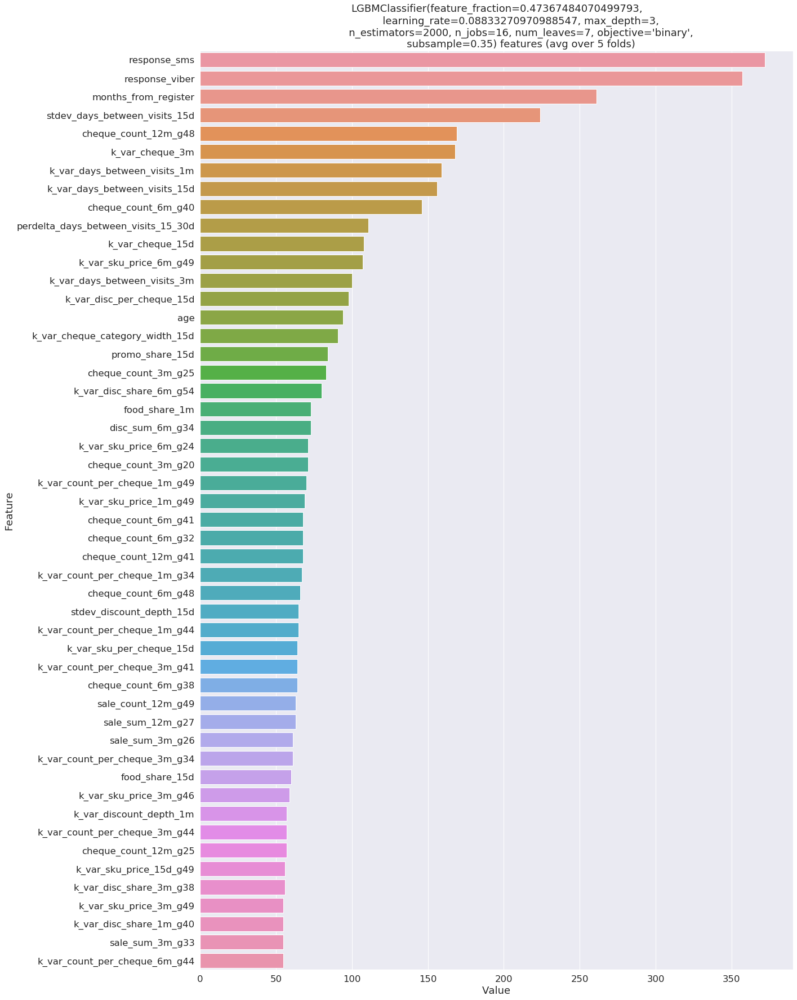

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603531                                            
[100]	valid_0's binary_logloss: 0.600379                                           
[150]	valid_0's binary_logloss: 0.599318                                           
[200]	valid_0's binary_logloss: 0.598824                                           
[250]	valid_0's binary_logloss: 0.598614                                           
[300]	valid_0's binary_logloss: 0.598567                                           
[350]	valid_0's binary_logloss: 0.598474                                           
[400]	valid_0's binary_logloss: 0.598442                                           
[450]	valid_0's binary_logloss: 0.598391                                           
[500]	valid_0's binary_logloss: 0.598341                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603487                                            
[100]	valid_0's binary_logloss: 0.600302                                           
[150]	valid_0's binary_logloss: 0.599358                                           
[200]	valid_0's binary_logloss: 0.59888                                            
[250]	valid_0's binary_logloss: 0.598714                                           
[300]	valid_0's binary_logloss: 0.598631                                           
[350]	valid_0's binary_logloss: 0.598562                                           
[400]	valid_0's binary_logloss: 0.598509                                           
[450]	valid_0's binary_logloss: 0.598452                                           
[500]	valid_0's binary_logloss: 0.598446                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603465                                            
[100]	valid_0's binary_logloss: 0.600196                                           
[150]	valid_0's binary_logloss: 0.599236                                           
[200]	valid_0's binary_logloss: 0.598794                                           
[250]	valid_0's binary_logloss: 0.598636                                           
[300]	valid_0's binary_logloss: 0.598563                                           
[350]	valid_0's binary_logloss: 0.598471                                           
[400]	valid_0's binary_logloss: 0.598453                                           
[450]	valid_0's binary_logloss: 0.598427                                           
[500]	valid_0's binary_logloss: 0.598414                                           
[550]	valid_0's binary_logloss: 0.598395                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603348                                            
[100]	valid_0's binary_logloss: 0.600062                                           
[150]	valid_0's binary_logloss: 0.599063                                           
[200]	valid_0's binary_logloss: 0.598646                                           
[250]	valid_0's binary_logloss: 0.598432                                           
[300]	valid_0's binary_logloss: 0.598372                                           
[350]	valid_0's binary_logloss: 0.598263                                           
[400]	valid_0's binary_logloss: 0.598207                                           
[450]	valid_0's binary_logloss: 0.598171                                           
[500]	valid_0's binary_logloss: 0.598134                                           
[550]	valid_0's binary_logloss: 0.598085                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603559                                            
[100]	valid_0's binary_logloss: 0.600364                                           
[150]	valid_0's binary_logloss: 0.599345                                           
[200]	valid_0's binary_logloss: 0.598895                                           
[250]	valid_0's binary_logloss: 0.598704                                           
[300]	valid_0's binary_logloss: 0.59862                                            
[350]	valid_0's binary_logloss: 0.598547                                           
[400]	valid_0's binary_logloss: 0.598506                                           
[450]	valid_0's binary_logloss: 0.598468                                           
[500]	valid_0's binary_logloss: 0.598392                                           
[550]	valid_0's binary_logloss: 0.598363                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5982110579898744, cross uplift - 6.322172837032564,all_uplift_score - 6.333457113151461, all logloss - 0.5982110579091493
 74%|███████▍  | 37/50 [1:57:28<16:41, 77.01s/trial, best loss: -6.376644336453608]

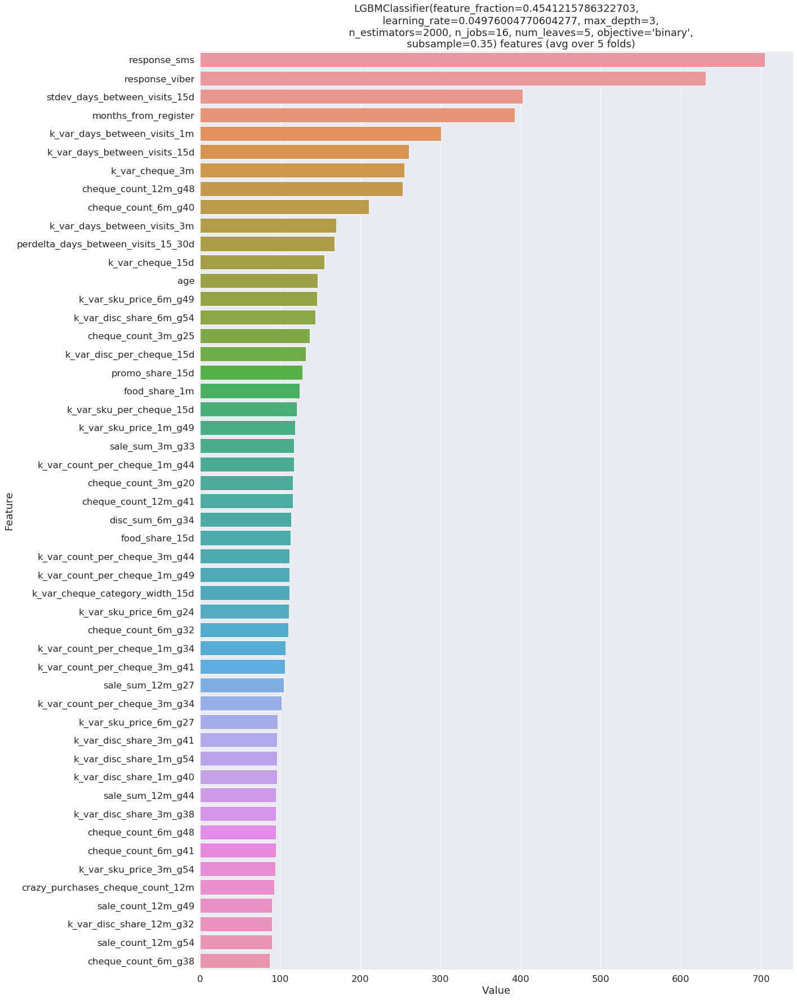

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603483                                            
[100]	valid_0's binary_logloss: 0.600122                                           
[150]	valid_0's binary_logloss: 0.599114                                           
[200]	valid_0's binary_logloss: 0.598568                                           
[250]	valid_0's binary_logloss: 0.598193                                           
[300]	valid_0's binary_logloss: 0.598117                                           
[350]	valid_0's binary_logloss: 0.598077                                           
[400]	valid_0's binary_logloss: 0.598045                                           
[450]	valid_0's binary_logloss: 0.597988                                           
[500]	valid_0's binary_logloss: 0.597976                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603397                                            
[100]	valid_0's binary_logloss: 0.600061                                           
[150]	valid_0's binary_logloss: 0.59907                                            
[200]	valid_0's binary_logloss: 0.598579                                           
[250]	valid_0's binary_logloss: 0.598365                                           
[300]	valid_0's binary_logloss: 0.598304                                           
[350]	valid_0's binary_logloss: 0.598201                                           
[400]	valid_0's binary_logloss: 0.598176                                           
[450]	valid_0's binary_logloss: 0.598161                                           
[500]	valid_0's binary_logloss: 0.598147                                           
[550]	valid_0's binary_logloss: 0.598146                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603443                                            
[100]	valid_0's binary_logloss: 0.600006                                           
[150]	valid_0's binary_logloss: 0.599022                                           
[200]	valid_0's binary_logloss: 0.598564                                           
[250]	valid_0's binary_logloss: 0.598236                                           
[300]	valid_0's binary_logloss: 0.598173                                           
[350]	valid_0's binary_logloss: 0.59813                                            
[400]	valid_0's binary_logloss: 0.598062                                           
[450]	valid_0's binary_logloss: 0.598032                                           
[500]	valid_0's binary_logloss: 0.598026                                           
[550]	valid_0's binary_logloss: 0.598026                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603252                                            
[100]	valid_0's binary_logloss: 0.599794                                           
[150]	valid_0's binary_logloss: 0.598778                                           
[200]	valid_0's binary_logloss: 0.598306                                           
[250]	valid_0's binary_logloss: 0.598023                                           
[300]	valid_0's binary_logloss: 0.597923                                           
[350]	valid_0's binary_logloss: 0.59787                                            
[400]	valid_0's binary_logloss: 0.597842                                           
[450]	valid_0's binary_logloss: 0.597808                                           
[500]	valid_0's binary_logloss: 0.597791                                           
[550]	valid_0's binary_logloss: 0.597779                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603493                                            
[100]	valid_0's binary_logloss: 0.600079                                           
[150]	valid_0's binary_logloss: 0.599112                                           
[200]	valid_0's binary_logloss: 0.598616                                           
[250]	valid_0's binary_logloss: 0.598306                                           
[300]	valid_0's binary_logloss: 0.598237                                           
[350]	valid_0's binary_logloss: 0.598168                                           
[400]	valid_0's binary_logloss: 0.598122                                           
[450]	valid_0's binary_logloss: 0.59808                                            
[500]	valid_0's binary_logloss: 0.598024                                           
[550]	valid_0's binary_logloss: 0.598013                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.597941296253866, cross uplift - 6.3038923868317,all_uplift_score - 6.304908387673766, all logloss - 0.5979412962273624
 76%|███████▌  | 38/50 [1:59:03<16:47, 83.93s/trial, best loss: -6.376644336453608]

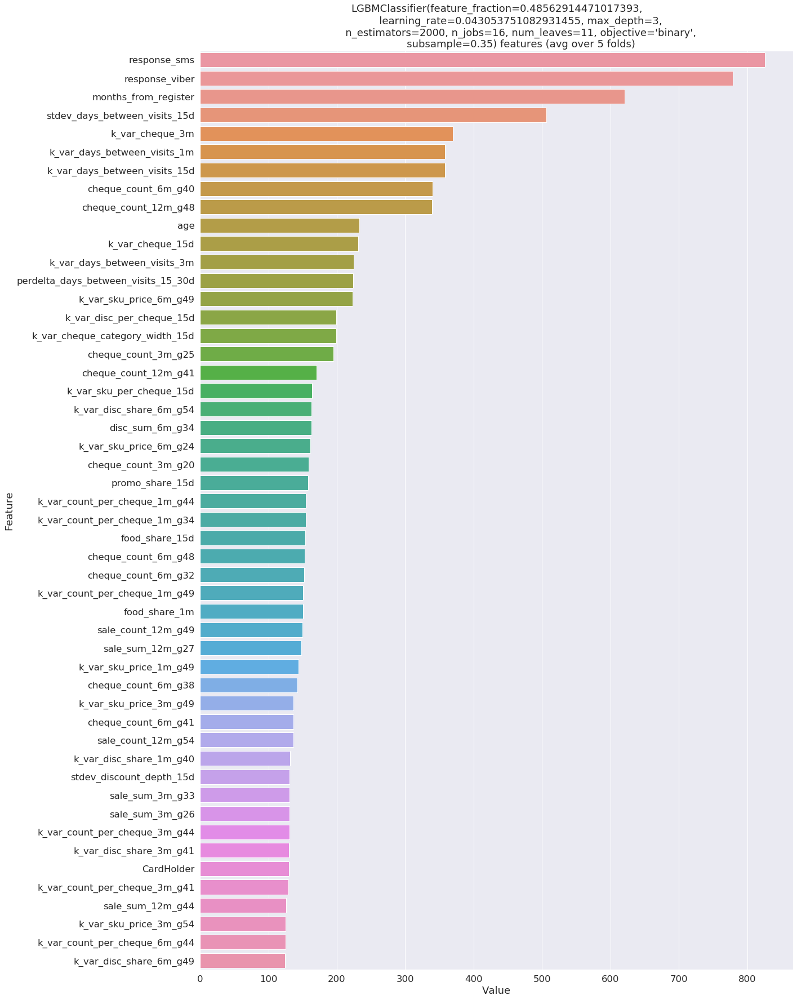

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602419                                            
[100]	valid_0's binary_logloss: 0.599458                                           
[150]	valid_0's binary_logloss: 0.598583                                           
[200]	valid_0's binary_logloss: 0.59829                                            
[250]	valid_0's binary_logloss: 0.598127                                           
[300]	valid_0's binary_logloss: 0.598086                                           
[350]	valid_0's binary_logloss: 0.598001                                           
[400]	valid_0's binary_logloss: 0.598005                                           
[450]	valid_0's binary_logloss: 0.59797                                            
[500]	valid_0's binary_logloss: 0.597941                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602213                                            
[100]	valid_0's binary_logloss: 0.599392                                           
[150]	valid_0's binary_logloss: 0.598628                                           
[200]	valid_0's binary_logloss: 0.598367                                           
[250]	valid_0's binary_logloss: 0.598258                                           
[300]	valid_0's binary_logloss: 0.59822                                            
[350]	valid_0's binary_logloss: 0.59825                                            
Early stopping, best iteration is:                                                 
[311]	valid_0's binary_logloss: 0.598214
6.245794417941094                                                                  
(549623,)                                                                          
 78%|███████▊  | 39/50 [1:59:35<16:

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602331                                            
[100]	valid_0's binary_logloss: 0.599367                                           
[150]	valid_0's binary_logloss: 0.598544                                           
[200]	valid_0's binary_logloss: 0.598294                                           
[250]	valid_0's binary_logloss: 0.598212                                           
[300]	valid_0's binary_logloss: 0.598187                                           
[350]	valid_0's binary_logloss: 0.598169                                           
[400]	valid_0's binary_logloss: 0.598069                                           
[450]	valid_0's binary_logloss: 0.598079                                           
Early stopping, best iteration is:                                                 
[414]	valid_0's binary_logloss: 0.598058
6.021562710341                     

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60213                                             
[100]	valid_0's binary_logloss: 0.599127                                           
[150]	valid_0's binary_logloss: 0.598292                                           
[200]	valid_0's binary_logloss: 0.598007                                           
[250]	valid_0's binary_logloss: 0.59788                                            
[300]	valid_0's binary_logloss: 0.597829                                           
[350]	valid_0's binary_logloss: 0.597779                                           
[400]	valid_0's binary_logloss: 0.597778                                           
[450]	valid_0's binary_logloss: 0.597749                                           
[500]	valid_0's binary_logloss: 0.597762                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602417                                            
[100]	valid_0's binary_logloss: 0.599424                                           
[150]	valid_0's binary_logloss: 0.598607                                           
[200]	valid_0's binary_logloss: 0.598311                                           
[250]	valid_0's binary_logloss: 0.598207                                           
[300]	valid_0's binary_logloss: 0.598141                                           
Early stopping, best iteration is:                                                 
[290]	valid_0's binary_logloss: 0.598127
6.750128943885706                                                                  
 78%|███████▊  | 39/50 [2:00:15<16:01, 87.40s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980167349253691, cross uplift - 6.297971822246742,all_uplift_score - 6.286352980571635, all logloss - 0.5980167347642085
 78%|███████▊  | 39/50 [2:00:16<16:01, 87.40s/trial, best loss: -6.376644336453608]

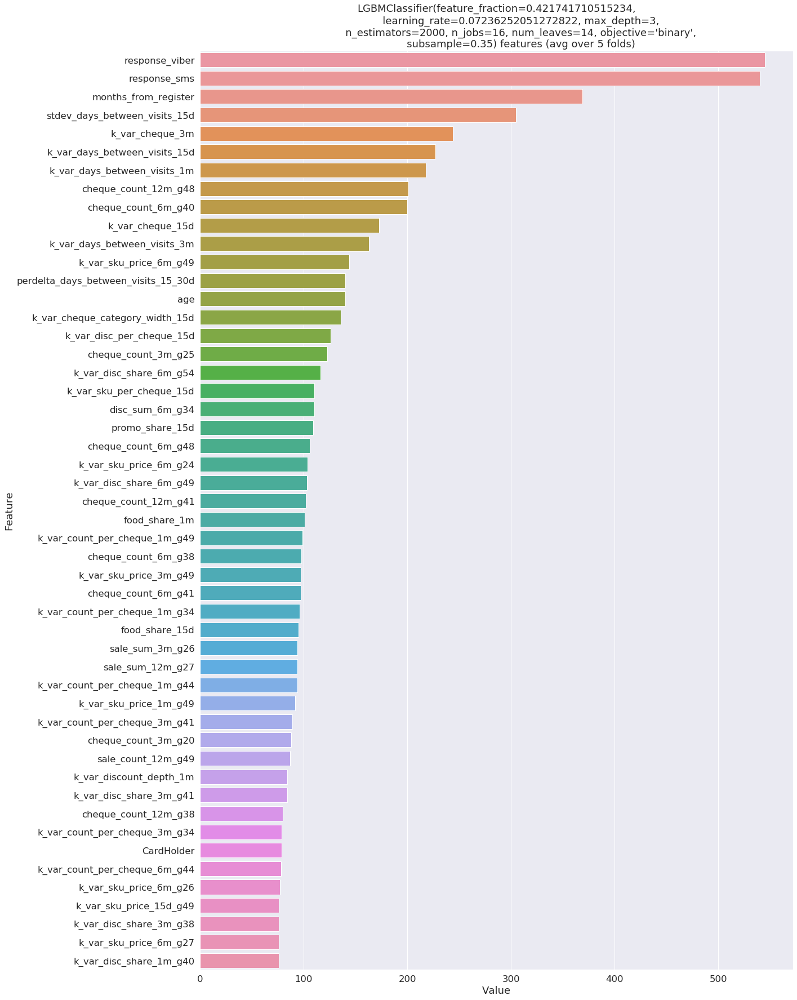

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602865                                            
[100]	valid_0's binary_logloss: 0.599465                                           
[150]	valid_0's binary_logloss: 0.598441                                           
[200]	valid_0's binary_logloss: 0.598063                                           
[250]	valid_0's binary_logloss: 0.597988                                           
[300]	valid_0's binary_logloss: 0.597885                                           
[350]	valid_0's binary_logloss: 0.59785                                            
[400]	valid_0's binary_logloss: 0.597781                                           
[450]	valid_0's binary_logloss: 0.597728                                           
[500]	valid_0's binary_logloss: 0.597713                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602726                                            
[100]	valid_0's binary_logloss: 0.599306                                           
[150]	valid_0's binary_logloss: 0.598435                                           
[200]	valid_0's binary_logloss: 0.59812                                            
[250]	valid_0's binary_logloss: 0.598063                                           
[300]	valid_0's binary_logloss: 0.597985                                           
[350]	valid_0's binary_logloss: 0.597919                                           
[400]	valid_0's binary_logloss: 0.597905                                           
Early stopping, best iteration is:                                                 
[367]	valid_0's binary_logloss: 0.597894
6.249504162819555                                                                  
(549623,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602868                                            
[100]	valid_0's binary_logloss: 0.599458                                           
[150]	valid_0's binary_logloss: 0.598493                                           
[200]	valid_0's binary_logloss: 0.598139                                           
[250]	valid_0's binary_logloss: 0.597989                                           
[300]	valid_0's binary_logloss: 0.597965                                           
[350]	valid_0's binary_logloss: 0.597846                                           
[400]	valid_0's binary_logloss: 0.597854                                           
[450]	valid_0's binary_logloss: 0.597817                                           
[500]	valid_0's binary_logloss: 0.597826                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602677                                            
[100]	valid_0's binary_logloss: 0.599119                                           
[150]	valid_0's binary_logloss: 0.598164                                           
[200]	valid_0's binary_logloss: 0.597868                                           
[250]	valid_0's binary_logloss: 0.597701                                           
[300]	valid_0's binary_logloss: 0.597636                                           
[350]	valid_0's binary_logloss: 0.597569                                           
[400]	valid_0's binary_logloss: 0.597539                                           
[450]	valid_0's binary_logloss: 0.597448                                           
[500]	valid_0's binary_logloss: 0.597418                                           
[550]	valid_0's binary_logloss: 0.597401                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602907                                            
[100]	valid_0's binary_logloss: 0.599528                                           
[150]	valid_0's binary_logloss: 0.598561                                           
[200]	valid_0's binary_logloss: 0.598169                                           
[250]	valid_0's binary_logloss: 0.598084                                           
[300]	valid_0's binary_logloss: 0.59798                                            
[350]	valid_0's binary_logloss: 0.597885                                           
[400]	valid_0's binary_logloss: 0.597867                                           
[450]	valid_0's binary_logloss: 0.59785                                            
[500]	valid_0's binary_logloss: 0.597815                                           
[550]	valid_0's binary_logloss: 0.597813                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5977016326067777, cross uplift - 6.239517441765598,all_uplift_score - 6.244212056402892, all logloss - 0.5977016325016442
 80%|████████  | 40/50 [2:01:33<13:47, 82.80s/trial, best loss: -6.376644336453608]

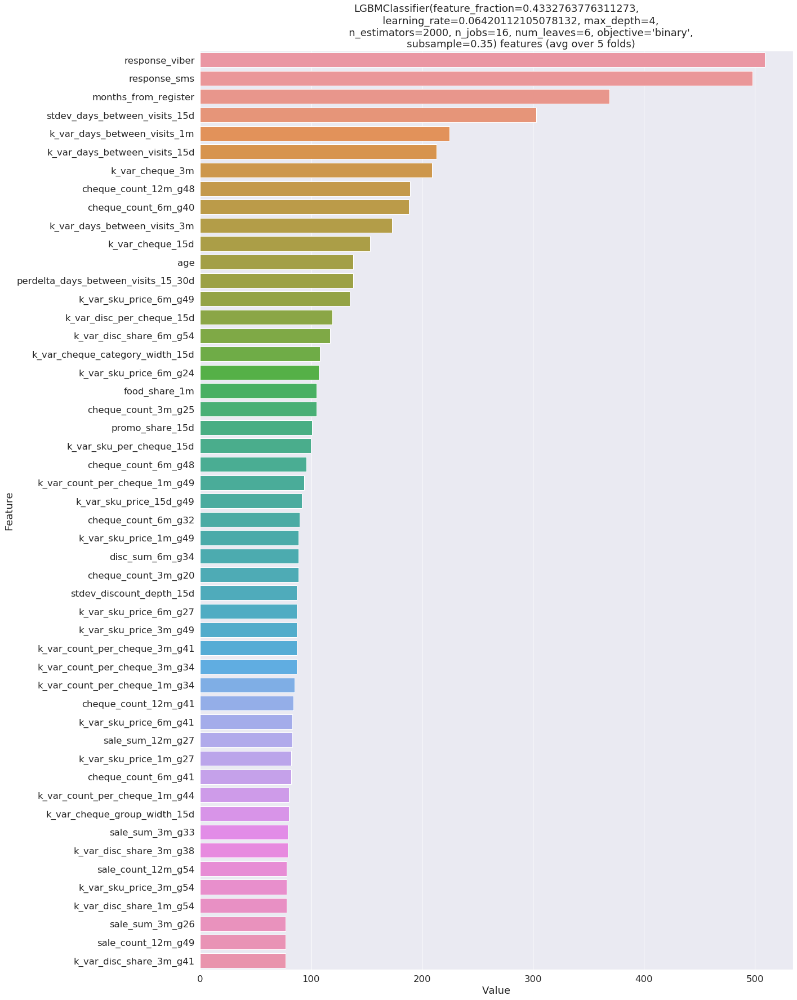

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602173                                            
[100]	valid_0's binary_logloss: 0.599839                                           
[150]	valid_0's binary_logloss: 0.599133                                           
[200]	valid_0's binary_logloss: 0.598826                                           
[250]	valid_0's binary_logloss: 0.59877                                            
[300]	valid_0's binary_logloss: 0.598632                                           
[350]	valid_0's binary_logloss: 0.598554                                           
[400]	valid_0's binary_logloss: 0.598528                                           
[450]	valid_0's binary_logloss: 0.598438                                           
[500]	valid_0's binary_logloss: 0.59842                                     

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602169                                            
[100]	valid_0's binary_logloss: 0.599801                                           
[150]	valid_0's binary_logloss: 0.599044                                           
[200]	valid_0's binary_logloss: 0.59893                                            
[250]	valid_0's binary_logloss: 0.598851                                           
[300]	valid_0's binary_logloss: 0.598832                                           
[350]	valid_0's binary_logloss: 0.598822                                           
[400]	valid_0's binary_logloss: 0.598724                                           
[450]	valid_0's binary_logloss: 0.59867                                            
[500]	valid_0's binary_logloss: 0.598663                                           
[550]	valid_0's binary_logloss: 0.598625                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602096                                            
[100]	valid_0's binary_logloss: 0.599725                                           
[150]	valid_0's binary_logloss: 0.599004                                           
[200]	valid_0's binary_logloss: 0.598899                                           
[250]	valid_0's binary_logloss: 0.598679                                           
[300]	valid_0's binary_logloss: 0.598682                                           
Early stopping, best iteration is:                                                 
[253]	valid_0's binary_logloss: 0.598666
5.864814330802773                                                                  
(549623,)                                                                          
 82%|████████▏ | 41/50 [2:02:23<12:24, 82.74s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602059                                            
[100]	valid_0's binary_logloss: 0.599644                                           
[150]	valid_0's binary_logloss: 0.598996                                           
[200]	valid_0's binary_logloss: 0.598827                                           
[250]	valid_0's binary_logloss: 0.598732                                           
[300]	valid_0's binary_logloss: 0.598631                                           
[350]	valid_0's binary_logloss: 0.598583                                           
[400]	valid_0's binary_logloss: 0.598562                                           
[450]	valid_0's binary_logloss: 0.598425                                           
[500]	valid_0's binary_logloss: 0.598387                                           
[550]	valid_0's binary_logloss: 0.598389                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60239                                             
[100]	valid_0's binary_logloss: 0.599876                                           
[150]	valid_0's binary_logloss: 0.599193                                           
[200]	valid_0's binary_logloss: 0.598993                                           
[250]	valid_0's binary_logloss: 0.598871                                           
[300]	valid_0's binary_logloss: 0.598827                                           
[350]	valid_0's binary_logloss: 0.598756                                           
[400]	valid_0's binary_logloss: 0.598649                                           
[450]	valid_0's binary_logloss: 0.598634                                           
[500]	valid_0's binary_logloss: 0.598616                                           
[550]	valid_0's binary_logloss: 0.598555                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5984490767061498, cross uplift - 6.27053595807723,all_uplift_score - 6.274255262500778, all logloss - 0.598449076578723
 82%|████████▏ | 41/50 [2:02:52<12:24, 82.74s/trial, best loss: -6.376644336453608]

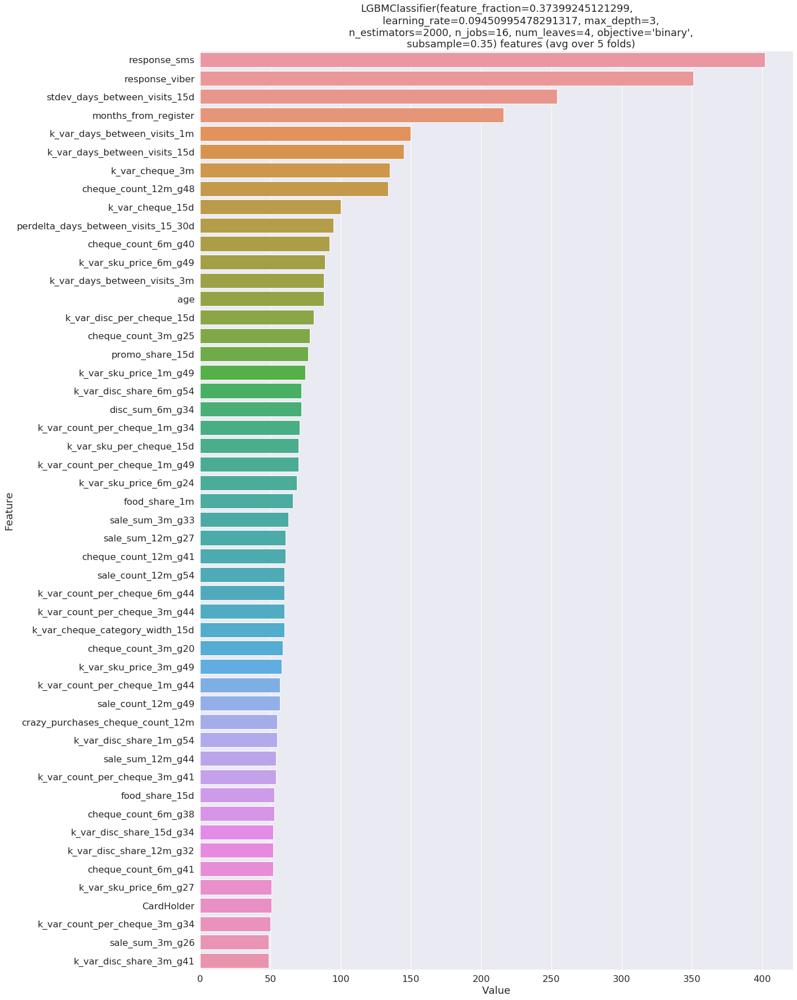

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601796                                            
[100]	valid_0's binary_logloss: 0.598597                                           
[150]	valid_0's binary_logloss: 0.597745                                           
[200]	valid_0's binary_logloss: 0.597428                                           
[250]	valid_0's binary_logloss: 0.597358                                           
[300]	valid_0's binary_logloss: 0.597332                                           
[350]	valid_0's binary_logloss: 0.59732                                            
[400]	valid_0's binary_logloss: 0.597279                                           
[450]	valid_0's binary_logloss: 0.597236                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60174                                             
[100]	valid_0's binary_logloss: 0.598686                                           
[150]	valid_0's binary_logloss: 0.597915                                           
[200]	valid_0's binary_logloss: 0.597665                                           
[250]	valid_0's binary_logloss: 0.597557                                           
[300]	valid_0's binary_logloss: 0.597483                                           
[350]	valid_0's binary_logloss: 0.597469                                           
Early stopping, best iteration is:                                                 
[323]	valid_0's binary_logloss: 0.597445
6.2929739222124335                                                                 
(549623,)                                                                          
 84%|████████▍ | 42/50 [2:03:29<10:

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601801                                            
[100]	valid_0's binary_logloss: 0.598644                                           
[150]	valid_0's binary_logloss: 0.59787                                            
[200]	valid_0's binary_logloss: 0.597571                                           
[250]	valid_0's binary_logloss: 0.597526                                           
Early stopping, best iteration is:                                                 
[232]	valid_0's binary_logloss: 0.597488
5.934344706204456                                                                  
(549623,)                                                                          
 84%|████████▍ | 42/50 [2:03:40<10:52, 81.52s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601557                                            
[100]	valid_0's binary_logloss: 0.598369                                           
[150]	valid_0's binary_logloss: 0.597616                                           
[200]	valid_0's binary_logloss: 0.597324                                           
[250]	valid_0's binary_logloss: 0.597209                                           
[300]	valid_0's binary_logloss: 0.597184                                           
[350]	valid_0's binary_logloss: 0.597195                                           
[400]	valid_0's binary_logloss: 0.597129                                           
[450]	valid_0's binary_logloss: 0.597131                                           
[500]	valid_0's binary_logloss: 0.597138                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60187                                             
[100]	valid_0's binary_logloss: 0.598671                                           
[150]	valid_0's binary_logloss: 0.597878                                           
[200]	valid_0's binary_logloss: 0.597526                                           
[250]	valid_0's binary_logloss: 0.597482                                           
[300]	valid_0's binary_logloss: 0.597451                                           
[350]	valid_0's binary_logloss: 0.597393                                           
[400]	valid_0's binary_logloss: 0.597373                                           
Early stopping, best iteration is:                                                 
[391]	valid_0's binary_logloss: 0.597362
6.873987995236441                                                                  
 84%|████████▍ | 42/50 [2:04:10<10:

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5973305861602014, cross uplift - 6.313877979327175,all_uplift_score - 6.330510127827482, all logloss - 0.5973305861150089
 84%|████████▍ | 42/50 [2:04:11<10:52, 81.52s/trial, best loss: -6.376644336453608]

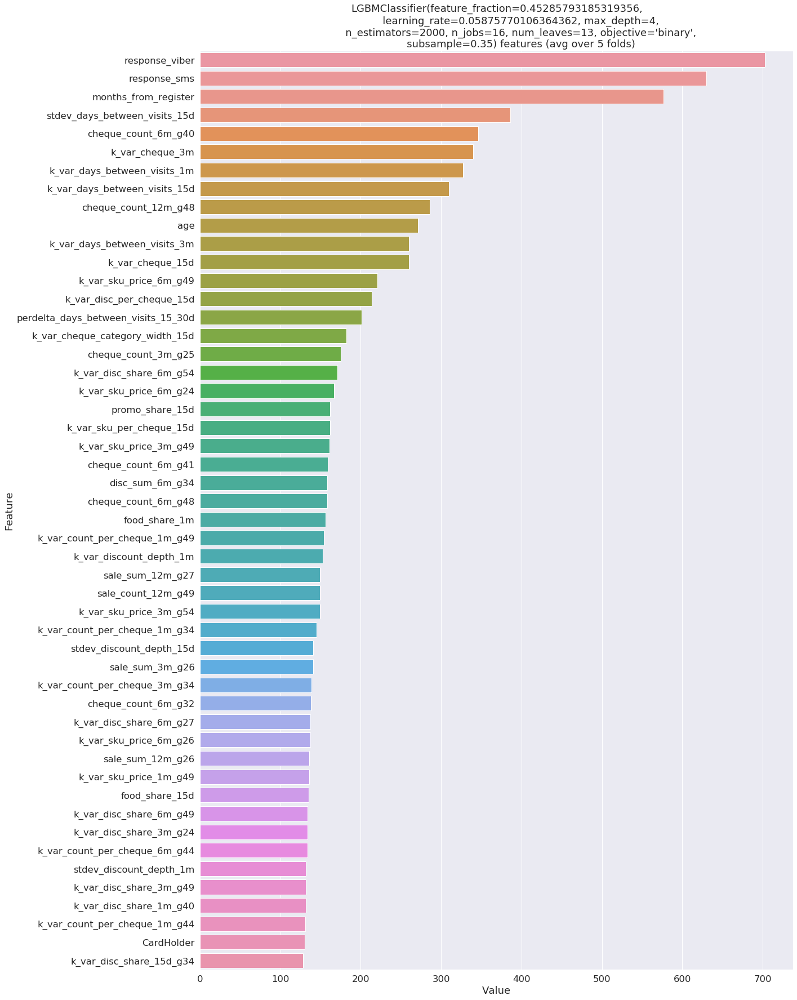

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602001                                            
[100]	valid_0's binary_logloss: 0.599094                                           
[150]	valid_0's binary_logloss: 0.598393                                           
[200]	valid_0's binary_logloss: 0.59817                                            
[250]	valid_0's binary_logloss: 0.598142                                           
[300]	valid_0's binary_logloss: 0.59807                                            
Early stopping, best iteration is:                                                 
[299]	valid_0's binary_logloss: 0.598069
6.217328250834997                                                                  
(549623,)                                                                          
 86%|████████▌ | 43/50 [2:04:32<09:

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601904                                            
[100]	valid_0's binary_logloss: 0.599036                                           
[150]	valid_0's binary_logloss: 0.598409                                           
[200]	valid_0's binary_logloss: 0.598336                                           
[250]	valid_0's binary_logloss: 0.598236                                           
[300]	valid_0's binary_logloss: 0.598236                                           
Early stopping, best iteration is:                                                 
[255]	valid_0's binary_logloss: 0.598225
6.235737478734949                                                                  
(549623,)                                                                          
 86%|████████▌ | 43/50 [2:04:42<09:27, 81.07s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601949                                            
[100]	valid_0's binary_logloss: 0.599106                                           
[150]	valid_0's binary_logloss: 0.598458                                           
[200]	valid_0's binary_logloss: 0.598305                                           
[250]	valid_0's binary_logloss: 0.59825                                            
[300]	valid_0's binary_logloss: 0.598221                                           
[350]	valid_0's binary_logloss: 0.59825                                            
[400]	valid_0's binary_logloss: 0.598164                                           
[450]	valid_0's binary_logloss: 0.598186                                           
Early stopping, best iteration is:                                                 
[407]	valid_0's binary_logloss: 0.59816
5.9278523200332                     

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601733                                            
[100]	valid_0's binary_logloss: 0.598819                                           
[150]	valid_0's binary_logloss: 0.598114                                           
[200]	valid_0's binary_logloss: 0.597976                                           
[250]	valid_0's binary_logloss: 0.597871                                           
[300]	valid_0's binary_logloss: 0.597841                                           
[350]	valid_0's binary_logloss: 0.597847                                           
Early stopping, best iteration is:                                                 
[304]	valid_0's binary_logloss: 0.597828
6.228048013171144                                                                  
(549624,)                                                                          
 86%|████████▌ | 43/50 [2:05:05<09:

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602035                                            
[100]	valid_0's binary_logloss: 0.599072                                           
[150]	valid_0's binary_logloss: 0.598402                                           
[200]	valid_0's binary_logloss: 0.598212                                           
[250]	valid_0's binary_logloss: 0.598126                                           
[300]	valid_0's binary_logloss: 0.598118                                           
[350]	valid_0's binary_logloss: 0.598106                                           
Early stopping, best iteration is:                                                 
[340]	valid_0's binary_logloss: 0.598091
6.846781023450335                                                                  
 86%|████████▌ | 43/50 [2:05:17<09:27, 81.07s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.598074566521511, cross uplift - 6.291149417244926,all_uplift_score - 6.268866573164439, all logloss - 0.5980745664970596
 86%|████████▌ | 43/50 [2:05:17<09:27, 81.07s/trial, best loss: -6.376644336453608]

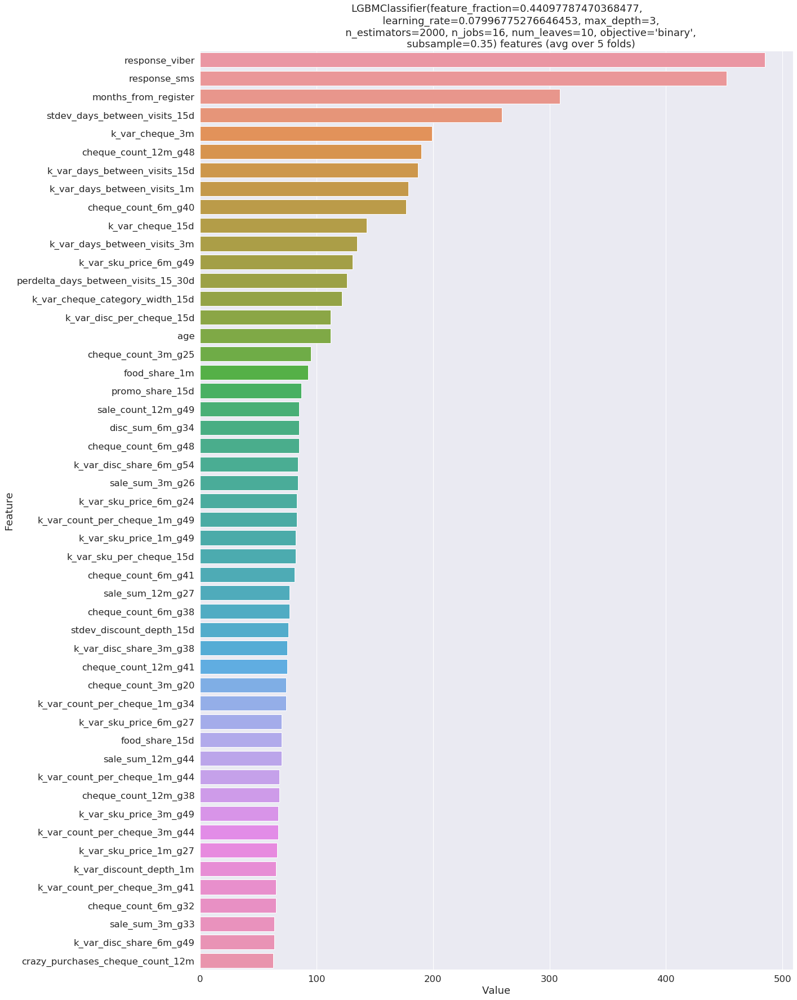

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601654                                            
[100]	valid_0's binary_logloss: 0.598948                                           
[150]	valid_0's binary_logloss: 0.597884                                           
[200]	valid_0's binary_logloss: 0.597729                                           
Early stopping, best iteration is:                                                 
[180]	valid_0's binary_logloss: 0.597704
6.174968289894883                                                                  
(549623,)                                                                          
 88%|████████▊ | 44/50 [2:05:30<07:29, 74.83s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601423                                            
[100]	valid_0's binary_logloss: 0.598836                                           
[150]	valid_0's binary_logloss: 0.598012                                           
[200]	valid_0's binary_logloss: 0.597803                                           
[250]	valid_0's binary_logloss: 0.597669                                           
[300]	valid_0's binary_logloss: 0.597655                                           
[350]	valid_0's binary_logloss: 0.597599                                           
[400]	valid_0's binary_logloss: 0.597628                                           
Early stopping, best iteration is:                                                 
[358]	valid_0's binary_logloss: 0.597592
6.285705308379608                                                                  
(549623,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601584                                            
[100]	valid_0's binary_logloss: 0.598908                                           
[150]	valid_0's binary_logloss: 0.598066                                           
[200]	valid_0's binary_logloss: 0.597832                                           
[250]	valid_0's binary_logloss: 0.59775                                            
[300]	valid_0's binary_logloss: 0.597726                                           
Early stopping, best iteration is:                                                 
[267]	valid_0's binary_logloss: 0.597717
6.129548066084553                                                                  
(549623,)                                                                          
 88%|████████▊ | 44/50 [2:05:53<07:29, 74.83s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601335                                            
[100]	valid_0's binary_logloss: 0.59861                                            
[150]	valid_0's binary_logloss: 0.597753                                           
[200]	valid_0's binary_logloss: 0.597458                                           
[250]	valid_0's binary_logloss: 0.597422                                           
[300]	valid_0's binary_logloss: 0.5974                                             
Early stopping, best iteration is:                                                 
[297]	valid_0's binary_logloss: 0.597394
6.109860656530225                                                                  
(549624,)                                                                          
 88%|████████▊ | 44/50 [2:06:04<07:29, 74.83s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601672                                            
[100]	valid_0's binary_logloss: 0.598881                                           
[150]	valid_0's binary_logloss: 0.597948                                           
[200]	valid_0's binary_logloss: 0.597714                                           
[250]	valid_0's binary_logloss: 0.597591                                           
[300]	valid_0's binary_logloss: 0.597493                                           
[350]	valid_0's binary_logloss: 0.597487                                           
[400]	valid_0's binary_logloss: 0.597489                                           
Early stopping, best iteration is:                                                 
[392]	valid_0's binary_logloss: 0.59747
6.847876033673836                                                                  
 88%|████████▊ | 44/50 [2:06:17<07:2

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5975755181082952, cross uplift - 6.30959167091262,all_uplift_score - 6.326189093874424, all logloss - 0.5975755182613058
 88%|████████▊ | 44/50 [2:06:17<07:29, 74.83s/trial, best loss: -6.376644336453608]

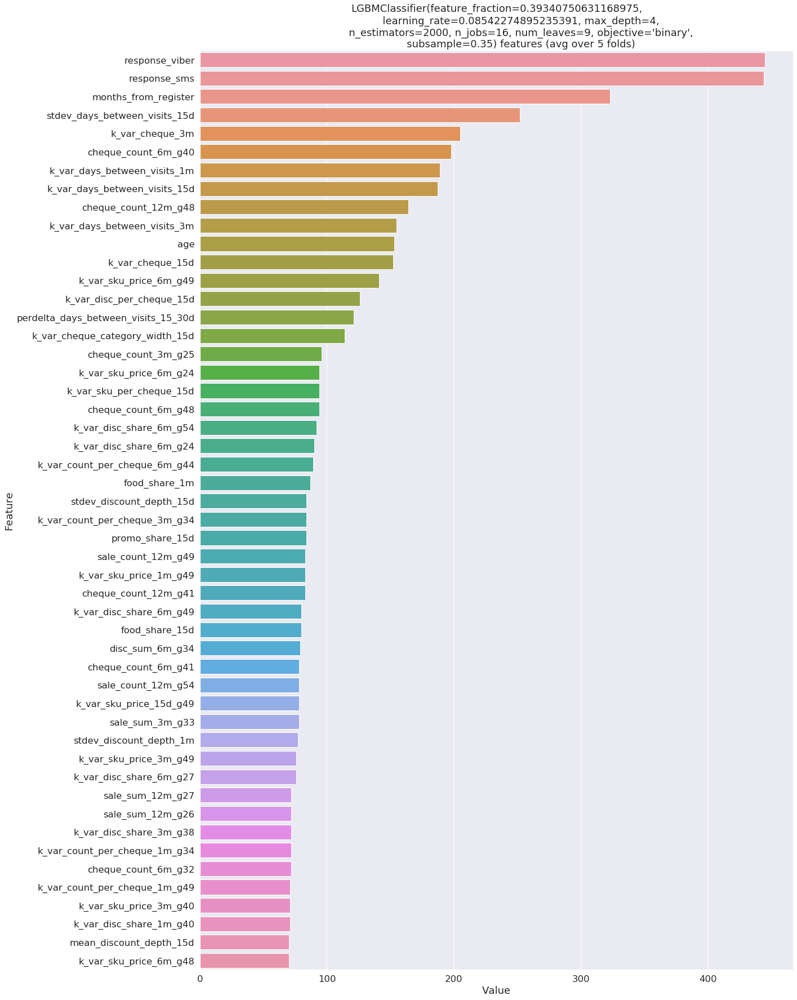

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.607771                                            
[100]	valid_0's binary_logloss: 0.604166                                           
[150]	valid_0's binary_logloss: 0.602364                                           
[200]	valid_0's binary_logloss: 0.60125                                            
[250]	valid_0's binary_logloss: 0.600363                                           
[300]	valid_0's binary_logloss: 0.599871                                           
[350]	valid_0's binary_logloss: 0.599432                                           
[400]	valid_0's binary_logloss: 0.598958                                           
[450]	valid_0's binary_logloss: 0.598627                                           
[500]	valid_0's binary_logloss: 0.598405                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.607669                                            
[100]	valid_0's binary_logloss: 0.604088                                           
[150]	valid_0's binary_logloss: 0.60227                                            
[200]	valid_0's binary_logloss: 0.601146                                           
[250]	valid_0's binary_logloss: 0.600264                                           
[300]	valid_0's binary_logloss: 0.599775                                           
[350]	valid_0's binary_logloss: 0.599382                                           
[400]	valid_0's binary_logloss: 0.598923                                           
[450]	valid_0's binary_logloss: 0.598631                                           
[500]	valid_0's binary_logloss: 0.598426                                           
[550]	valid_0's binary_logloss: 0.598342                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.607762                                            
[100]	valid_0's binary_logloss: 0.604116                                           
[150]	valid_0's binary_logloss: 0.602287                                           
[200]	valid_0's binary_logloss: 0.60114                                            
[250]	valid_0's binary_logloss: 0.600255                                           
[300]	valid_0's binary_logloss: 0.599775                                           
[350]	valid_0's binary_logloss: 0.599373                                           
[400]	valid_0's binary_logloss: 0.598895                                           
[450]	valid_0's binary_logloss: 0.598578                                           
[500]	valid_0's binary_logloss: 0.598369                                           
[550]	valid_0's binary_logloss: 0.598269                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.607638                                            
[100]	valid_0's binary_logloss: 0.603916                                           
[150]	valid_0's binary_logloss: 0.602071                                           
[200]	valid_0's binary_logloss: 0.60095                                            
[250]	valid_0's binary_logloss: 0.600029                                           
[300]	valid_0's binary_logloss: 0.599523                                           
[350]	valid_0's binary_logloss: 0.599114                                           
[400]	valid_0's binary_logloss: 0.598652                                           
[450]	valid_0's binary_logloss: 0.59834                                            
[500]	valid_0's binary_logloss: 0.598149                                           
[550]	valid_0's binary_logloss: 0.598043                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60778                                             
[100]	valid_0's binary_logloss: 0.604149                                           
[150]	valid_0's binary_logloss: 0.602307                                           
[200]	valid_0's binary_logloss: 0.601198                                           
[250]	valid_0's binary_logloss: 0.6003                                             
[300]	valid_0's binary_logloss: 0.5998                                             
[350]	valid_0's binary_logloss: 0.599422                                           
[400]	valid_0's binary_logloss: 0.598965                                           
[450]	valid_0's binary_logloss: 0.598653                                           
[500]	valid_0's binary_logloss: 0.598447                                           
[550]	valid_0's binary_logloss: 0.598342                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5979577099333898, cross uplift - 6.260487454597596,all_uplift_score - 6.250152725423542, all logloss - 0.5979577098651292
 90%|█████████ | 45/50 [2:08:33<05:52, 70.48s/trial, best loss: -6.376644336453608]

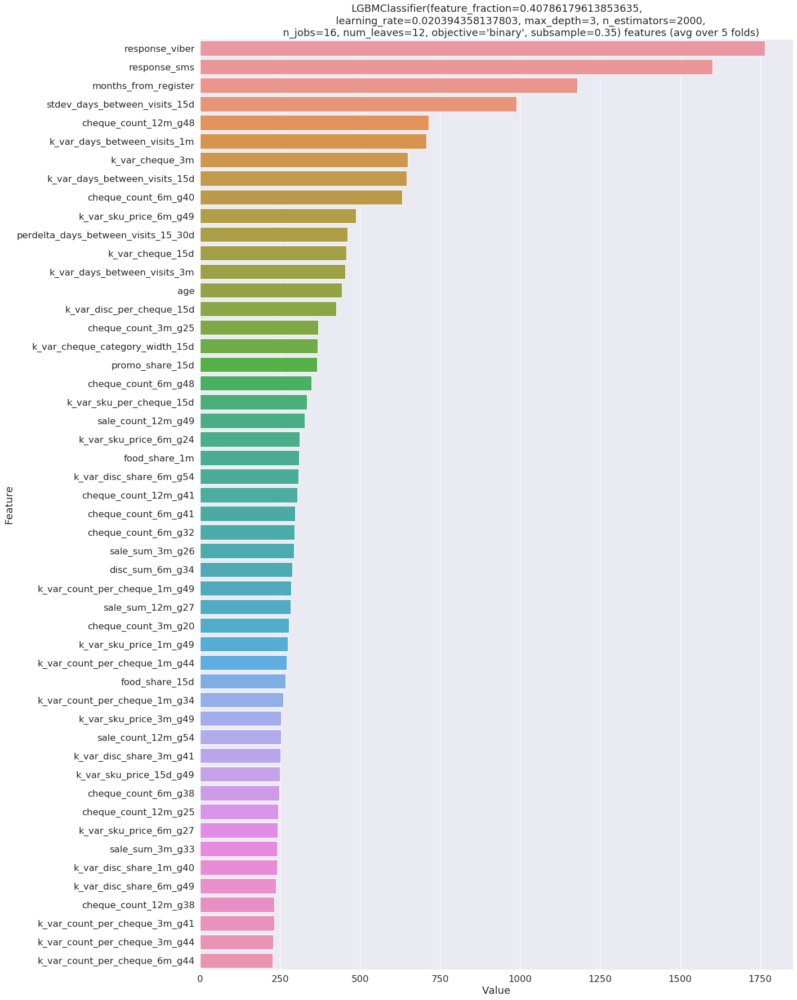

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603332                                            
[100]	valid_0's binary_logloss: 0.600116                                           
[150]	valid_0's binary_logloss: 0.598666                                           
[200]	valid_0's binary_logloss: 0.598229                                           
[250]	valid_0's binary_logloss: 0.59763                                            
[300]	valid_0's binary_logloss: 0.597391                                           
[350]	valid_0's binary_logloss: 0.597339                                           
[400]	valid_0's binary_logloss: 0.597245                                           
Early stopping, best iteration is:                                                 
[391]	valid_0's binary_logloss: 0.597237
6.0919033978556945                 

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603159                                            
[100]	valid_0's binary_logloss: 0.600038                                           
[150]	valid_0's binary_logloss: 0.598632                                           
[200]	valid_0's binary_logloss: 0.598213                                           
[250]	valid_0's binary_logloss: 0.597687                                           
[300]	valid_0's binary_logloss: 0.597491                                           
[350]	valid_0's binary_logloss: 0.597435                                           
[400]	valid_0's binary_logloss: 0.597424                                           
[450]	valid_0's binary_logloss: 0.597425                                           
Early stopping, best iteration is:                                                 
[434]	valid_0's binary_logloss: 0.597413
6.440756112430035                  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603234                                            
[100]	valid_0's binary_logloss: 0.600102                                           
[150]	valid_0's binary_logloss: 0.598664                                           
[200]	valid_0's binary_logloss: 0.598248                                           
[250]	valid_0's binary_logloss: 0.597674                                           
[300]	valid_0's binary_logloss: 0.597453                                           
[350]	valid_0's binary_logloss: 0.597431                                           
[400]	valid_0's binary_logloss: 0.597391                                           
Early stopping, best iteration is:                                                 
[392]	valid_0's binary_logloss: 0.597383
6.066797299792764                                                                  
(549623,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603136                                            
[100]	valid_0's binary_logloss: 0.599817                                           
[150]	valid_0's binary_logloss: 0.598402                                           
[200]	valid_0's binary_logloss: 0.597975                                           
[250]	valid_0's binary_logloss: 0.597427                                           
[300]	valid_0's binary_logloss: 0.597224                                           
[350]	valid_0's binary_logloss: 0.597157                                           
[400]	valid_0's binary_logloss: 0.597152                                           
[450]	valid_0's binary_logloss: 0.597154                                           
Early stopping, best iteration is:                                                 
[415]	valid_0's binary_logloss: 0.597131
6.248433395472294                  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.603349                                            
[100]	valid_0's binary_logloss: 0.600115                                           
[150]	valid_0's binary_logloss: 0.59867                                            
[200]	valid_0's binary_logloss: 0.598266                                           
[250]	valid_0's binary_logloss: 0.597704                                           
[300]	valid_0's binary_logloss: 0.597502                                           
[350]	valid_0's binary_logloss: 0.597478                                           
[400]	valid_0's binary_logloss: 0.597457                                           
[450]	valid_0's binary_logloss: 0.59742                                            
[500]	valid_0's binary_logloss: 0.597449                                           
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5973159608262797, cross uplift - 6.338142113886383,all_uplift_score - 6.3469171461343175, all logloss - 0.597315960681844
 92%|█████████▏| 46/50 [2:09:55<06:06, 91.73s/trial, best loss: -6.376644336453608]

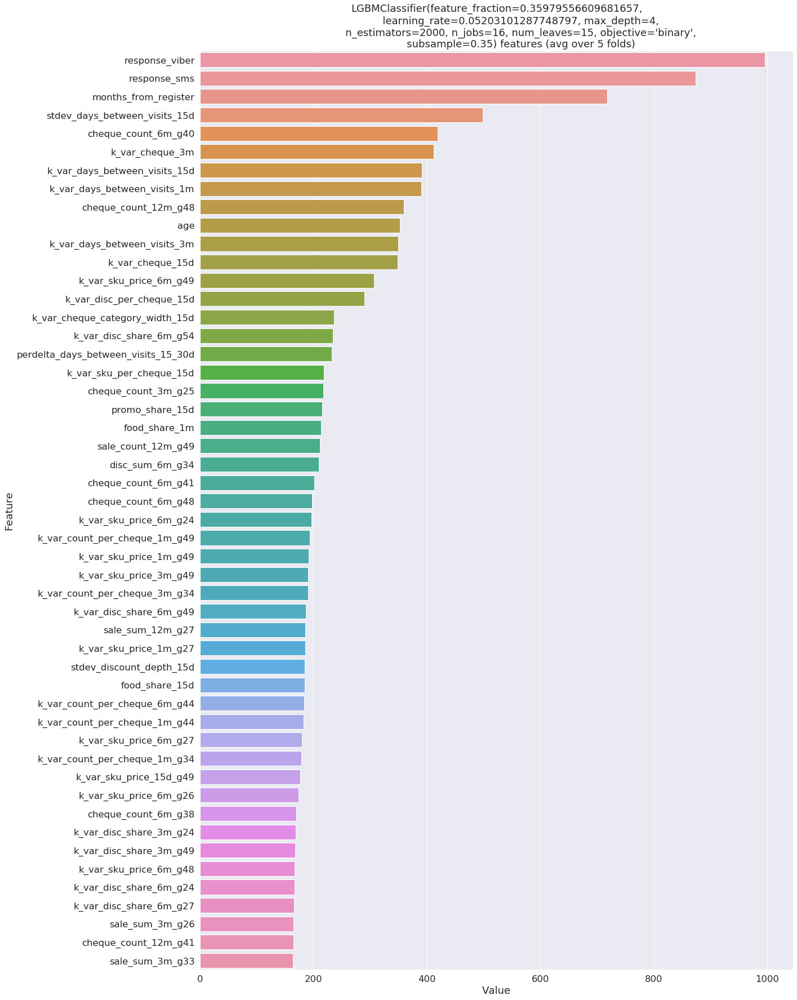

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601614                                            
[100]	valid_0's binary_logloss: 0.598971                                           
[150]	valid_0's binary_logloss: 0.598414                                           
[200]	valid_0's binary_logloss: 0.598254                                           
[250]	valid_0's binary_logloss: 0.598177                                           
[300]	valid_0's binary_logloss: 0.598163                                           
[350]	valid_0's binary_logloss: 0.598131                                           
[400]	valid_0's binary_logloss: 0.598119                                           
[450]	valid_0's binary_logloss: 0.598059                                           
[500]	valid_0's binary_logloss: 0.598083                                    

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601458                                            
[100]	valid_0's binary_logloss: 0.598951                                           
[150]	valid_0's binary_logloss: 0.598351                                           
[200]	valid_0's binary_logloss: 0.598164                                           
[250]	valid_0's binary_logloss: 0.598091                                           
[300]	valid_0's binary_logloss: 0.59808                                            
[350]	valid_0's binary_logloss: 0.598028                                           
Early stopping, best iteration is:                                                 
[342]	valid_0's binary_logloss: 0.598024
6.3805811200168705                                                                 
(549623,)                                                                          
 94%|█████████▍| 47/50 [2:10:24<04:

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601531                                            
[100]	valid_0's binary_logloss: 0.59894                                            
[150]	valid_0's binary_logloss: 0.598354                                           
[200]	valid_0's binary_logloss: 0.598316                                           
[250]	valid_0's binary_logloss: 0.59822                                            
[300]	valid_0's binary_logloss: 0.598222                                           
Early stopping, best iteration is:                                                 
[277]	valid_0's binary_logloss: 0.598193
5.911361580764024                                                                  
(549623,)                                                                          
 94%|█████████▍| 47/50 [2:10:35<04:20, 87.00s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601359                                            
[100]	valid_0's binary_logloss: 0.598703                                           
[150]	valid_0's binary_logloss: 0.598112                                           
[200]	valid_0's binary_logloss: 0.598012                                           
[250]	valid_0's binary_logloss: 0.597949                                           
[300]	valid_0's binary_logloss: 0.597881                                           
[350]	valid_0's binary_logloss: 0.597871                                           
[400]	valid_0's binary_logloss: 0.597866                                           
Early stopping, best iteration is:                                                 
[396]	valid_0's binary_logloss: 0.597858
6.2019443457344146                                                                 
(549624,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601707                                            
[100]	valid_0's binary_logloss: 0.598998                                           
[150]	valid_0's binary_logloss: 0.598374                                           
[200]	valid_0's binary_logloss: 0.598272                                           
[250]	valid_0's binary_logloss: 0.598253                                           
[300]	valid_0's binary_logloss: 0.598247                                           
[350]	valid_0's binary_logloss: 0.598176                                           
[400]	valid_0's binary_logloss: 0.598168                                           
[450]	valid_0's binary_logloss: 0.598121                                           
Early stopping, best iteration is:                                                 
[434]	valid_0's binary_logloss: 0.598108
6.945581693458336                  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980466649549043, cross uplift - 6.331561493681614,all_uplift_score - 6.309971269272152, all logloss - 0.5980466648653116
 94%|█████████▍| 47/50 [2:11:01<04:20, 87.00s/trial, best loss: -6.376644336453608]

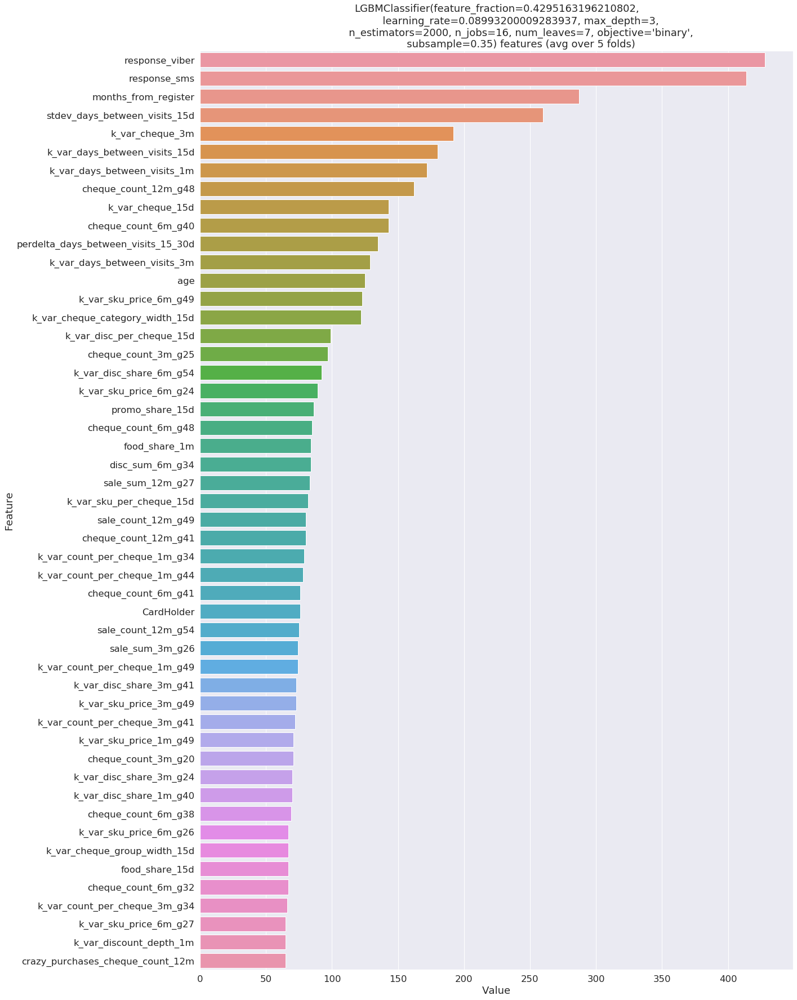

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60237                                             
[100]	valid_0's binary_logloss: 0.599486                                           
[150]	valid_0's binary_logloss: 0.598547                                           
[200]	valid_0's binary_logloss: 0.59821                                            
[250]	valid_0's binary_logloss: 0.598114                                           
[300]	valid_0's binary_logloss: 0.59807                                            
[350]	valid_0's binary_logloss: 0.59799                                            
[400]	valid_0's binary_logloss: 0.597977                                           
Early stopping, best iteration is:                                                 
[364]	valid_0's binary_logloss: 0.59797
6.159967519167303                   

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602148                                            
[100]	valid_0's binary_logloss: 0.599362                                           
[150]	valid_0's binary_logloss: 0.598547                                           
[200]	valid_0's binary_logloss: 0.59831                                            
[250]	valid_0's binary_logloss: 0.598258                                           
[300]	valid_0's binary_logloss: 0.598238                                           
[350]	valid_0's binary_logloss: 0.598193                                           
[400]	valid_0's binary_logloss: 0.598176                                           
Early stopping, best iteration is:                                                 
[392]	valid_0's binary_logloss: 0.598172
6.439038770989525                                                                  
(549623,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602263                                            
[100]	valid_0's binary_logloss: 0.599336                                           
[150]	valid_0's binary_logloss: 0.59853                                            
[200]	valid_0's binary_logloss: 0.598249                                           
[250]	valid_0's binary_logloss: 0.598179                                           
[300]	valid_0's binary_logloss: 0.598174                                           
Early stopping, best iteration is:                                                 
[257]	valid_0's binary_logloss: 0.598165
5.943312192322173                                                                  
(549623,)                                                                          
 96%|█████████▌| 48/50 [2:11:41<02:41, 80.76s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602007                                            
[100]	valid_0's binary_logloss: 0.599071                                           
[150]	valid_0's binary_logloss: 0.598274                                           
[200]	valid_0's binary_logloss: 0.597986                                           
[250]	valid_0's binary_logloss: 0.597895                                           
[300]	valid_0's binary_logloss: 0.597866                                           
[350]	valid_0's binary_logloss: 0.597788                                           
[400]	valid_0's binary_logloss: 0.597771                                           
Early stopping, best iteration is:                                                 
[392]	valid_0's binary_logloss: 0.597766
6.1218353776896715                                                                 
(549624,)                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.602357                                            
[100]	valid_0's binary_logloss: 0.599393                                           
[150]	valid_0's binary_logloss: 0.598561                                           
[200]	valid_0's binary_logloss: 0.598259                                           
[250]	valid_0's binary_logloss: 0.59814                                            
[300]	valid_0's binary_logloss: 0.598113                                           
[350]	valid_0's binary_logloss: 0.598085                                           
[400]	valid_0's binary_logloss: 0.598043                                           
[450]	valid_0's binary_logloss: 0.598047                                           
Early stopping, best iteration is:                                                 
[418]	valid_0's binary_logloss: 0.598032
6.707192482642979                  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5980212077380884, cross uplift - 6.27426926856233,all_uplift_score - 6.27886222989775, all logloss - 0.5980212077220088
 96%|█████████▌| 48/50 [2:12:09<02:41, 80.76s/trial, best loss: -6.376644336453608]

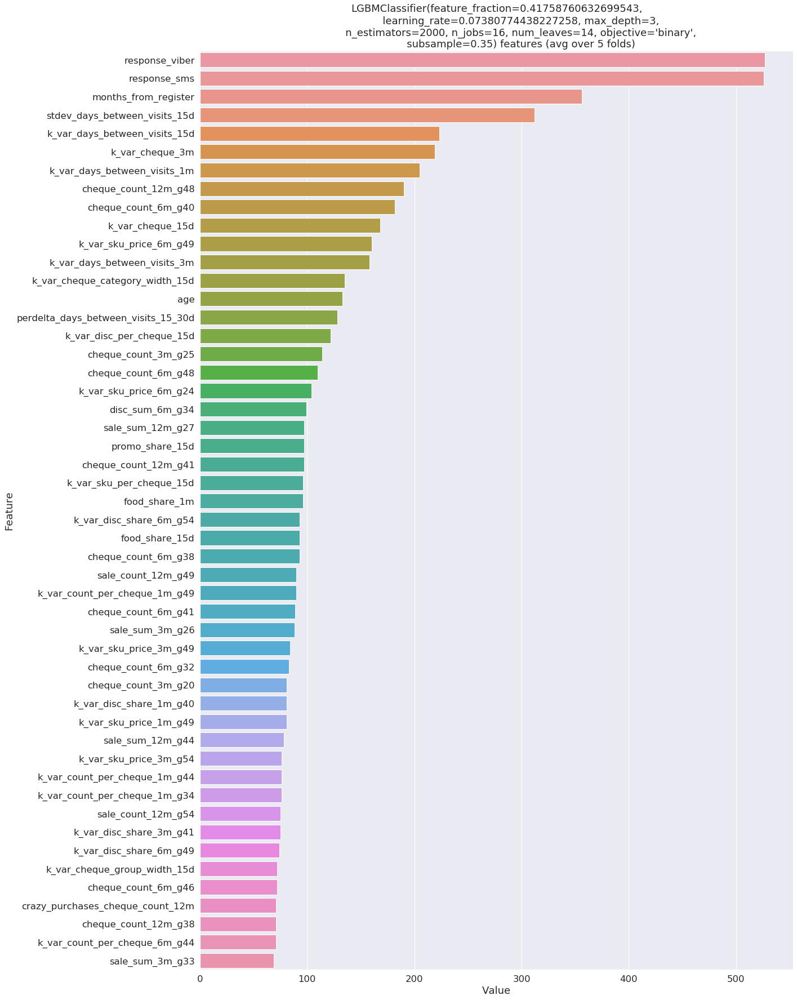

(549623,)                                                                          
Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60185                                             
[100]	valid_0's binary_logloss: 0.598699                                           
[150]	valid_0's binary_logloss: 0.597977                                           
[200]	valid_0's binary_logloss: 0.597789                                           
[250]	valid_0's binary_logloss: 0.597672                                           
[300]	valid_0's binary_logloss: 0.597574                                           
[350]	valid_0's binary_logloss: 0.597552                                           
[400]	valid_0's binary_logloss: 0.597494                                           
[450]	valid_0's binary_logloss: 0.59749                                            
Early stopping, best iteration is:                                          

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60177                                             
[100]	valid_0's binary_logloss: 0.598837                                           
[150]	valid_0's binary_logloss: 0.598166                                           
[200]	valid_0's binary_logloss: 0.598036                                           
[250]	valid_0's binary_logloss: 0.597857                                           
[300]	valid_0's binary_logloss: 0.597856                                           
Early stopping, best iteration is:                                                 
[282]	valid_0's binary_logloss: 0.597848
6.274705015253673                                                                  
(549623,)                                                                          
 98%|█████████▊| 49/50 [2:12:37<01:16, 76.89s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601846                                            
[100]	valid_0's binary_logloss: 0.598746                                           
[150]	valid_0's binary_logloss: 0.598016                                           
[200]	valid_0's binary_logloss: 0.597907                                           
[250]	valid_0's binary_logloss: 0.597834                                           
[300]	valid_0's binary_logloss: 0.597836                                           
Early stopping, best iteration is:                                                 
[258]	valid_0's binary_logloss: 0.597822
5.959478520951173                                                                  
(549623,)                                                                          
 98%|█████████▊| 49/50 [2:12:48<01:16, 76.89s/trial, best loss: -6.376644336453608]

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.60165                                             
[100]	valid_0's binary_logloss: 0.598495                                           
[150]	valid_0's binary_logloss: 0.597839                                           
[200]	valid_0's binary_logloss: 0.597677                                           
[250]	valid_0's binary_logloss: 0.59759                                            
[300]	valid_0's binary_logloss: 0.597554                                           
[350]	valid_0's binary_logloss: 0.597548                                           
Early stopping, best iteration is:                                                 
[314]	valid_0's binary_logloss: 0.59754
6.2915545475909385                                                                 
(549624,)                                                                          
 98%|█████████▊| 49/50 [2:13:00<01:1

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



Training until validation scores don't improve for 50 rounds                       
[50]	valid_0's binary_logloss: 0.601944                                            
[100]	valid_0's binary_logloss: 0.598829                                           
[150]	valid_0's binary_logloss: 0.598142                                           
[200]	valid_0's binary_logloss: 0.597984                                           
[250]	valid_0's binary_logloss: 0.597872                                           
[300]	valid_0's binary_logloss: 0.597812                                           
[350]	valid_0's binary_logloss: 0.597722                                           
[400]	valid_0's binary_logloss: 0.597711                                           
[450]	valid_0's binary_logloss: 0.597648                                           
Early stopping, best iteration is:                                                 
[419]	valid_0's binary_logloss: 0.597636
6.682640375781887                  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':



cross logloss - 0.5976665535940414, cross uplift - 6.2895672998404795,all_uplift_score - 6.275065079792169, all logloss - 0.5976665536382103
 98%|█████████▊| 49/50 [2:13:14<01:16, 76.89s/trial, best loss: -6.376644336453608]

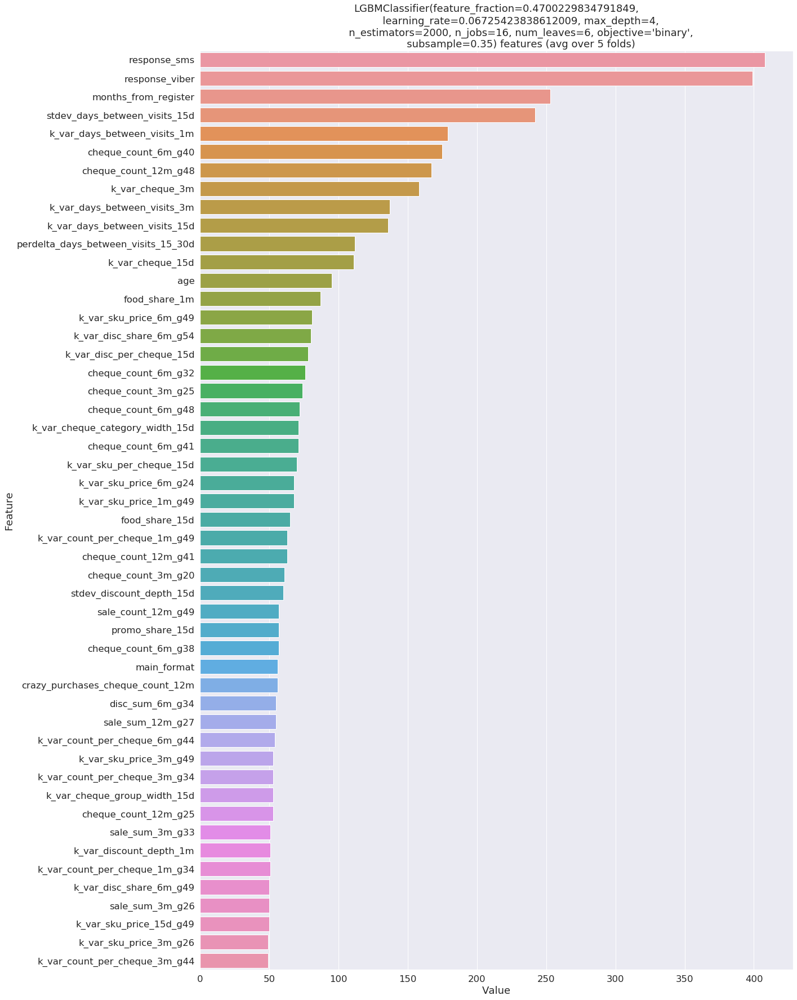

100%|██████████| 50/50 [2:13:16<00:00, 159.94s/trial, best loss: -6.376644336453608]


In [94]:
def optimization_function(params):
    score = train_model(data, target, 'trans_target_single_model_ex_1', params)
    return -score
    

best = fmin(
    optimization_function,
    space=lgbm_hp_hyper_space,
    algo=algo,
    max_evals=50,
    trials=trials,
    verbose=1
)

(549623,)
Training until validation scores don't improve for 50 rounds
[50]	valid_0's binary_logloss: 0.601703
[100]	valid_0's binary_logloss: 0.599092
[150]	valid_0's binary_logloss: 0.598351
[200]	valid_0's binary_logloss: 0.598285
[250]	valid_0's binary_logloss: 0.598194
[300]	valid_0's binary_logloss: 0.598168
Early stopping, best iteration is:
[271]	valid_0's binary_logloss: 0.598164


/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


6.225111279083325
(549623,)
Training until validation scores don't improve for 50 rounds
[50]	valid_0's binary_logloss: 0.601505
[100]	valid_0's binary_logloss: 0.598954
[150]	valid_0's binary_logloss: 0.5984
[200]	valid_0's binary_logloss: 0.598214
[250]	valid_0's binary_logloss: 0.598148
[300]	valid_0's binary_logloss: 0.598141
Early stopping, best iteration is:
[276]	valid_0's binary_logloss: 0.59813


/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


6.290428830907205
(549623,)
Training until validation scores don't improve for 50 rounds
[50]	valid_0's binary_logloss: 0.601509
[100]	valid_0's binary_logloss: 0.5989
[150]	valid_0's binary_logloss: 0.598308
[200]	valid_0's binary_logloss: 0.598133
[250]	valid_0's binary_logloss: 0.59808
[300]	valid_0's binary_logloss: 0.598072
Early stopping, best iteration is:
[266]	valid_0's binary_logloss: 0.598068


/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


6.1657771892062865
(549623,)
Training until validation scores don't improve for 50 rounds
[50]	valid_0's binary_logloss: 0.601324
[100]	valid_0's binary_logloss: 0.598692
[150]	valid_0's binary_logloss: 0.598081
[200]	valid_0's binary_logloss: 0.597929
[250]	valid_0's binary_logloss: 0.597807
[300]	valid_0's binary_logloss: 0.597798
[350]	valid_0's binary_logloss: 0.597792
[400]	valid_0's binary_logloss: 0.597746
[450]	valid_0's binary_logloss: 0.597724
Early stopping, best iteration is:
[436]	valid_0's binary_logloss: 0.597722


/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


6.122950768836971
(549624,)
Training until validation scores don't improve for 50 rounds
[50]	valid_0's binary_logloss: 0.601547
[100]	valid_0's binary_logloss: 0.598911
[150]	valid_0's binary_logloss: 0.598355
[200]	valid_0's binary_logloss: 0.598206
[250]	valid_0's binary_logloss: 0.598148
[300]	valid_0's binary_logloss: 0.598092
[350]	valid_0's binary_logloss: 0.598043
[400]	valid_0's binary_logloss: 0.598
[450]	valid_0's binary_logloss: 0.598006
Early stopping, best iteration is:
[428]	valid_0's binary_logloss: 0.597991


/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


6.875819000431488
cross score - 0.5980148630119356, cross uplift - 6.336017413693055,all_uplift_score - 6.3487626312317, all score - 0.5980148630459745


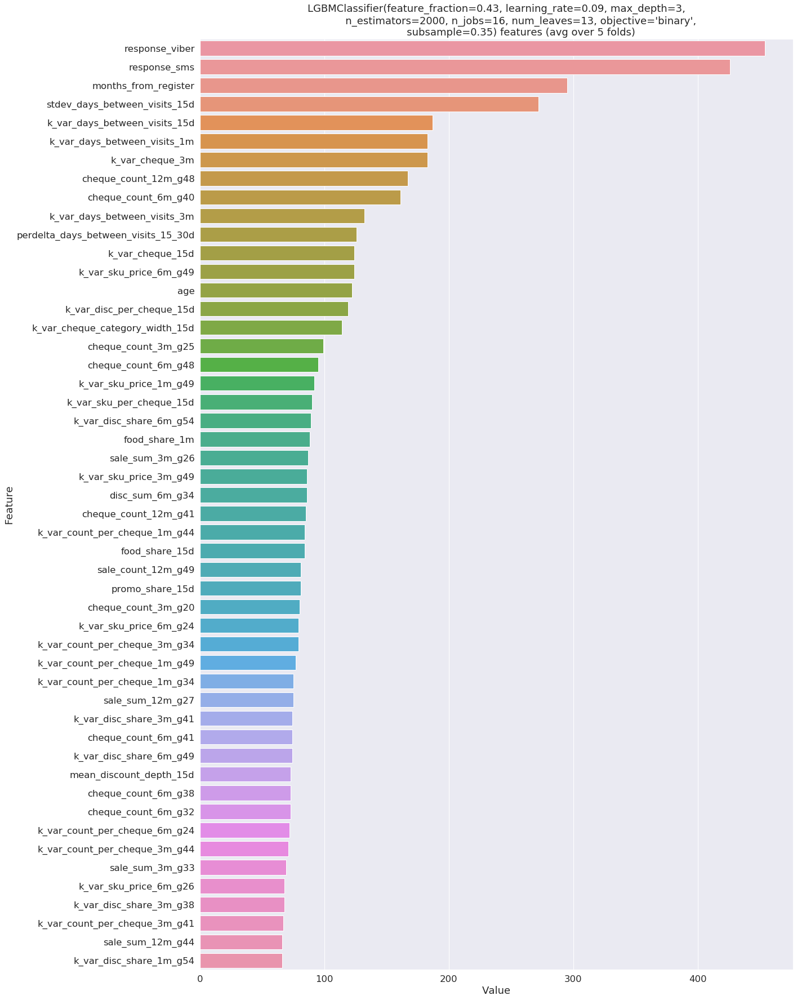

6.336017413693055

In [25]:
train_model(data, target, "trans_target_single_model_ex_1", lqb_params)

communication proba - 0.7509028003184727
(549623,)
Training until validation scores don't improve for 50 rounds
[50]	valid_0's l2: 0.557271
[100]	valid_0's l2: 0.556265
[150]	valid_0's l2: 0.556421
Early stopping, best iteration is:
[111]	valid_0's l2: 0.556202


/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


0.6912555471730863
(549623,)
Training until validation scores don't improve for 50 rounds
[50]	valid_0's l2: 0.55324
[100]	valid_0's l2: 0.552509
Early stopping, best iteration is:
[88]	valid_0's l2: 0.552444


/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


1.5097548681703072
(549623,)
Training until validation scores don't improve for 50 rounds
[50]	valid_0's l2: 0.553691
[100]	valid_0's l2: 0.553189
Early stopping, best iteration is:
[95]	valid_0's l2: 0.553139


/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


0.4131409512406703
(549623,)
Training until validation scores don't improve for 50 rounds
[50]	valid_0's l2: 0.557609
[100]	valid_0's l2: 0.556982
Early stopping, best iteration is:
[72]	valid_0's l2: 0.556837


/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


1.2852045222463693
(549624,)
Training until validation scores don't improve for 50 rounds
[50]	valid_0's l2: 0.558619
[100]	valid_0's l2: 0.557859
[150]	valid_0's l2: 0.557848
Early stopping, best iteration is:
[112]	valid_0's l2: 0.557692


/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


0.6335942472308592
cross score - 0.5552627818833074, cross uplift - 0.9065900272122585,all_uplift_score - 0.9155476925477024, all score - 0.5552627783468013


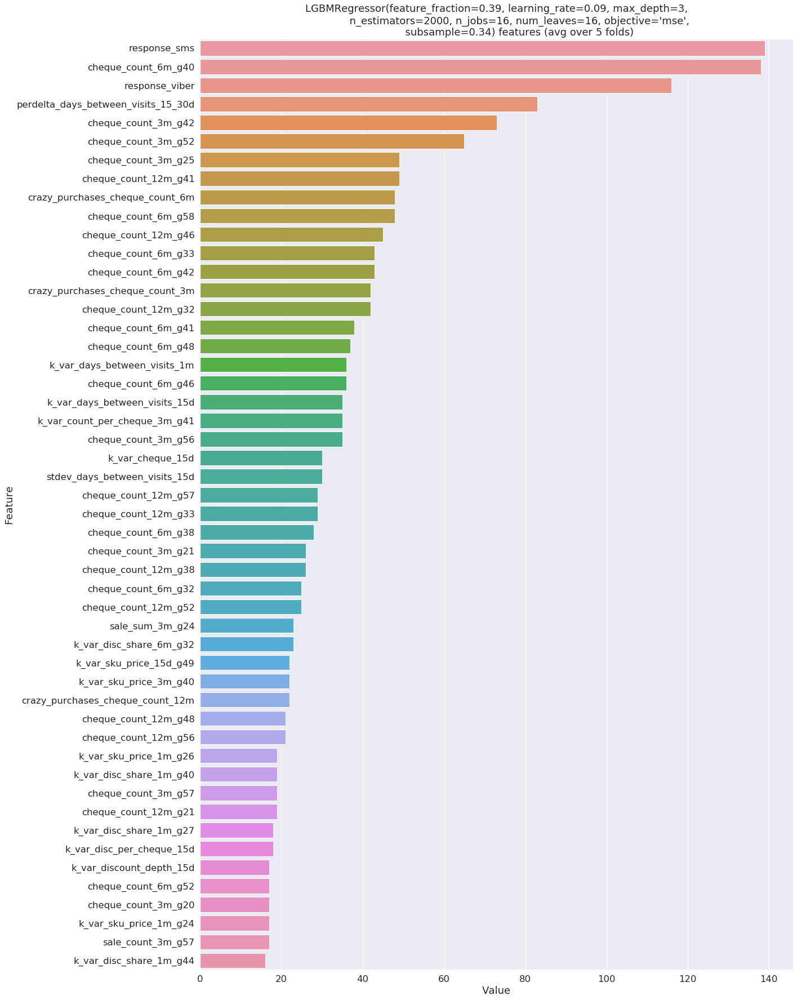

0.9065900272122585

In [135]:
lqb_params_regression = {
    "boosting_type": "gbdt",
    "feature_fraction": 0.39,
    "learning_rate": 0.09,
    "max_depth": 3,
    "n_estimators": 2000,
    "num_leaves": 16,
    "objective": "mse",
    "subsample": 0.34,
    "n_jobs": 16
}

train_model(
    data,
    target,
    'trans_target_regr_single_model_ex_1',
    lqb_params=lqb_params_regression,
    transform_function=transform_regression,
    score_function=mean_squared_error
)

In [224]:
experiment = Experiment(workspace=ws, name="trans_target_single_model_ex_1")

best_run = None
best_metric = 0

for run in experiment.get_runs():
    score = run.get_metrics().get('cross_uplift_score', 0)
    if score > best_metric and score < 7.:
        best_metric = score
        best_run = run

In [223]:
best_run.tags

{'boosting_type': 'gbdt',
 'feature_fraction': '0.43662158734680007',
 'learning_rate': '0.09210636393135872',
 'max_depth': '3',
 'n_estimators': '2000',
 'n_jobs': '16',
 'num_leaves': '13',
 'objective': 'binary',
 'subsample': '0.35'}

In [221]:
best_run.get_metrics()

{'logloss': [0.5980245216358188,
  0.5980600772018068,
  0.5981039043130413,
  0.5977721493508438,
  0.5980956882438858],
 'uplift_score': [6.340726405544844,
  6.366834728659088,
  6.1694888063674815,
  6.167212054708626,
  6.8389596869880025],
 'cross_logloss': 0.5980112681490792,
 'cross_uplift_score': 6.376644336453608,
 'all_uplift_score': 6.356521096261128,
 'all_logloss_score': 0.5980112680262025}

In [16]:
models_path = 'models/trans_target_single_model_ex_1/'

In [208]:
best_run.download_files(output_directory=models_path)

In [209]:
best_run.restore_snapshot(path=models_path)

'/home/hacker_4/notebooks/best_run.snapshot/e8b82469-8e6b-4291-9ec2-65364b09e3ca.zip'

In [15]:
test_data = pd.read_csv("test.csv")

In [17]:
models = []
for file in os.listdir(models_path):
    if file.endswith("pkl"):
        model = joblib.load(os.path.join(models_path, file))
        models.append(model)

In [237]:
from azureml.core.model import Model

model = Model.register(model_path = "best_run.snapshot/",
                       model_name = "trans_target_classify",
                       description = "transformed target for clasfification, optimized model",
                       workspace = ws,
                        tags=best_run.tags)

Registering model trans_target_classify


In [18]:
test_data['gender'] = [1 if value == 'М' else 0 for value in test_data['gender']]

In [19]:
predictions = np.zeros(test_data.shape[0])

for model in models:
    predictions += model.predict_proba(test_data)[:, 1]
    
predictions /= len(models)

In [20]:
predictions

array([0.37716004, 0.22092352, 0.25886654, ..., 0.28946886, 0.26007389,
       0.2711602 ])

In [231]:
predictions = models[2].predict_proba(test_data)[:, 1]

In [232]:
predictions

array([0.39581844, 0.2265763 , 0.26135377, ..., 0.29258978, 0.23989914,
       0.26408144])

In [21]:
submission = test_data[["CardHolder"]]

submission["uplift"] = predictions

submission.to_csv("submission.csv", index=False, sep=';')

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [218]:
example = pd.read_csv('../zeros.csv', sep=';')
example.drop(columns=["uplift"], inplace=True)

submission = test_data[["CardHolder"]]

submission["uplift"] = predictions

example = example.merge(submission, on="CardHolder", how="left").fillna(0)

example.to_csv("submission.csv", index=False, sep=';')

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [230]:
!head -n 5 submission.csv

CardHolder;uplift
16400802;0.391419350581815
15752880;0.22674719383564157
15978290;0.25752748335468206
16604118;0.28712805540510844
